In [2]:
import pandas as pd
from tqdm import tqdm
import numpy as np
from numpy import mean, std
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import matplotlib.dates as mdates
from matplotlib.dates import DateFormatter
import matplotlib.cm as cm

from geopy.distance import geodesic
import geopandas as gpd
from shapely.geometry import Point, Polygon
from geopandas import GeoDataFrame

from kneed import KneeLocator
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

%matplotlib inline
plt.style.use('ggplot')

In [1411]:
#source: https://www.gov.uk/guidance/about-the-price-paid-data#explanations-of-column-headers-in-the-ppd

header_list = ['transaction_id', 'price', 'date', 'postcode', 'property_type', 'new_build', 'lease_duration',
              'house_name_num', 'secondary_name', 'street', 'locality', 'town_city', 'district', 'county',
              'price_paid_category', 'record_status']

# Loading Data:

In [1412]:
house_purchases = pd.read_csv('Data/pp_complete.csv', names = header_list)

In [1413]:
house_purchases.head(3)

,transaction_id,price,date,postcode,property_type,new_build,lease_duration,house_name_num,secondary_name,street,locality,town_city,district,county,price_paid_category,record_status
0,{A42E2F04-2538-4A25-94C5-49E29C6C8FA8},18500,1995-01-31 00:00,TQ1 1RY,F,N,L,VILLA PARADISO,FLAT 10,HIGHER WARBERRY ROAD,TORQUAY,TORQUAY,TORBAY,TORBAY,A,A
1,{1BA349E3-2579-40D6-999E-49E2A25D2284},73450,1995-10-09 00:00,L26 7XJ,D,Y,F,6,NaN,CATKIN ROAD,LIVERPOOL,LIVERPOOL,KNOWSLEY,MERSEYSIDE,A,A
2,{E5B50DCB-BC7A-4E54-B167-49E2A6B4148B},59000,1995-03-31 00:00,BH12 2AE,D,N,F,28,NaN,ALDER ROAD,POOLE,POOLE,POOLE,POOLE,A,A


# 2020 Data:

In [1414]:
twtw_data = pd.read_csv('Data/2020_data.csv', names = header_list)
twtw_data['date'] = pd.to_datetime(twtw_data['date'])
twtw_data['year'] = pd.DatetimeIndex(twtw_data['date']).year
twtw_data['month'] = pd.DatetimeIndex(twtw_data['date']).month

In [1415]:
twtw_data['yr_month'] = twtw_data['date'].dt.strftime('%Y-%m')

In [1416]:
oct_data = twtw_data.loc[twtw_data['month']==10]

In [1417]:
oct_data.month.value_counts()

10    19834
Name: month, dtype: int64

# Joining Dataframes:

In [1418]:
house_purchases['date'] = pd.to_datetime(house_purchases['date'])
house_purchases['yr_month'] = house_purchases['date'].dt.strftime('%Y-%m')
house_purchases['year'] = pd.DatetimeIndex(house_purchases['date']).year
house_purchases['month'] = pd.DatetimeIndex(house_purchases['date']).month

In [1419]:
house_purchases = house_purchases.loc[~((house_purchases['year']==2020) & (house_purchases['month']==10))]

In [11]:
house_purchases.shape

(25597619, 19)

In [1420]:
hp_concat = pd.concat([house_purchases, oct_data])

In [1421]:
# Removing Other and U:
hp_concat = hp_concat[hp_concat['lease_duration'] != 'U']
hp_concat = hp_concat[hp_concat['property_type'] != 'O']

In [14]:
hp_concat.lease_duration.value_counts()

F    19329274
L     5977769
Name: lease_duration, dtype: int64

In [1506]:
# Altering Property Type Column:
hp_concat['property_type'] = hp_concat['property_type'].str.replace('F','Flat')
hp_concat['property_type'] = hp_concat['property_type'].str.replace('D','Detached')
hp_concat['property_type'] = hp_concat['property_type'].str.replace('S','Semi-Detached')
hp_concat['property_type'] = hp_concat['property_type'].str.replace('T','Terraced')

# ALtering old/new_build column:
hp_concat['new_build'] = hp_concat['new_build'].str.replace('N','Existing Build')
hp_concat['new_build'] = hp_concat['new_build'].str.replace('Y','New Build')

# Altering lease_duration column:
hp_concat['lease_duration'] = hp_concat['lease_duration'].str.replace('L','Leasehold')
hp_concat['lease_duration'] = hp_concat['lease_duration'].str.replace('F','Freehold')

In [ ]:
hp_concat = hp_concat[hp_concat['price']<= 100000000]

# Convert Price to Real Price:

In [1465]:
rpi = pd.read_csv('Data/RPI_all_items.csv')

In [1466]:
rpi.drop(['date', 'og_base'], axis=1, inplace=True)
rpi.rename(columns={'month_no': 'month'}, inplace=True)
rpi.head()

,year,month,oct_20_rebase
0,1995,1,2.015753
1,1995,2,2.003404
2,1995,3,1.995254
3,1995,4,1.975168
4,1995,5,1.967246


In [ ]:
# Merging the rpi df with our house price df:
hp_with_real_prices = pd.merge(hp_concat, rpi, how = 'left', on = ['year', 'month'])

In [ ]:
# Creating a column of real prices to use for my analysis:
hp_with_real_prices['real_price'] = hp_with_real_prices['price']*hp_with_real_prices['oct_20_rebase']

In [1516]:
hp_with_real_prices.head(3)

,transaction_id,price,date,postcode,property_type,new_build,lease_duration,house_name_num,secondary_name,street,...,town_city,district,county,price_paid_category,record_status,yr_month,year,month,oct_20_rebase,real_price
0,{A42E2F04-2538-4A25-94C5-49E29C6C8FA8},18500,1995-01-31,TQ1 1RY,F,N,L,VILLA PARADISO,FLAT 10,HIGHER WARBERRY ROAD,...,TORQUAY,TORBAY,TORBAY,A,A,1995-01,1995,1,2.015753,37291.438363
1,{1BA349E3-2579-40D6-999E-49E2A25D2284},73450,1995-10-09,L26 7XJ,D,Y,F,6,NaN,CATKIN ROAD,...,LIVERPOOL,KNOWSLEY,MERSEYSIDE,A,A,1995-10,1995,10,1.964619,144301.301761
2,{E5B50DCB-BC7A-4E54-B167-49E2A6B4148B},59000,1995-03-31,BH12 2AE,D,N,F,28,NaN,ALDER ROAD,...,POOLE,POOLE,POOLE,A,A,1995-03,1995,3,1.995254,117719.999983


# ---------------------SAVE/ Load Dataframe!!

In [10]:
hp_with_real_prices = pd.read_csv('Data/hp_with_real_prices.csv')

# Time Series - Grouped by Date:

In [13]:
time_and_price = hp_with_real_prices[['yr_month', 'real_price']]

In [14]:
# creating a column to count the number of sales during the time period
time_and_price['n_sales'] = 1

C:\Users\rozhouse\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [15]:
time_and_price.head()

,yr_month,real_price,n_sales
0,1995-01,37291.438363,1
1,1995-10,144301.301761,1
2,1995-03,117719.999983,1
3,1995-12,60539.482430,1
4,1995-09,185647.410365,1


In [16]:
price_mean = time_and_price.groupby('yr_month')["real_price"].mean().reset_index(name = 'av_real_price')
n_count = time_and_price.groupby('yr_month')["n_sales"].sum().reset_index(name = 'monthly_sales')

In [17]:
time_series = pd.merge(price_mean, n_count, how='left', on='yr_month')

In [18]:
time_series.head()

,yr_month,av_real_price,monthly_sales
0,1995-01,137601.355920,50467
1,1995-02,131522.181577,50838
2,1995-03,131179.662377,71274
3,1995-04,133930.302375,60272
4,1995-05,131940.324041,67830


In [19]:
time_series['ann_price_change'] = time_series.av_real_price.pct_change(periods=12)
time_series['ann_change_n_sold'] = time_series.monthly_sales.pct_change(periods=12)

In [20]:
time_series.head()

,yr_month,av_real_price,monthly_sales,ann_price_change,ann_change_n_sold
0,1995-01,137601.355920,50467,NaN,NaN
1,1995-02,131522.181577,50838,NaN,NaN
2,1995-03,131179.662377,71274,NaN,NaN
3,1995-04,133930.302375,60272,NaN,NaN
4,1995-05,131940.324041,67830,NaN,NaN


In [21]:
# Dropping the first year where there is no annual comparison
change_time_series = time_series[12:]

In [22]:
change_time_series.head()

,yr_month,av_real_price,monthly_sales,ann_price_change,ann_change_n_sold
12,1996-01,133717.512179,51460,-0.028225,0.019676
13,1996-02,129700.931125,54463,-0.013847,0.071305
14,1996-03,128705.479719,73143,-0.018861,0.026223
15,1996-04,134397.622844,68220,0.003489,0.131869
16,1996-05,133703.119850,83579,0.013361,0.232183


In [23]:
change_time_series['yr_month'] = pd.to_datetime(change_time_series['yr_month'])

C:\Users\rozhouse\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [24]:
change_time_series.dtypes

yr_month             datetime64[ns]
av_real_price               float64
monthly_sales                 int64
ann_price_change            float64
ann_change_n_sold           float64
dtype: object

# Plotting Time Series:

C:\Users\rozhouse\Anaconda3\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


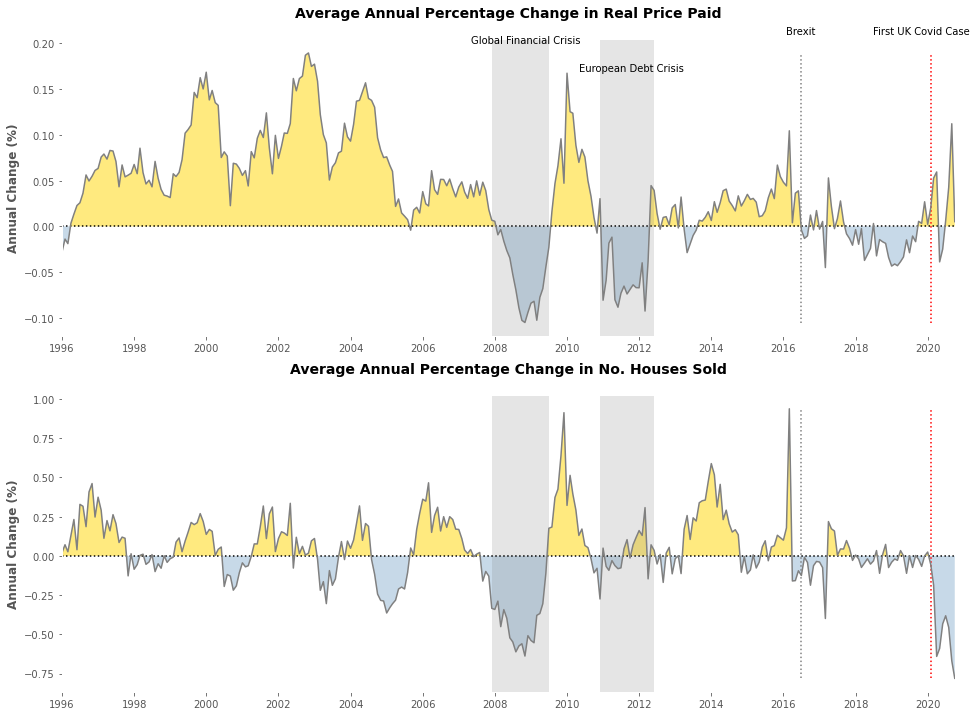

In [16]:
plt.rcParams['axes.facecolor'] = 'white'
fig, axs = plt.subplots(2, 1, figsize=(16, 12), dpi=300)
dat = change_time_series.yr_month

y_diffs_price = change_time_series.ann_price_change
y_diffs_n = change_time_series.ann_change_n_sold

sns.lineplot(data=change_time_series, x="yr_month", y="ann_price_change", color= 'grey', ax=axs[0])
sns.lineplot(data=change_time_series, x="yr_month", y="ann_change_n_sold", color= 'grey', ax=axs[1])

# Filling between x axis and plots:
axs[0].fill_between(dat, y_diffs_price, 0, where=y_diffs_price >= 0, facecolor='gold', interpolate=True, alpha=0.5)
axs[0].fill_between(dat, y_diffs_price, 0, where=y_diffs_price <= 0, facecolor='steelblue', interpolate=True, alpha=0.3)
axs[1].fill_between(dat, y_diffs_n, 0, where=y_diffs_n >= 0, facecolor='gold', interpolate=True, alpha=0.5)
axs[1].fill_between(dat, y_diffs_n, 0, where=y_diffs_n <= 0, facecolor='steelblue', interpolate=True, alpha=0.3)

# Annotating text and grey vertical bars:
a = time_series.yr_month[155:156]
b = time_series.yr_month[174:175]
c = time_series.yr_month[191:192]
d = time_series.yr_month[209:210]
e = time_series.yr_month[301:302]
f = time_series.yr_month[309:310]

axs[0].axvspan(a, b, color='grey', alpha=0.2, lw=0)
axs[0].text(time_series.yr_month[148:149], 0.2, "Global Financial Crisis")
axs[0].axvspan(c, d, color='grey', alpha=0.2, lw=0)
axs[0].text(time_series.yr_month[184:185], 0.17, "European Debt Crisis")
axs[1].axvspan(a, b, color='grey', alpha=0.2, lw=0)
axs[1].axvspan(c, d, color='grey', alpha=0.2, lw=0)

# Plotting vertical dashed lines
axs[0].vlines(time_series.yr_month[301:302], min(y_diffs_price), max(y_diffs_price), linestyle="dotted", color = 'red')
axs[0].text(time_series.yr_month[282:283], 0.21, "First UK Covid Case")
axs[0].vlines(time_series.yr_month[258:259], min(y_diffs_price), max(y_diffs_price), linestyle="dotted", color = 'grey')
axs[0].text(time_series.yr_month[253:254], 0.21, "Brexit")
axs[1].vlines(time_series.yr_month[301:302], min(y_diffs_n), max(y_diffs_n), linestyle="dotted", color = 'red')
axs[1].vlines(time_series.yr_month[258:259], min(y_diffs_n), max(y_diffs_n), linestyle="dotted", color = 'grey')

# Setting the limits and ticks of the x axis:
axs[0].set_xlim(min(dat), max(dat))
axs[1].set_xlim(min(dat), max(dat))

date_form = DateFormatter("%Y")
axs[0].xaxis.set_major_formatter(date_form)
axs[0].xaxis.set_major_locator(mdates.YearLocator(2))
axs[1].xaxis.set_major_formatter(date_form)
axs[1].xaxis.set_major_locator(mdates.YearLocator(2))

# Plotting horizontal dashed lines
axs[0].hlines(0, min(dat), max(dat), linestyle="dotted", color = 'black')
axs[1].hlines(0, min(dat), max(dat), linestyle="dotted", color = 'black')

axs[0].set_title('Average Annual Percentage Change in Real Price Paid\n', fontsize = 14, fontweight = 'bold')
axs[1].set_title('\nAverage Annual Percentage Change in No. Houses Sold\n', fontsize = 14, fontweight = 'bold')

axs[0].set_ylabel('Annual Change (%)', fontsize = 12, fontweight = 'bold')
axs[0].set_xlabel('')
axs[1].set_ylabel('Annual Change (%)', fontsize = 12, fontweight = 'bold')
axs[1].set_xlabel('')

plt.savefig('Figures/overall_ts.png', bbox_inches='tight')
plt.show()

- 2020 is the first time there has been a massive divergence between number of houses sold and annual change in price paid.

# Plotting Divergence of Averages:

In [25]:
change_time_series.head()

,yr_month,av_real_price,monthly_sales,ann_price_change,ann_change_n_sold
12,1996-01-01,133717.512179,51460,-0.028225,0.019676
13,1996-02-01,129700.931125,54463,-0.013847,0.071305
14,1996-03-01,128705.479719,73143,-0.018861,0.026223
15,1996-04-01,134397.622844,68220,0.003489,0.131869
16,1996-05-01,133703.119850,83579,0.013361,0.232183


In [26]:
change_time_series['price_n_diffs'] = change_time_series['ann_price_change'] - change_time_series['ann_change_n_sold']

C:\Users\rozhouse\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


C:\Users\rozhouse\Anaconda3\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


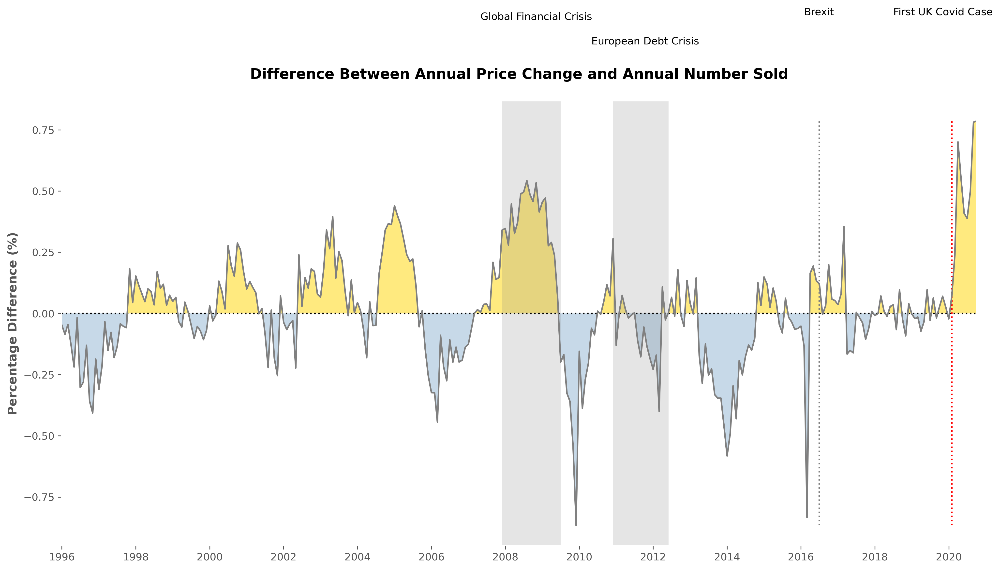

In [1511]:
plt.rcParams['axes.facecolor'] = 'white'
fig, axs = plt.subplots(1, 1, figsize=(16, 8), dpi=300)
dat = change_time_series.yr_month

y_diffs = change_time_series.price_n_diffs

sns.lineplot(data=change_time_series, x="yr_month", y="price_n_diffs", color= 'grey')

# Filling between x axis and plots:
axs.fill_between(dat, y_diffs, 0, where=y_diffs >= 0, facecolor='gold', interpolate=True, alpha=0.5)
axs.fill_between(dat, y_diffs, 0, where=y_diffs <= 0, facecolor='steelblue', interpolate=True, alpha=0.3)


# Annotating text and grey vertical bars:
a = time_series.yr_month[155:156]
b = time_series.yr_month[174:175]
c = time_series.yr_month[191:192]
d = time_series.yr_month[209:210]
e = time_series.yr_month[301:302]
f = time_series.yr_month[309:310]

axs.axvspan(a, b, color='grey', alpha=0.2, lw=0)
axs.text(time_series.yr_month[148:149], 1.2, "Global Financial Crisis")
axs.axvspan(c, d, color='grey', alpha=0.2, lw=0)
axs.text(time_series.yr_month[184:185], 1.1, "European Debt Crisis")


# Plotting vertical dashed lines
axs.vlines(time_series.yr_month[301:302], min(y_diffs), max(y_diffs), linestyle="dotted", color = 'red')
axs.text(time_series.yr_month[282:283], 1.22, "First UK Covid Case")
axs.vlines(time_series.yr_month[258:259], min(y_diffs), max(y_diffs), linestyle="dotted", color = 'grey')
axs.text(time_series.yr_month[253:254], 1.22, "Brexit")


# Setting the limits and ticks of the x axis:
axs.set_xlim(min(dat), max(dat))

date_form = DateFormatter("%Y")
axs.xaxis.set_major_formatter(date_form)
axs.xaxis.set_major_locator(mdates.YearLocator(2))

# Plotting horizontal dashed lines
axs.hlines(0, min(dat), max(dat), linestyle="dotted", color = 'black')

axs.set_title('Difference Between Annual Price Change and Annual Number Sold\n', fontsize = 14, fontweight = 'bold')

axs.set_ylabel('Percentage Difference (%)', fontsize = 12, fontweight = 'bold')
axs.set_xlabel('')

plt.savefig('Figures/change_overall_ts.png', bbox_inches='tight')
plt.show()

# Looking at London vs Rest of UK:

In [27]:
hp_w_county = hp_with_real_prices[['yr_month', 'real_price', 'county']]

In [28]:
# creating a column to count the number of sales during the time period
hp_w_county['n_sales'] = 1

C:\Users\rozhouse\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [29]:
hp_w_county

,yr_month,real_price,county,n_sales
0,1995-01,37291.438363,TORBAY,1
1,1995-10,144301.301761,MERSEYSIDE,1
2,1995-03,117719.999983,POOLE,1
3,1995-12,60539.482430,SUFFOLK,1
4,1995-09,185647.410365,STAFFORDSHIRE,1
...,...,...,...,...
25307037,2020-10,410000.000000,TORBAY,1
25307038,2020-10,300000.000000,"BOURNEMOUTH, CHRISTCHURCH AND POOLE",1
25307039,2020-10,88000.000000,CUMBRIA,1
25307040,2020-10,210000.000000,"BOURNEMOUTH, CHRISTCHURCH AND POOLE",1


In [30]:
tp_lon = hp_w_county[hp_w_county['county']=='GREATER LONDON']
tp_ex_lon = hp_w_county[hp_w_county['county']!='GREATER LONDON']

In [31]:
price_mean_lon = tp_lon.groupby('yr_month')["real_price"].mean().reset_index(name = 'av_real_price')
n_count_lon = tp_lon.groupby('yr_month')["n_sales"].sum().reset_index(name = 'monthly_sales')
price_mean_ex_lon = tp_ex_lon.groupby('yr_month')["real_price"].mean().reset_index(name = 'av_real_price')
n_count_ex_lon = tp_ex_lon.groupby('yr_month')["n_sales"].sum().reset_index(name = 'monthly_sales')

In [32]:
time_series_lon = pd.merge(price_mean_lon, n_count_lon, how='left', on='yr_month')
time_series_ex_lon = pd.merge(price_mean_ex_lon, n_count_ex_lon, how='left', on='yr_month')

In [33]:
time_series_lon['ann_price_change'] = time_series_lon.av_real_price.pct_change(periods=12)
time_series_lon['ann_change_n_sold'] = time_series_lon.monthly_sales.pct_change(periods=12)
time_series_ex_lon['ann_price_change'] = time_series_ex_lon.av_real_price.pct_change(periods=12)
time_series_ex_lon['ann_change_n_sold'] = time_series_ex_lon.monthly_sales.pct_change(periods=12)

In [34]:
change_time_series_lon = time_series_lon[12:]
change_time_series_ex_lon = time_series_ex_lon[12:]

In [35]:
change_time_series_lon['yr_month'] = pd.to_datetime(change_time_series_lon['yr_month'])
change_time_series_ex_lon['yr_month'] = pd.to_datetime(change_time_series_ex_lon['yr_month'])

C:\Users\rozhouse\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\rozhouse\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


C:\Users\rozhouse\Anaconda3\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


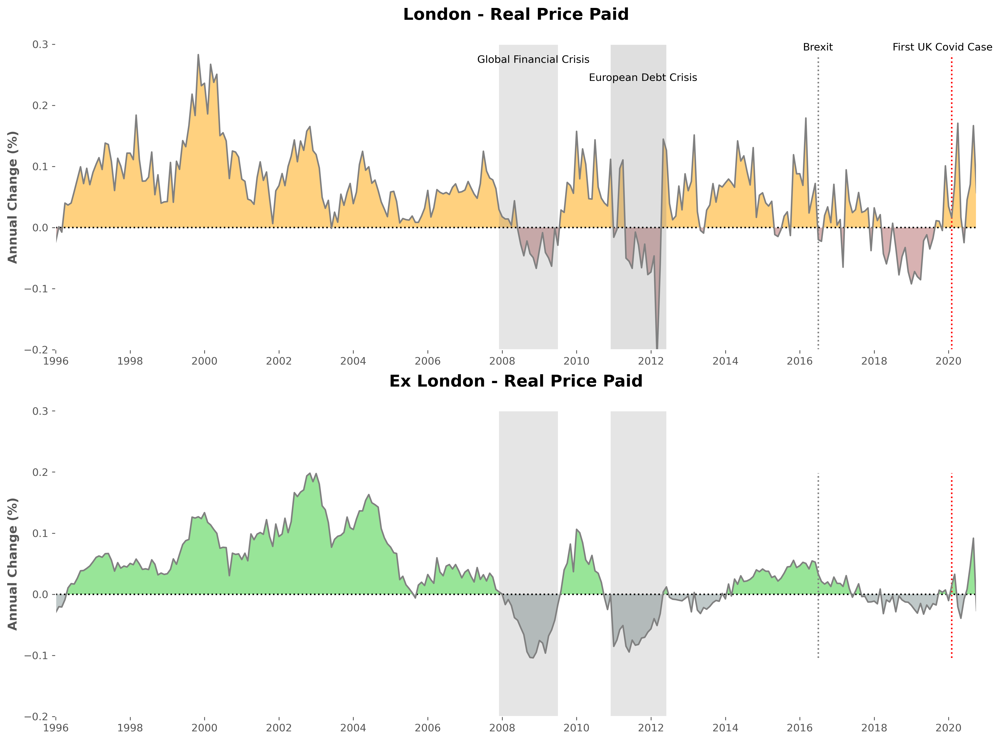

In [1494]:
plt.rcParams['axes.facecolor'] = 'white'
fig, axs = plt.subplots(2, 1, figsize=(16, 12), dpi=300)
dat = change_time_series.yr_month

y_diffs_lon = change_time_series_lon.ann_price_change
y_diffs_ex_lon = change_time_series_ex_lon.ann_price_change

sns.lineplot(data=change_time_series_lon, x="yr_month", y="ann_price_change", color= 'grey', ax=axs[0])
sns.lineplot(data=change_time_series_ex_lon, x="yr_month", y="ann_price_change", color= 'grey', ax=axs[1])

# Filling between x axis and plots:
axs[0].fill_between(dat, y_diffs_lon, 0, where=y_diffs_lon >= 0, facecolor='orange', interpolate=True, alpha=0.5)
axs[0].fill_between(dat, y_diffs_lon, 0, where=y_diffs_lon <= 0, facecolor='maroon', interpolate=True, alpha=0.3)
axs[1].fill_between(dat, y_diffs_ex_lon, 0, where=y_diffs_ex_lon >= 0, facecolor='limegreen', interpolate=True, alpha=0.5)
axs[1].fill_between(dat, y_diffs_ex_lon, 0, where=y_diffs_ex_lon <= 0, facecolor='darkslategrey', interpolate=True, alpha=0.3)

# Annotating text and grey vertical bars:
a = time_series.yr_month[155:156]
b = time_series.yr_month[174:175]
c = time_series.yr_month[191:192]
d = time_series.yr_month[209:210]
e = time_series.yr_month[301:302]
f = time_series.yr_month[309:310]

axs[0].axvspan(a, b, color='grey', alpha=0.2, lw=0)
axs[0].text(time_series.yr_month[148:149], 0.27, "Global Financial Crisis")
axs[0].axvspan(c, d, color='grey', alpha=0.25, lw=0)
axs[0].text(time_series.yr_month[184:185], 0.24, "European Debt Crisis")
axs[1].axvspan(a, b, color='grey', alpha=0.2, lw=0)
axs[1].axvspan(c, d, color='grey', alpha=0.2, lw=0)

# Plotting vertical dashed lines
axs[0].vlines(time_series.yr_month[301:302], min(y_diffs_lon), max(y_diffs_lon), linestyle="dotted", color = 'red')
axs[0].text(time_series.yr_month[282:283], 0.29, "First UK Covid Case")
axs[0].vlines(time_series.yr_month[258:259], min(y_diffs_lon), max(y_diffs_lon), linestyle="dotted", color = 'grey')
axs[0].text(time_series.yr_month[253:254], 0.29, "Brexit")
axs[1].vlines(time_series.yr_month[301:302], min(y_diffs_ex_lon), max(y_diffs_ex_lon), linestyle="dotted", color = 'red')
axs[1].vlines(time_series.yr_month[258:259], min(y_diffs_ex_lon), max(y_diffs_ex_lon), linestyle="dotted", color = 'grey')

# Setting the limits and ticks of the x axis:
axs[0].set_xlim(min(dat), max(dat))
axs[1].set_xlim(min(dat), max(dat))
axs[0].set_ylim(-0.2, 0.3)
axs[1].set_ylim(-0.2, 0.3)

date_form = DateFormatter("%Y")
axs[0].xaxis.set_major_formatter(date_form)
axs[0].xaxis.set_major_locator(mdates.YearLocator(2))
axs[1].xaxis.set_major_formatter(date_form)
axs[1].xaxis.set_major_locator(mdates.YearLocator(2))

# Plotting horizontal dashed lines
axs[0].hlines(0, min(dat), max(dat), linestyle="dotted", color = 'black')
axs[1].hlines(0, min(dat), max(dat), linestyle="dotted", color = 'black')

axs[0].set_title('London - Real Price Paid\n', fontsize = 16, fontweight = 'bold')
axs[1].set_title('\nEx London - Real Price Paid\n', fontsize = 16, fontweight = 'bold')

axs[0].set_ylabel('Annual Change (%)', fontsize = 12, fontweight = 'bold')
axs[0].set_xlabel('')
axs[1].set_ylabel('Annual Change (%)', fontsize = 12, fontweight = 'bold')
axs[1].set_xlabel('')

plt.savefig('Figures/lon_price_change.png', bbox_inches='tight')
plt.show()

- Difference here showing London was able to capture an increase in price paid more quickly than ex-London. This may reflect estate agents being more technologially advanced in the capital and able to offer online-viewings. It could also reflect the higher base level of demand for London properties also.

C:\Users\rozhouse\Anaconda3\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


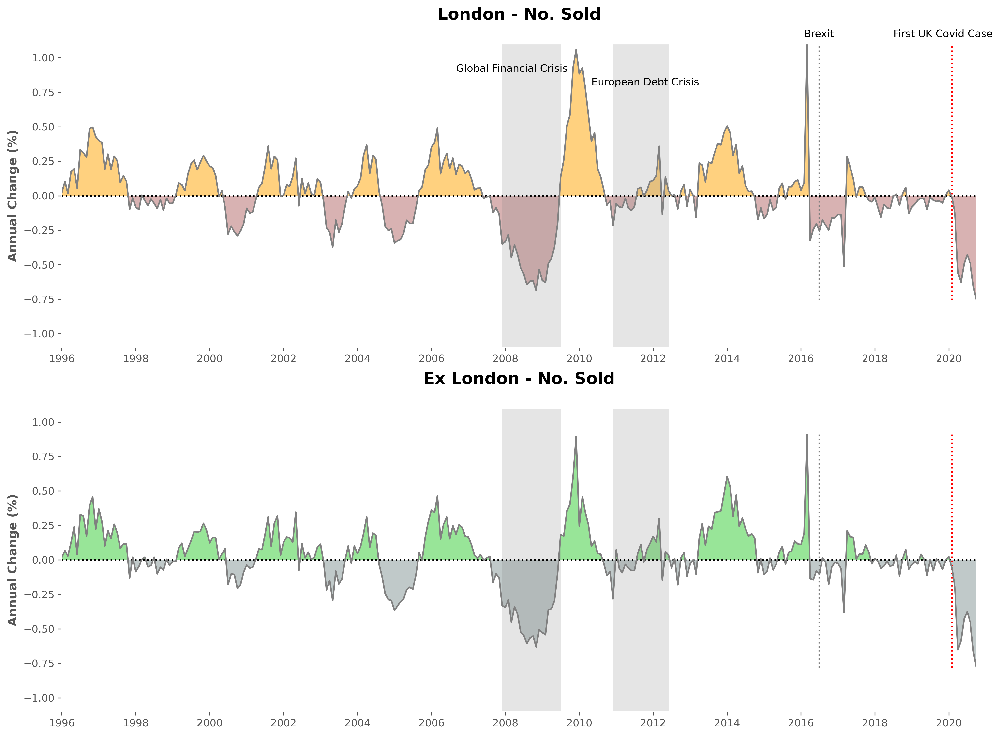

In [1495]:
plt.rcParams['axes.facecolor'] = 'white'
fig, axs = plt.subplots(2, 1, figsize=(16, 12), dpi = 300)
dat = change_time_series.yr_month

y_diffs_lon = change_time_series_lon.ann_change_n_sold
y_diffs_ex_lon = change_time_series_ex_lon.ann_change_n_sold

sns.lineplot(data=change_time_series_lon, x="yr_month", y="ann_change_n_sold", color= 'grey', ax=axs[0])
sns.lineplot(data=change_time_series_ex_lon, x="yr_month", y="ann_change_n_sold", color= 'grey', ax=axs[1])

# Filling between x axis and plots:
axs[0].fill_between(dat, y_diffs_lon, 0, where=y_diffs_lon >= 0, facecolor='orange', interpolate=True, alpha=0.5)
axs[0].fill_between(dat, y_diffs_lon, 0, where=y_diffs_lon <= 0, facecolor='maroon', interpolate=True, alpha=0.3)
axs[1].fill_between(dat, y_diffs_ex_lon, 0, where=y_diffs_ex_lon >= 0, facecolor='limegreen', interpolate=True, alpha=0.5)
axs[1].fill_between(dat, y_diffs_ex_lon, 0, where=y_diffs_ex_lon <= 0, facecolor='darkslategrey', interpolate=True, alpha=0.3)

# Annotating text and grey vertical bars:
a = time_series.yr_month[155:156]
b = time_series.yr_month[174:175]
c = time_series.yr_month[191:192]
d = time_series.yr_month[209:210]
e = time_series.yr_month[301:302]
f = time_series.yr_month[309:310]

axs[0].axvspan(a, b, color='grey', alpha=0.2, lw=0)
axs[0].text(time_series.yr_month[140:141], 0.9, "Global Financial Crisis")
axs[0].axvspan(c, d, color='grey', alpha=0.2, lw=0)
axs[0].text(time_series.yr_month[184:185], 0.8, "European Debt Crisis")
axs[1].axvspan(a, b, color='grey', alpha=0.2, lw=0)
axs[1].axvspan(c, d, color='grey', alpha=0.2, lw=0)

# Plotting vertical dashed lines
axs[0].vlines(time_series.yr_month[301:302], min(y_diffs_lon), max(y_diffs_lon), linestyle="dotted", color = 'red')
axs[0].text(time_series.yr_month[282:283], 1.15, "First UK Covid Case")
axs[0].vlines(time_series.yr_month[258:259], min(y_diffs_lon), max(y_diffs_lon), linestyle="dotted", color = 'grey')
axs[0].text(time_series.yr_month[253:254], 1.15, "Brexit")
axs[1].vlines(time_series.yr_month[301:302], min(y_diffs_ex_lon), max(y_diffs_ex_lon), linestyle="dotted", color = 'red')
axs[1].vlines(time_series.yr_month[258:259], min(y_diffs_ex_lon), max(y_diffs_ex_lon), linestyle="dotted", color = 'grey')

# Setting the limits and ticks of the x axis:
axs[0].set_xlim(min(dat), max(dat))
axs[1].set_xlim(min(dat), max(dat))
axs[0].set_ylim(-1.1, 1.1)
axs[1].set_ylim(-1.1, 1.1)

date_form = DateFormatter("%Y")
axs[0].xaxis.set_major_formatter(date_form)
axs[0].xaxis.set_major_locator(mdates.YearLocator(2))
axs[1].xaxis.set_major_formatter(date_form)
axs[1].xaxis.set_major_locator(mdates.YearLocator(2))

# Plotting horizontal dashed lines
axs[0].hlines(0, min(dat), max(dat), linestyle="dotted", color = 'black')
axs[1].hlines(0, min(dat), max(dat), linestyle="dotted", color = 'black')

axs[0].set_title('London - No. Sold\n', fontsize = 16, fontweight = 'bold')
axs[1].set_title('Ex London - No. Sold\n', fontsize = 16, fontweight = 'bold')

axs[0].set_ylabel('Annual Change (%)', fontsize = 12, fontweight = 'bold')
axs[0].set_xlabel('')
axs[1].set_ylabel('Annual Change (%)', fontsize = 12, fontweight = 'bold')
axs[1].set_xlabel('')

plt.savefig('Figures/lon_np_sold.png', bbox_inches='tight')
plt.show()

- The plots mirror each other to some extent, although it appears London was more negatively affected by Brexit in terms of number of houses sold.
- Both London and ex-London have been negatively affected in terms of no. houses sold in Brexit.

# Examining the Effect on Type of Housing:

In [36]:
hp_with_real_prices.head()

,Unnamed: 0,transaction_id,price,date,postcode,property_type,new_build,lease_duration,house_name_num,secondary_name,...,town_city,district,county,price_paid_category,record_status,yr_month,year,month,oct_20_rebase,real_price
0,0,{A42E2F04-2538-4A25-94C5-49E29C6C8FA8},18500,1995-01-31,TQ1 1RY,Flat,Existing Build,Leasehold,VILLA PARADISO,FLAT 10,...,TORQUAY,TORBAY,TORBAY,A,A,1995-01,1995,1,2.015753,37291.438363
1,1,{1BA349E3-2579-40D6-999E-49E2A25D2284},73450,1995-10-09,L26 7XJ,Detached,New Build,Freehold,6,NaN,...,LIVERPOOL,KNOWSLEY,MERSEYSIDE,A,A,1995-10,1995,10,1.964619,144301.301761
2,2,{E5B50DCB-BC7A-4E54-B167-49E2A6B4148B},59000,1995-03-31,BH12 2AE,Detached,Existing Build,Freehold,28,NaN,...,POOLE,POOLE,POOLE,A,A,1995-03,1995,3,1.995254,117719.999983
3,3,{81E50116-D675-4B7F-9F8D-49E2B5D43271},31000,1995-12-04,IP13 0DR,Detached,New Build,Freehold,NONSUCH COTTAGE,NaN,...,WOODBRIDGE,SUFFOLK COASTAL,SUFFOLK,A,A,1995-12,1995,12,1.952887,60539.482430
4,4,{B97455B9-75CB-40BB-A615-42C53683E143},95000,1995-09-22,WS14 0BE,Detached,Existing Build,Freehold,FOX COVER COTTAGE,NaN,...,LICHFIELD,LICHFIELD,STAFFORDSHIRE,A,A,1995-09,1995,9,1.954183,185647.410365


## Narrowing Down to Type and Last 3 Years:

In [37]:
last_four_years_df = hp_with_real_prices[(hp_with_real_prices['year']==2017) | (hp_with_real_prices['year']==2018)
                                         | (hp_with_real_prices['year']==2019) | (hp_with_real_prices['year']==2020)]

In [38]:
last_four_years_df.year.value_counts()

2017    990009
2018    964275
2019    935405
2020    434826
Name: year, dtype: int64

In [39]:
flats_df = last_four_years_df[last_four_years_df['property_type'] =='Flat'][['yr_month', 'real_price']]
terr_df = last_four_years_df[last_four_years_df['property_type'] =='Terraced'][['yr_month', 'real_price']]
det_df = last_four_years_df[last_four_years_df['property_type'] =='Detached'][['yr_month', 'real_price']]
semi_d_df = last_four_years_df[last_four_years_df['property_type'] =='Semi-Detached'][['yr_month', 'real_price']]

In [40]:
flats_df.head()

,yr_month,real_price
21982527,2017-04,135947.893625
21982560,2017-05,162476.996700
21982586,2017-01,209501.694864
21982587,2017-01,209501.694864
21982588,2017-01,244418.644008


In [41]:
def convert_to_ts(df):
    df.loc[:, 'n_sales'] = 1
    p_m = df.groupby('yr_month')["real_price"].mean().reset_index(name = 'av_real_price')
    n_c = df.groupby('yr_month')["n_sales"].sum().reset_index(name = 'monthly_sales')
    ts = pd.merge(p_m, n_c, how='left', on='yr_month')
    ts['ann_price_change'] = ts.av_real_price.pct_change(periods=12)
    ts['ann_change_n_sold'] = ts.monthly_sales.pct_change(periods=12)
    chg_ts = ts[12:]
    chg_ts['yr_month'] = pd.to_datetime(chg_ts['yr_month'])
    return chg_ts

In [42]:
flats_ts = convert_to_ts(flats_df)
terr_ts = convert_to_ts(terr_df)
det_ts = convert_to_ts(det_df)
semi_d_ts = convert_to_ts(semi_d_df)

C:\Users\rozhouse\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


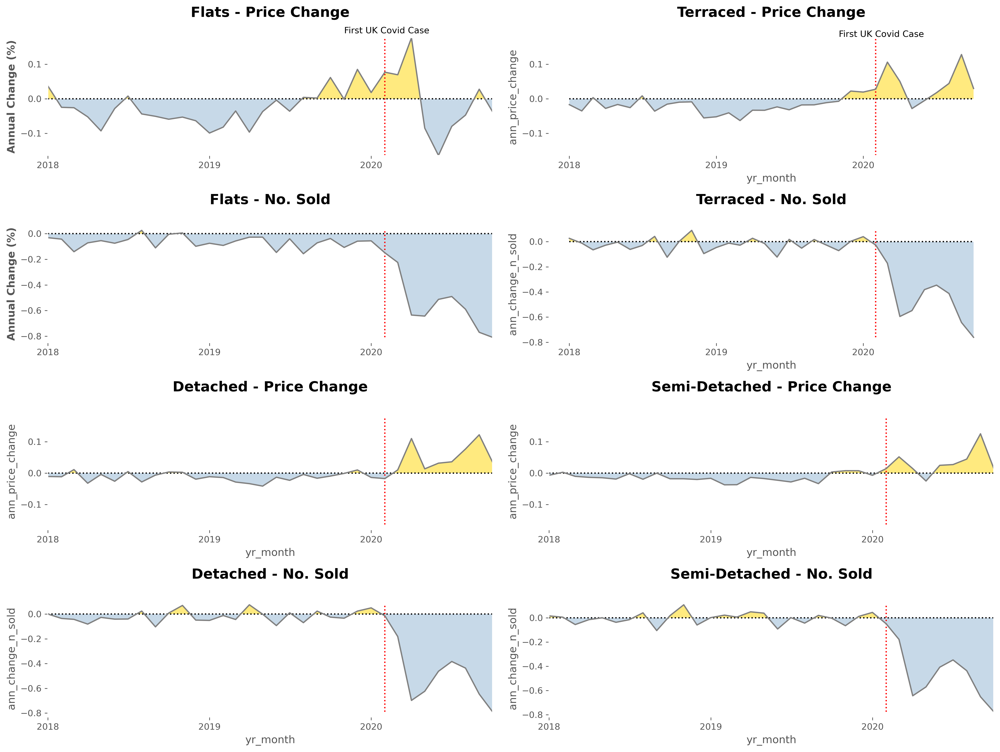

In [43]:
plt.rcParams['axes.facecolor'] = 'white'
fig, axs = plt.subplots(4, 2, figsize=(16, 12), dpi=300)
dat = flats_ts.yr_month

y_diffs_pchg = flats_ts.ann_price_change
y_diffs_nsold = flats_ts.ann_change_n_sold
terr_y_diffs_pchg = terr_ts.ann_price_change
terr_y_diffs_nsold = terr_ts.ann_change_n_sold
det_y_diffs_pchg = det_ts.ann_price_change
det_y_diffs_nsold = det_ts.ann_change_n_sold
sdet_y_diffs_pchg = semi_d_ts.ann_price_change
sdet_y_diffs_nsold = semi_d_ts.ann_change_n_sold

sns.lineplot(data=flats_ts, x="yr_month", y="ann_price_change", color= 'grey', ax=axs[0, 0])
sns.lineplot(data=flats_ts, x="yr_month", y="ann_change_n_sold", color= 'grey', ax=axs[1, 0])
sns.lineplot(data=terr_ts, x="yr_month", y="ann_price_change", color= 'grey', ax=axs[0, 1])
sns.lineplot(data=terr_ts, x="yr_month", y="ann_change_n_sold", color= 'grey', ax=axs[1, 1])
sns.lineplot(data=det_ts, x="yr_month", y="ann_price_change", color= 'grey', ax=axs[2, 0])
sns.lineplot(data=det_ts, x="yr_month", y="ann_change_n_sold", color= 'grey', ax=axs[3, 0])
sns.lineplot(data=semi_d_ts, x="yr_month", y="ann_price_change", color= 'grey', ax=axs[2, 1])
sns.lineplot(data=semi_d_ts, x="yr_month", y="ann_change_n_sold", color= 'grey', ax=axs[3, 1])

# Filling between x axis and plots:
axs[0, 0].fill_between(dat, y_diffs_pchg, 0, where=y_diffs_pchg >= 0, facecolor='gold', interpolate=True, alpha=0.5)
axs[0, 0].fill_between(dat, y_diffs_pchg, 0, where=y_diffs_pchg <= 0, facecolor='steelblue', interpolate=True, alpha=0.3)
axs[1, 0].fill_between(dat, y_diffs_nsold, 0, where=y_diffs_nsold >= 0, facecolor='gold', interpolate=True, alpha=0.5)
axs[1, 0].fill_between(dat, y_diffs_nsold, 0, where=y_diffs_nsold <= 0, facecolor='steelblue', interpolate=True, alpha=0.3)

axs[0, 1].fill_between(dat, terr_y_diffs_pchg, 0, where=terr_y_diffs_pchg >= 0, facecolor='gold', interpolate=True, alpha=0.5)
axs[0, 1].fill_between(dat, terr_y_diffs_pchg, 0, where=terr_y_diffs_pchg <= 0, facecolor='steelblue', interpolate=True, alpha=0.3)
axs[1, 1].fill_between(dat, terr_y_diffs_nsold, 0, where=terr_y_diffs_nsold >= 0, facecolor='gold', interpolate=True, alpha=0.5)
axs[1, 1].fill_between(dat, terr_y_diffs_nsold, 0, where=terr_y_diffs_nsold <= 0, facecolor='steelblue', interpolate=True, alpha=0.3)

axs[2, 0].fill_between(dat, det_y_diffs_pchg, 0, where=det_y_diffs_pchg >= 0, facecolor='gold', interpolate=True, alpha=0.5)
axs[2, 0].fill_between(dat, det_y_diffs_pchg, 0, where=det_y_diffs_pchg <= 0, facecolor='steelblue', interpolate=True, alpha=0.3)
axs[3, 0].fill_between(dat, det_y_diffs_nsold, 0, where=det_y_diffs_nsold >= 0, facecolor='gold', interpolate=True, alpha=0.5)
axs[3, 0].fill_between(dat, det_y_diffs_nsold, 0, where=det_y_diffs_nsold <= 0, facecolor='steelblue', interpolate=True, alpha=0.3)

axs[2, 1].fill_between(dat, sdet_y_diffs_pchg, 0, where=sdet_y_diffs_pchg >= 0, facecolor='gold', interpolate=True, alpha=0.5)
axs[2, 1].fill_between(dat, sdet_y_diffs_pchg, 0, where=sdet_y_diffs_pchg <= 0, facecolor='steelblue', interpolate=True, alpha=0.3)
axs[3, 1].fill_between(dat, sdet_y_diffs_nsold, 0, where=sdet_y_diffs_nsold >= 0, facecolor='gold', interpolate=True, alpha=0.5)
axs[3, 1].fill_between(dat, sdet_y_diffs_nsold, 0, where=sdet_y_diffs_nsold <= 0, facecolor='steelblue', interpolate=True, alpha=0.3)

# Plotting vertical dashed lines
axs[0, 0].vlines(flats_ts.yr_month[25:26], min(y_diffs_pchg), max(y_diffs_pchg), linestyle="dotted", color = 'red')
axs[0, 0].text(flats_ts.yr_month[22:23], 0.19, "First UK Covid Case")
axs[1, 0].vlines(flats_ts.yr_month[25:26], min(y_diffs_nsold), max(y_diffs_nsold), linestyle="dotted", color = 'red')
axs[0, 1].vlines(flats_ts.yr_month[25:26], min(y_diffs_pchg), max(y_diffs_pchg), linestyle="dotted", color = 'red')
axs[0, 1].text(flats_ts.yr_month[22:23], 0.18, "First UK Covid Case")
axs[1, 1].vlines(flats_ts.yr_month[25:26], min(terr_y_diffs_nsold), max(terr_y_diffs_nsold), linestyle="dotted", color = 'red')
axs[2, 0].vlines(flats_ts.yr_month[25:26], min(y_diffs_pchg), max(y_diffs_pchg), linestyle="dotted", color = 'red')
axs[3, 0].vlines(flats_ts.yr_month[25:26], min(det_y_diffs_nsold), max(det_y_diffs_nsold), linestyle="dotted", color = 'red')
axs[2, 1].vlines(flats_ts.yr_month[25:26], min(y_diffs_pchg), max(y_diffs_pchg), linestyle="dotted", color = 'red')
axs[3, 1].vlines(flats_ts.yr_month[25:26], min(sdet_y_diffs_nsold), max(sdet_y_diffs_nsold), linestyle="dotted", color = 'red')

# Setting the limits and ticks of the x axis:
axs[0, 0].set_xlim(min(dat), max(dat))
axs[1, 0].set_xlim(min(dat), max(dat))
axs[2, 0].set_xlim(min(dat), max(dat))
axs[3, 0].set_xlim(min(dat), max(dat))
axs[2, 1].set_xlim(min(dat), max(dat))
axs[3, 1].set_xlim(min(dat), max(dat))

axs[0, 0].set_ylim(min(y_diffs_pchg), max(y_diffs_pchg))
axs[0, 1].set_ylim(min(y_diffs_pchg), max(y_diffs_pchg))

date_form = DateFormatter("%Y")
axs[0, 0].xaxis.set_major_formatter(date_form)
axs[0, 0].xaxis.set_major_locator(mdates.YearLocator(1))
axs[0, 1].xaxis.set_major_formatter(date_form)
axs[0, 1].xaxis.set_major_locator(mdates.YearLocator(1))
axs[1, 0].xaxis.set_major_formatter(date_form)
axs[1, 0].xaxis.set_major_locator(mdates.YearLocator(1))
axs[1, 1].xaxis.set_major_formatter(date_form)
axs[1, 1].xaxis.set_major_locator(mdates.YearLocator(1))
axs[2, 0].xaxis.set_major_formatter(date_form)
axs[2, 0].xaxis.set_major_locator(mdates.YearLocator(1))
axs[3, 0].xaxis.set_major_formatter(date_form)
axs[3, 0].xaxis.set_major_locator(mdates.YearLocator(1))
axs[2, 1].xaxis.set_major_formatter(date_form)
axs[2, 1].xaxis.set_major_locator(mdates.YearLocator(1))
axs[3, 1].xaxis.set_major_formatter(date_form)
axs[3, 1].xaxis.set_major_locator(mdates.YearLocator(1))

# Plotting horizontal dashed lines
axs[0, 0].hlines(0, min(dat), max(dat), linestyle="dotted", color = 'black')
axs[1, 0].hlines(0, min(dat), max(dat), linestyle="dotted", color = 'black')
axs[0, 1].hlines(0, min(dat), max(dat), linestyle="dotted", color = 'black')
axs[1, 1].hlines(0, min(dat), max(dat), linestyle="dotted", color = 'black')
axs[2, 0].hlines(0, min(dat), max(dat), linestyle="dotted", color = 'black')
axs[3, 0].hlines(0, min(dat), max(dat), linestyle="dotted", color = 'black')
axs[2, 1].hlines(0, min(dat), max(dat), linestyle="dotted", color = 'black')
axs[3, 1].hlines(0, min(dat), max(dat), linestyle="dotted", color = 'black')


axs[0, 0].set_title('Flats - Price Change\n', fontsize = 16, fontweight = 'bold')
axs[1, 0].set_title('Flats - No. Sold\n', fontsize = 16, fontweight = 'bold')
axs[0, 1].set_title('Terraced - Price Change\n', fontsize = 16, fontweight = 'bold')
axs[1, 1].set_title('Terraced - No. Sold\n', fontsize = 16, fontweight = 'bold')
axs[2, 0].set_title('Detached - Price Change\n', fontsize = 16, fontweight = 'bold')
axs[3, 0].set_title('Detached - No. Sold\n', fontsize = 16, fontweight = 'bold')
axs[2, 1].set_title('Semi-Detached - Price Change\n', fontsize = 16, fontweight = 'bold')
axs[3, 1].set_title('Semi-Detached - No. Sold\n', fontsize = 16, fontweight = 'bold')

axs[0, 0].set_ylabel('Annual Change (%)', fontsize = 12, fontweight = 'bold')
axs[0, 0].set_xlabel('')
axs[1, 0].set_ylabel('Annual Change (%)', fontsize = 12, fontweight = 'bold')
axs[1, 0].set_xlabel('')

plt.tight_layout()
plt.savefig('Figures/type_diffs.png', bbox_inches='tight')
plt.show()

- In terms of number sold, all types have seen a similar decline. 
- However, flats have had a negative price movement, while detached appears to have had the most sustained positive price improvement.

# 2020 Time Series:

In [11]:
twenty_df = hp_with_real_prices[(hp_with_real_prices['year']==2019) | (hp_with_real_prices['year']==2020)]

In [12]:
twenty_df['county'] = twenty_df['county'].str.title()

C:\Users\rozhouse\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [46]:
tw_flats_df = twenty_df[twenty_df['property_type'] =='Flat'][['yr_month', 'real_price']]

tw_det_df = twenty_df[twenty_df['property_type'] =='Detached'][['yr_month', 'real_price']]

In [47]:
tw_flats_ts = convert_to_ts(tw_flats_df)
tw_det_ts = convert_to_ts(tw_det_df)

C:\Users\rozhouse\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


In [48]:
tw_det_ts.head()

,yr_month,av_real_price,monthly_sales,ann_price_change,ann_change_n_sold
12,2020-01-01,427861.587405,14948,-0.013909,0.049940
13,2020-02-01,411830.046804,14801,-0.017538,-0.014581
14,2020-03-01,420358.649869,14492,0.010049,-0.181705
15,2020-04-01,452442.651859,5113,0.109938,-0.697831
16,2020-05-01,408993.180639,6842,0.013476,-0.623880


C:\Users\rozhouse\Anaconda3\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


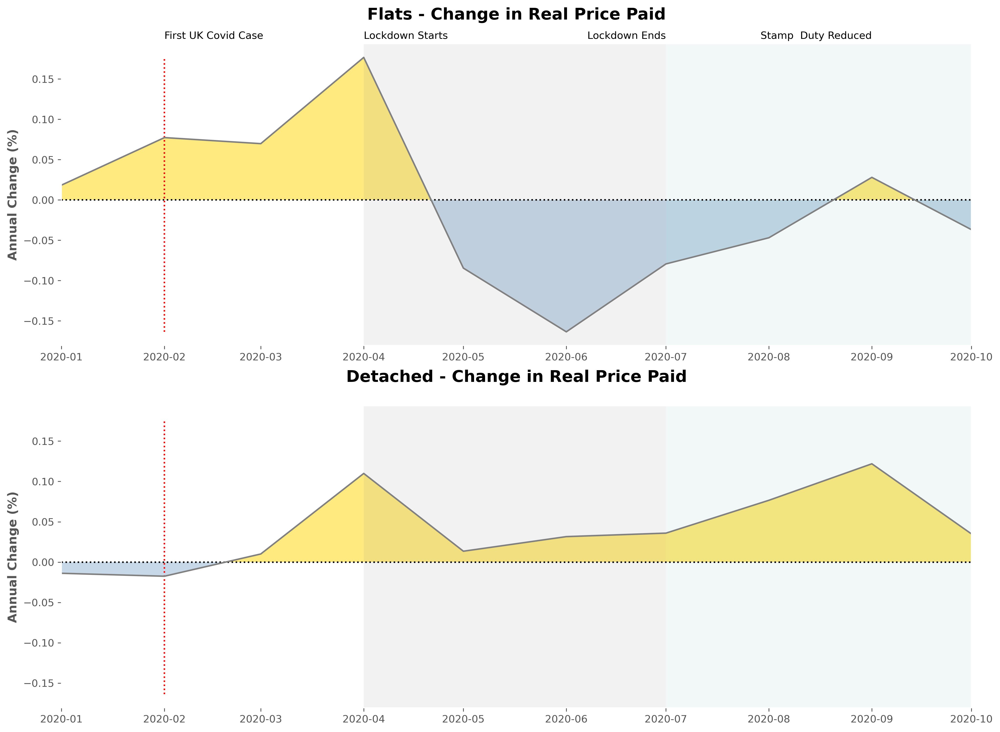

In [49]:
plt.rcParams['axes.facecolor'] = 'white'
fig, axs = plt.subplots(2, 1, figsize=(16, 12), dpi=300)
dat = tw_flats_ts.yr_month

y_diffs_flt = tw_flats_ts.ann_price_change
y_diffs_dett = tw_det_ts.ann_price_change

sns.lineplot(data=tw_flats_ts, x="yr_month", y="ann_price_change", color= 'grey', ax=axs[0])
sns.lineplot(data=tw_det_ts, x="yr_month", y="ann_price_change", color= 'grey', ax=axs[1])

# Filling between x axis and plots:
axs[0].fill_between(dat, y_diffs_flt, 0, where=y_diffs_flt >= 0, facecolor='gold', interpolate=True, alpha=0.5)
axs[0].fill_between(dat, y_diffs_flt, 0, where=y_diffs_flt <= 0, facecolor='steelblue', interpolate=True, alpha=0.3)
axs[1].fill_between(dat, y_diffs_dett, 0, where=y_diffs_dett >= 0, facecolor='gold', interpolate=True, alpha=0.5)
axs[1].fill_between(dat, y_diffs_dett, 0, where=y_diffs_dett <= 0, facecolor='steelblue', interpolate=True, alpha=0.3)

# Plotting vertical dashed lines
axs[0].vlines(tw_flats_ts.yr_month[1:2], min(y_diffs_flt), max(y_diffs_flt), linestyle="dotted", color = 'red')
axs[0].text(tw_flats_ts.yr_month[1:2], 0.2, "First UK Covid Case", )
axs[1].vlines(tw_flats_ts.yr_month[1:2], min(y_diffs_flt), max(y_diffs_flt), linestyle="dotted", color = 'red')
axs[0].text(tw_flats_ts.yr_month[3:4], 0.2, "Lockdown Starts")
axs[0].text(tw_flats_ts.yr_month[6:7], 0.2, "Lockdown Ends", horizontalalignment='right')
axs[0].text(tw_flats_ts.yr_month[8:9], 0.2, "Stamp  Duty Reduced", horizontalalignment='right')

# Annotating text and grey vertical bars:
a = tw_flats_ts.yr_month[3:4]
b = tw_flats_ts.yr_month[6:7]
c = tw_flats_ts.yr_month[9:10]

axs[0].axvspan(a, b, color='grey', alpha=0.1, lw=0)
axs[0].axvspan(b, c, color='teal', alpha=0.05, lw=0)
axs[1].axvspan(a, b, color='grey', alpha=0.1, lw=0)
axs[1].axvspan(b, c, color='teal', alpha=0.05, lw=0)

# Setting the limits and ticks of the x axis:
axs[0].set_xlim(min(dat), max(dat))
axs[1].set_xlim(min(dat), max(dat))
#axs[0].set_ylim(-0.2, 0.3)
#axs[1].set_ylim(-0.2, 0.3)

# Plotting horizontal dashed lines
axs[0].hlines(0, min(dat), max(dat), linestyle="dotted", color = 'black')
axs[1].hlines(0, min(dat), max(dat), linestyle="dotted", color = 'black')

axs[0].set_title('Flats - Change in Real Price Paid\n', fontsize = 16, fontweight = 'bold')
axs[1].set_title('Detached - Change in Real Price Paid\n', fontsize = 16, fontweight = 'bold')

axs[0].set_ylabel('Annual Change (%)', fontsize = 12, fontweight = 'bold')
axs[0].set_xlabel('')
axs[1].set_ylabel('Annual Change (%)', fontsize = 12, fontweight = 'bold')
axs[1].set_xlabel('')

plt.savefig('Figures/flat_vs_detach.png', bbox_inches='tight')
plt.show()

- We can see lockdown appears to have had a negative effect on the price paid for Flats, as more people are choosing detached houses instead. 
- This could be related to the lack of private outdoor space associated with a flat.

# Regional Effects:

- Splitting 2020 into two periods:


    - Middle of Lockdown = May & June - The most negative Effects from the Lockdown impact on price seen in this month.

    - Stamp Duty Realisation = September - Enough time for house price to be affected by stamp duty changes.

In [50]:
county_groups = twenty_df.groupby(['county', 'yr_month']).real_price.mean().reset_index()

In [51]:
county_groups['ann_price_change'] = county_groups.real_price.pct_change(periods=12)

In [52]:
county_groups['yr_month'] = pd.to_datetime(county_groups['yr_month'])

In [53]:
county_groups['year'] = pd.DatetimeIndex(county_groups['yr_month']).year

In [54]:
county_groups.head(3)

,county,yr_month,real_price,ann_price_change,year
0,Bath And North East Somerset,2019-01-01,384284.091898,NaN,2019
1,Bath And North East Somerset,2019-02-01,425877.725326,NaN,2019
2,Bath And North East Somerset,2019-03-01,421978.797440,NaN,2019


In [55]:
county_groups_ts = county_groups[county_groups['year']!= 2019]

In [56]:
county_groups_ts['month'] = pd.DatetimeIndex(county_groups_ts['yr_month']).month

C:\Users\rozhouse\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [57]:
county_groups_ts.head(3)

,county,yr_month,real_price,ann_price_change,year,month
12,Bath And North East Somerset,2020-01-01,408087.080371,0.061941,2020,1
13,Bath And North East Somerset,2020-02-01,368081.624487,-0.135711,2020,2
14,Bath And North East Somerset,2020-03-01,392199.964022,-0.070570,2020,3


In [58]:
county_groups_ts['county'] = county_groups_ts['county'].str.title()

C:\Users\rozhouse\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [59]:
lockdown = county_groups_ts[(county_groups_ts['month']==5) | (county_groups_ts['month']==6)]
stamp_duty = county_groups_ts[county_groups_ts['month']==9]

In [60]:
lockdown_ts = lockdown.groupby('county').ann_price_change.mean().reset_index()

In [61]:
stamp_duty

,county,yr_month,real_price,ann_price_change,year,month
20,Bath And North East Somerset,2020-09-01,524828.271605,0.135656,2020,9
42,Bedford,2020-09-01,327721.455696,0.055164,2020,9
64,Blackburn With Darwen,2020-09-01,154342.241379,-0.157000,2020,9
86,Blackpool,2020-09-01,125301.041667,-0.002197,2020,9
108,Blaenau Gwent,2020-09-01,95072.500000,-0.102191,2020,9
...,...,...,...,...,...,...
2351,Wokingham,2020-09-01,459457.207792,-0.056822,2020,9
2373,Worcestershire,2020-09-01,284390.052632,0.059684,2020,9
2395,Wrekin,2020-09-01,185363.779070,-0.011410,2020,9
2417,Wrexham,2020-09-01,175816.000000,-0.017843,2020,9


In [62]:
lockdown_ts.head(3)

,county,ann_price_change
0,Bath And North East Somerset,-0.030123
1,Bedford,-0.065686
2,Blackburn With Darwen,-0.066528


## Shape File:

In [4]:
uk_shape = gpd.read_file('Data/shape_files/Counties_and_Unitary_Authorities__December_2019__Boundaries_UK_BFE.shp')

In [5]:
uk_shape.head(3)

,objectid,ctyua19cd,ctyua19nm,ctyua19nmw,bng_e,bng_n,long,lat,st_areasha,st_lengths,geometry
0,1,E06000001,Hartlepool,None,447160,531474,-1.27018,54.67614,9.834667e+07,66121.472650,"POLYGON ((447213.900 537036.104, 447228.798 53..."
1,2,E06000002,Middlesbrough,None,451141,516887,-1.21099,54.54467,5.455359e+07,41055.809886,"POLYGON ((448489.897 522071.798, 448592.597 52..."
2,3,E06000003,Redcar and Cleveland,None,464361,519597,-1.00608,54.56752,2.537854e+08,105292.138896,"POLYGON ((455525.931 528406.654, 455724.632 52..."


In [6]:
uk_shape.rename({'ctyua19nm': 'county'}, axis=1, inplace=True)

In [7]:
uk_shape['county'] = uk_shape['county'].str.title()
uk_shape['county'] = uk_shape['county'].str.replace(', City Of', '')
uk_shape['county'] = uk_shape['county'].str.replace(', County Of', '')
uk_shape['county'] = uk_shape['county'].str.replace('Telford And Wrekin', 'Wrekin')
uk_shape['county'] = uk_shape['county'].str.replace('Vale Of Glamorgan', 'The Vale Of Glamorgan')
uk_shape['county'] = uk_shape['county'].str.replace('Rhondda Cynon Taf', 'Rhondda Cynon Taff')

In [13]:
gl_list = twenty_df[twenty_df['county']== 'Greater London'].district.unique().tolist()
gm_list = twenty_df[twenty_df['county']== 'Greater Manchester'].district.unique().tolist()
wy_list = twenty_df[twenty_df['county']== 'West Yorkshire'].district.unique().tolist()
mer_list = twenty_df[twenty_df['county']== 'Merseyside'].district.unique().tolist()
sy_list = twenty_df[twenty_df['county']== 'South Yorkshire'].district.unique().tolist()
tnw_list = twenty_df[twenty_df['county']== 'Tyne And Wear'].district.unique().tolist()
wm_list = twenty_df[twenty_df['county']== 'West Midlands'].district.unique().tolist()

In [14]:
gl_list = [x.title() for x in gl_list]
gm_list = [x.title() for x in gm_list]
wy_list = [x.title() for x in wy_list]
mer_list = [x.title() for x in mer_list]
sy_list = [x.title() for x in sy_list]
tnw_list = [x.title() for x in tnw_list]
wm_list = [x.title() for x in wm_list]

In [15]:
uk_shape.loc[(uk_shape.county.isin(gl_list)), 'county'] = 'Greater London'
uk_shape.loc[(uk_shape.county.isin(gm_list)), 'county'] = 'Greater Manchester'
uk_shape.loc[(uk_shape.county.isin(wy_list)), 'county'] = 'West Yorkshire'
uk_shape.loc[(uk_shape.county.isin(mer_list)), 'county'] = 'Merseyside'
uk_shape.loc[(uk_shape.county.isin(sy_list)), 'county'] = 'South Yorkshire'
uk_shape.loc[(uk_shape.county.isin(tnw_list)), 'county'] = 'Tyne And Wear'
uk_shape.loc[(uk_shape.county.isin(wm_list)), 'county'] = 'West Midlands'

In [70]:
lockdown_ts['county'] = lockdown_ts['county'].str.replace('City Of ', '')
stamp_duty['county'] = stamp_duty['county'].str.replace('City Of ', '')

C:\Users\rozhouse\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [71]:
shp_lockdown = pd.merge(lockdown_ts, uk_shape,  how='left', on=['county'])
shp_stamp = pd.merge(stamp_duty, uk_shape,  how='left', on=['county'])

In [72]:
shp_lockdown[shp_lockdown['objectid'].isnull()]

,county,ann_price_change,objectid,ctyua19cd,ctyua19nmw,bng_e,bng_n,long,lat,st_areasha,st_lengths,geometry


### Saving County Shape File:

In [3]:
#uk_shape.to_csv('Data/uk_shape_county_cleaned.csv')
uk_shape = pd.read_csv('Data/uk_shape_county_cleaned.csv', index=False)

TypeError: read_csv() got an unexpected keyword argument 'index'

In [74]:
geo_df_lockdown = GeoDataFrame(shp_lockdown)
geo_df_stamp = GeoDataFrame(shp_stamp)

## Plotting UK County Distributions:

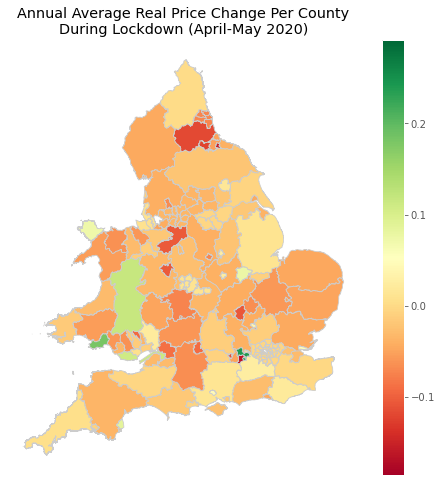

In [239]:
fig, ax = plt.subplots(figsize=(8,8))


geo_df_lockdown.plot(column='ann_price_change', cmap='RdYlGn', linewidth=0.8, edgecolor='0.8', ax=ax, legend = True, 
                     vmin = min(min(geo_df_lockdown.ann_price_change),min(geo_df_stamp.ann_price_change)), 
                     vmax = max(max(geo_df_lockdown.ann_price_change),max(geo_df_stamp.ann_price_change)))


plt.title('Annual Average Real Price Change Per County\nDuring Lockdown (April-May 2020)')
plt.grid('off')
plt.axis('off')

plt.show()

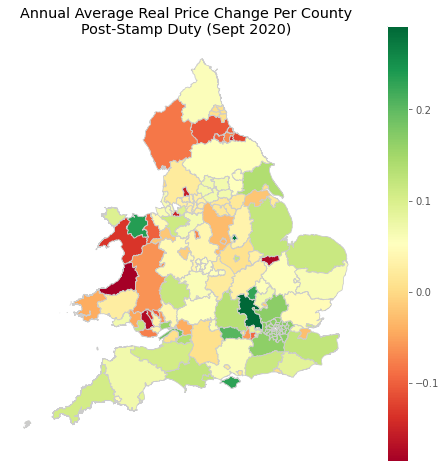

In [238]:
fig, ax = plt.subplots(figsize=(8,8))


geo_df_stamp.plot(column='ann_price_change', cmap='RdYlGn', linewidth=0.8, edgecolor='0.8', ax=ax, legend = True,  
                     vmin = min(min(geo_df_lockdown.ann_price_change),min(geo_df_stamp.ann_price_change)), 
                     vmax = max(max(geo_df_lockdown.ann_price_change),max(geo_df_stamp.ann_price_change)))


plt.title('Annual Average Real Price Change Per County\nPost-Stamp Duty (Sept 2020)')
plt.grid('off')
plt.axis('off')

plt.show()

- The North-South divide is clearly shown here, as well as the difference between the lockdown measures that came into force in Wales vs England.

- In September, when the South of England was largely out of lockdown, Wales started locking down counties again, while some of the Northern counties remained in much stricter tiered lockdowns.

# Looking at London Districts in More Detail:

## Creating London Dataframes:

In [76]:
dist_groups = twenty_df.groupby(['district', 'yr_month']).real_price.mean().reset_index()

In [77]:
dist_groups.head()

,district,yr_month,real_price
0,ADUR,2019-01,312481.431209
1,ADUR,2019-02,325652.047009
2,ADUR,2019-03,358527.497106
3,ADUR,2019-04,323612.087645
4,ADUR,2019-05,299213.921797


In [78]:
dist_groups['district'] = dist_groups['district'].str.title()

In [79]:
lon_dists = dist_groups.loc[(dist_groups.district.isin(gl_list)), ['district', 'yr_month', 'real_price']].reset_index()

In [80]:
lon_dists.head()

,index,district,yr_month,real_price
0,176,Barking And Dagenham,2019-01,315007.832571
1,177,Barking And Dagenham,2019-02,309615.887102
2,178,Barking And Dagenham,2019-03,321514.798248
3,179,Barking And Dagenham,2019-04,319522.796655
4,180,Barking And Dagenham,2019-05,323055.026251


In [252]:
lon_dists['ann_price_change'] = lon_dists.real_price.pct_change(periods=12)
lon_dists['yr_month'] = pd.to_datetime(lon_dists['yr_month'])
lon_dists['year'] = pd.DatetimeIndex(lon_dists['yr_month']).year
lon_dists['month'] = pd.DatetimeIndex(lon_dists['yr_month']).month
lon_dists_ts = lon_dists[lon_dists['year']!= 2019]

In [253]:
lon_dists_ts.head()

,index,district,yr_month,real_price,ann_price_change,year,month
12,188,Barking And Dagenham,2020-01-01,371751.285893,0.180133,2020,1
13,189,Barking And Dagenham,2020-02-01,319316.285345,0.031330,2020,2
14,190,Barking And Dagenham,2020-03-01,301833.351711,-0.061215,2020,3
15,191,Barking And Dagenham,2020-04-01,320090.151023,0.001776,2020,4
16,192,Barking And Dagenham,2020-05-01,317730.297660,-0.016482,2020,5


In [254]:
lockdown_lon = lon_dists_ts[(lon_dists_ts['month']==5) | (lon_dists_ts['month']==6)]
stamp_duty_lon = lon_dists_ts[lon_dists_ts['month']==9]

In [256]:
lockdown_lon = lockdown_lon.groupby('district').ann_price_change.mean().reset_index()

## Importing District Shape File:

In [258]:
uk_shape_dist = gpd.read_file('Data/shape_files/Local_Authority_Districts__December_2019__Boundaries_UK_BFC.shp')

In [259]:
uk_shape_dist.head()

,objectid,lad19cd,lad19nm,lad19nmw,bng_e,bng_n,long,lat,st_areasha,st_lengths,geometry
0,1,E06000001,Hartlepool,None,447160,531474,-1.27018,54.676140,9.371262e+07,71011.933949,"MULTIPOLYGON (((447213.900 537036.104, 447228...."
1,2,E06000002,Middlesbrough,None,451141,516887,-1.21099,54.544670,5.388156e+07,44481.691242,"MULTIPOLYGON (((448609.900 521982.600, 448616...."
2,3,E06000003,Redcar and Cleveland,None,464361,519597,-1.00608,54.567520,2.450695e+08,96703.989701,"MULTIPOLYGON (((455932.335 527880.697, 455919...."
3,4,E06000004,Stockton-on-Tees,None,444940,518183,-1.30664,54.556911,2.049330e+08,123408.985928,"MULTIPOLYGON (((444157.002 527956.304, 444165...."
4,5,E06000005,Darlington,None,428029,515648,-1.56835,54.535339,1.974757e+08,107206.401677,"POLYGON ((423496.602 524724.299, 423497.204 52..."


In [261]:
uk_shape_dist.rename({'lad19nm': 'district'}, axis=1, inplace=True)

In [262]:
uk_shape_dist['district'] = uk_shape_dist['district'].str.title()

In [267]:
uk_shape_dist['district'] = uk_shape_dist['district'].str.replace('Westminster', 'City Of Westminster')

### Saving District ShapeFile:

In [270]:
# uk_shape_dist.to_csv('Data/uk_shape_district_cleaned.csv')

In [4]:
uk_shape_dist = pd.read_csv('Data/uk_shape_district_cleaned.csv')

In [268]:
lon_lock_shp = pd.merge(lockdown_lon, uk_shape_dist,  how='left', on=['district'])
lon_stamp_shp = pd.merge(stamp_duty_lon, uk_shape_dist,  how='left', on=['district'])

In [269]:
lon_lock_shp[lon_lock_shp['objectid'].isnull()]

,district,ann_price_change,objectid,lad19cd,lad19nmw,bng_e,bng_n,long,lat,st_areasha,st_lengths,geometry


In [274]:
geo_lon_lockdown = GeoDataFrame(lon_lock_shp)
geo_lon_stamp = GeoDataFrame(lon_stamp_shp)

## Plotting London Distributions:

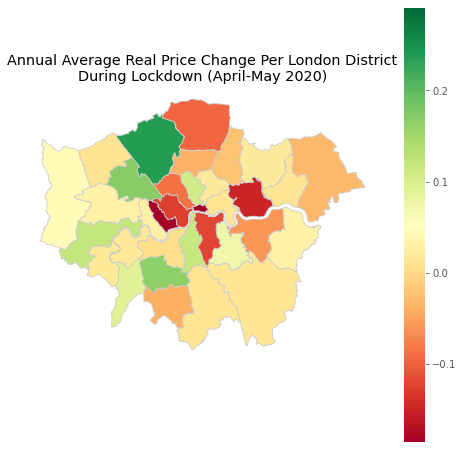

In [279]:
fig, ax = plt.subplots(figsize=(8,8))


geo_lon_lockdown.plot(column='ann_price_change', cmap='RdYlGn', linewidth=0.8, edgecolor='0.8', ax=ax, legend = True, 
                     vmin = min(min(geo_df_lockdown.ann_price_change),min(geo_df_stamp.ann_price_change)), 
                     vmax = max(max(geo_df_lockdown.ann_price_change),max(geo_df_stamp.ann_price_change)))


plt.title('Annual Average Real Price Change Per London District\nDuring Lockdown (April-May 2020)')
plt.grid('off')
plt.axis('off')

plt.show()

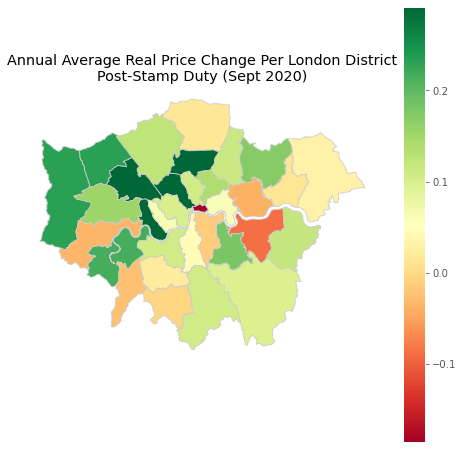

In [280]:
fig, ax = plt.subplots(figsize=(8,8))


geo_lon_stamp.plot(column='ann_price_change', cmap='RdYlGn', linewidth=0.8, edgecolor='0.8', ax=ax, legend = True, 
                     vmin = min(min(geo_df_lockdown.ann_price_change),min(geo_df_stamp.ann_price_change)), 
                     vmax = max(max(geo_df_lockdown.ann_price_change),max(geo_df_stamp.ann_price_change)))


plt.title('Annual Average Real Price Change Per London District\nPost-Stamp Duty (Sept 2020)')
plt.grid('off')
plt.axis('off')

plt.show()

# Visualizing Outdoor Space:

In [1400]:
priv_os = pd.read_csv('Data/private_outdoor_space.csv')

In [1401]:
priv_os.shape

(8480, 3)

In [282]:
priv_os.head()

,district,pct_priv_os,av_priv_os
0,City of London,0.07,110.0
1,Barking and Dagenham,0.77,663.7
2,Barking and Dagenham,0.86,169.9
3,Barking and Dagenham,0.93,190.2
4,Barking and Dagenham,0.95,136.6


In [287]:
priv_os_grouped = priv_os.groupby('district')['pct_priv_os', 'av_priv_os'].mean().reset_index()

C:\Users\rozhouse\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


In [288]:
priv_os_grouped.head()

,district,pct_priv_os,av_priv_os
0,Aberdeen City,0.833673,272.871429
1,Aberdeenshire,0.911186,614.918644
2,Adur,0.903750,241.937500
3,Allerdale,0.918333,377.425000
4,Amber Valley,0.934375,329.212500


In [295]:
priv_os_grouped['district'] = priv_os_grouped['district'].str.title()
priv_os_grouped['district'] = priv_os_grouped['district'].str.replace('Westminster', 'City Of Westminster')

In [296]:
# Merging the rpi df with our house price df:
priv_os_shp = pd.merge(lon_lock_shp, priv_os_grouped, how = 'left', on = 'district')

In [297]:
priv_os_shp[priv_os_shp['av_priv_os'].isnull()]

,district,ann_price_change,objectid,lad19cd,lad19nmw,bng_e,bng_n,long,lat,st_areasha,st_lengths,geometry,pct_priv_os,av_priv_os


In [299]:
priv_os_shp_ex_col = priv_os_shp[priv_os_shp['district']!= 'City Of London']

In [300]:
geo_priv_os = GeoDataFrame(priv_os_shp_ex_col)

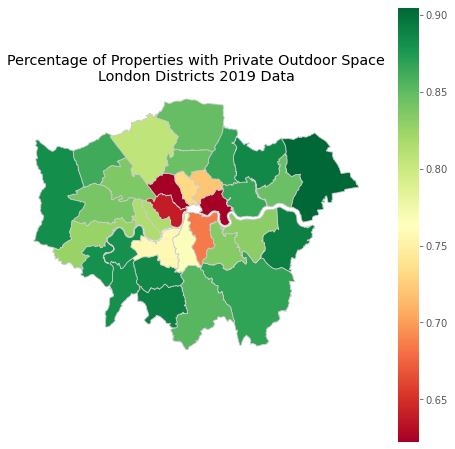

In [304]:
fig, ax = plt.subplots(figsize=(8,8))
geo_priv_os.plot(column='pct_priv_os', cmap='RdYlGn', linewidth=0.8, edgecolor='0.8', ax=ax, legend = True)
plt.title('Percentage of Properties with Private Outdoor Space\nLondon Districts 2019 Data')
plt.grid('off')
plt.axis('off')

plt.show()

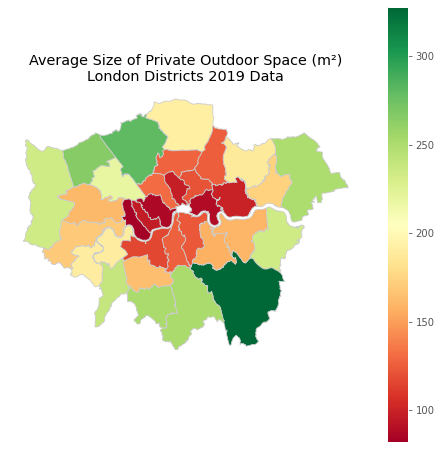

In [312]:
fig, ax = plt.subplots(figsize=(8,8))
geo_priv_os.plot(column='av_priv_os', cmap='RdYlGn', linewidth=0.8, edgecolor='0.8', ax=ax, legend = True)
plt.title('Average Size of Private Outdoor Space (m²)\nLondon Districts 2019 Data')
plt.grid('off')
plt.axis('off')

plt.show()

# Plotting Average Size of Outdoor Space vs Perc Chg Sept 2020:

In [391]:
new_df = pd.DataFrame({'av_os_size' : priv_os_shp.av_priv_os})

In [371]:
new_df['log_os_size'] = np.log(new_df['av_os_size'])

In [392]:
new_df['pct_priv_os'] = priv_os_shp.pct_priv_os

In [393]:
new_df['stamp_price_chg'] = lon_stamp_shp.ann_price_change

In [394]:
new_df['lock_price_chg'] = lon_lock_shp.ann_price_change

In [395]:
new_df.head()

,av_os_size,pct_priv_os,stamp_price_chg,lock_price_chg
0,174.040909,0.846364,0.014236,0.012768
1,280.426829,0.806098,0.125046,0.236776
2,233.750000,0.891429,0.118729,0.030784
3,218.773529,0.836765,0.338480,0.170217
4,327.764103,0.867692,0.096860,0.014310


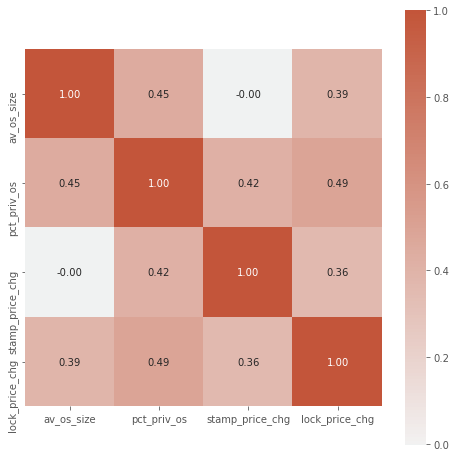

In [396]:
plt.figure(figsize=(8,8))
corr = new_df.corr()
ax = sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, 
            annot=True, cmap=sns.diverging_palette(220, 20, as_cmap=True), center = 0, square = True, fmt=".2f")
plt.show()

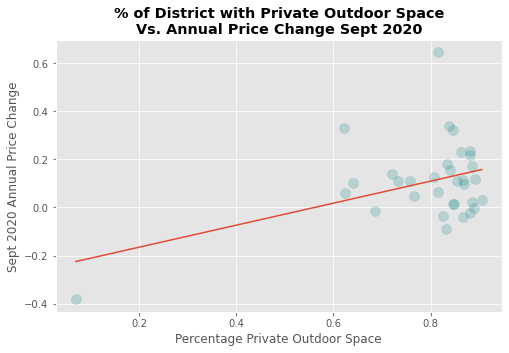

In [379]:
plt.figure(figsize=(8,5))
x = new_df.pct_priv_os
y = new_df.stamp_price_chg

plt.scatter(x, y, color = 'teal', s = 100, alpha = 0.2)

plt.xlabel('Percentage Private Outdoor Space')
plt.ylabel('Sept 2020 Annual Price Change')

plt.title('% of District with Private Outdoor Space\nVs. Annual Price Change Sept 2020', fontweight = 'bold')

plt.plot(np.unique(x), np.poly1d(np.polyfit(x, y, 1))(np.unique(x)))

plt.show()

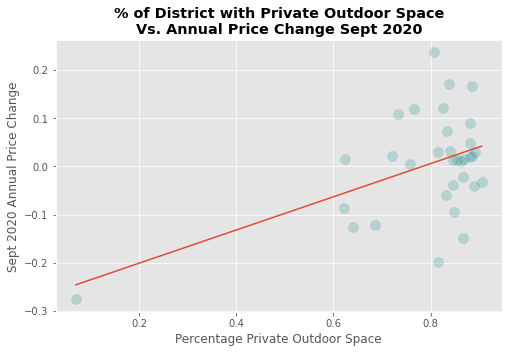

In [397]:
plt.figure(figsize=(8,5))
x = new_df.pct_priv_os
y = new_df.lock_price_chg

plt.scatter(x, y, color = 'teal', s = 100, alpha = 0.2)

plt.xlabel('Percentage Private Outdoor Space')
plt.ylabel('Sept 2020 Annual Price Change')

plt.title('% of District with Private Outdoor Space\nVs. Annual Price Change Sept 2020', fontweight = 'bold')

plt.plot(np.unique(x), np.poly1d(np.polyfit(x, y, 1))(np.unique(x)))

plt.show()

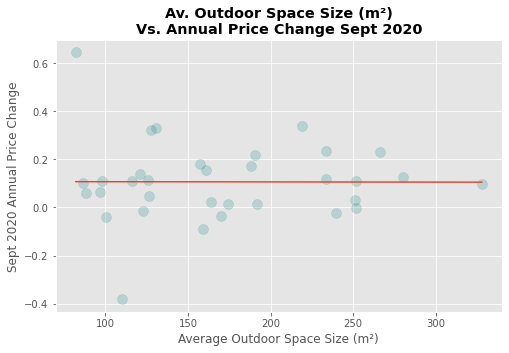

In [382]:
plt.figure(figsize=(8,5))
x = new_df.av_os_size
y = new_df.stamp_price_chg

plt.scatter(x, y, color = 'teal', s = 100, alpha = 0.2)

plt.xlabel('Average Outdoor Space Size (m²)')
plt.ylabel('Sept 2020 Annual Price Change')

plt.title('Av. Outdoor Space Size (m²)\nVs. Annual Price Change Sept 2020', fontweight = 'bold')

plt.plot(np.unique(x), np.poly1d(np.polyfit(x, y, 1))(np.unique(x)))

plt.show()

In [390]:
lon_stamp_shp.sort_values('ann_price_change', ascending=False).head(3)

,index,district,yr_month,real_price,ann_price_change,year,month,objectid,lad19cd,lad19nmw,bng_e,bng_n,long,lat,st_areasha,st_lengths,geometry
13,2892,Hammersmith And Fulham,2020-09-01,1.122633e+06,0.645114,2020,9,297,E09000013,None,523867,177993,-0.21735,51.487331,1.640366e+07,23974.244574,"POLYGON ((522644.698 182934.405, 522666.301 18..."
3,705,Brent,2020-09-01,7.264794e+05,0.338480,2020,9,289,E09000005,None,519615,186468,-0.27568,51.564411,4.323265e+07,38334.108096,"POLYGON ((520284.698 190241.403, 520319.402 19..."
5,1013,Camden,2020-09-01,1.579370e+06,0.330767,2020,9,291,E09000007,None,527492,184284,-0.16289,51.543060,2.178930e+07,26150.818382,"POLYGON ((527180.702 187584.204, 527198.701 18..."


# County Level Outdoor Space:

In [81]:
county_priv_os = pd.read_csv('Data/priv_outdoor_county.csv')

In [82]:
county_priv_os.head(3)

,county,priv_os_av_size
0,Hammersmith and Fulham,81.4
1,Westminster,82.1
2,Tower Hamlets,85.8


In [83]:
convert_county_col(county_priv_os)

In [84]:
county_priv_os.dtypes

county              object
priv_os_av_size    float64
dtype: object

In [88]:
county_priv_os.loc[(county_priv_os.county.isin(ny_list)), 'county'] = 'North Yorkshire'
county_priv_os.loc[(county_priv_os.county.isin(lin_list)), 'county'] = 'Lincolnshire'
county_priv_os.loc[(county_priv_os.county.isin(ess_list)), 'county'] = 'Essex'
county_priv_os.loc[(county_priv_os.county.isin(der_list)), 'county'] = 'Derbyshire'
county_priv_os.loc[(county_priv_os.county.isin(buck_list)), 'county'] = 'Buckinghamshire'
county_priv_os.loc[(county_priv_os.county.isin(wsu_list)), 'county'] = 'West Sussex'
county_priv_os.loc[(county_priv_os.county.isin(nor_list)), 'county'] = 'Norfolk'
county_priv_os.loc[(county_priv_os.county.isin(ham_list)), 'county'] = 'Hampshire'
county_priv_os.loc[(county_priv_os.county.isin(sur_list)), 'county'] = 'Surrey'
county_priv_os.loc[(county_priv_os.county.isin(hert_list)), 'county'] = 'Hertfordshire'
county_priv_os.loc[(county_priv_os.county.isin(cum_list)), 'county'] = 'Cumbria'
county_priv_os.loc[(county_priv_os.county.isin(oxf_list)), 'county'] = 'Oxfordshire'
county_priv_os.loc[(county_priv_os.county.isin(esu_list)), 'county'] = 'East Sussex'
county_priv_os.loc[(county_priv_os.county.isin(war_list)), 'county'] = 'Warwickshire'
county_priv_os.loc[(county_priv_os.county.isin(glou_list)), 'county'] = 'Gloucestershire'
county_priv_os.loc[(county_priv_os.county.isin(camb_list)), 'county'] = 'Cambridgeshire'
county_priv_os.loc[(county_priv_os.county.isin(nott_list)), 'county'] = 'Nottinghamshire'
county_priv_os.loc[(county_priv_os.county.isin(worc_list)), 'county'] = 'Worcestershire'
county_priv_os.loc[(county_priv_os.county.isin(staf_list)), 'county'] = 'Staffordshire'
county_priv_os.loc[(county_priv_os.county.isin(dev_list)), 'county'] = 'Devon'
county_priv_os.loc[(county_priv_os.county.isin(leic_list)), 'county'] = 'Leicestershire'
county_priv_os.loc[(county_priv_os.county.isin(kent_list)), 'county'] = 'Kent'
county_priv_os.loc[(county_priv_os.county.isin(nort_list)), 'county'] = 'Northamptonshire'
county_priv_os.loc[(county_priv_os.county.isin(suf_list)), 'county'] = 'Suffolk'
county_priv_os.loc[(county_priv_os.county.isin(som_list)), 'county'] = 'Somerset'
county_priv_os.loc[(county_priv_os.county.isin(lanc_list)), 'county'] = 'Lancashire'

In [89]:
county_priv_os_grouped = county_priv_os.groupby('county')['priv_os_av_size'].mean().reset_index()

In [90]:
county_priv_os_grouped.head()

,county,priv_os_av_size
0,Aberdeen City,289.2
1,Aberdeenshire,637.7
2,Angus,476.6
3,Argyll And Bute,783.1
4,Bath And North East Somerset,389.8


In [163]:
len(covid_price_flats.county)

1100

In [164]:
priv_os_county_shp = pd.merge(covid_price_flats, county_priv_os_grouped,  how='left', on=['county'])

In [165]:
priv_os_county_shp.head(3)

,county,yr_month_x,real_price,ann_price_change,year,month,yr_month_y,monthly_cases,population,cases_per_100k,3yr_av_price,av_prop_flats,priv_os_av_size
0,Bath And North East Somerset,2020-01-01,408087.080371,0.061941,2020,1,NaN,0.0,193282,0.000000,419871.188521,0.224206,389.8
1,Bath And North East Somerset,2020-02-01,368081.624487,-0.135711,2020,2,NaN,0.0,193282,0.000000,419871.188521,0.224206,389.8
2,Bath And North East Somerset,2020-03-01,392199.964022,-0.070570,2020,3,2020-03,53.0,193282,27.421074,419871.188521,0.224206,389.8


In [166]:
len(priv_os_county_shp.county)

1100

In [167]:
priv_os_county_shp[priv_os_county_shp['priv_os_av_size'].isnull()].county.value_counts()

Series([], Name: county, dtype: int64)

In [86]:
ny_list = twenty_df[twenty_df['county']== 'North Yorkshire'].district.unique().tolist()
lin_list = twenty_df[twenty_df['county']== 'Lincolnshire'].district.unique().tolist()
ess_list = twenty_df[twenty_df['county']== 'Essex'].district.unique().tolist()
der_list = twenty_df[twenty_df['county']== 'Derbyshire'].district.unique().tolist()
buck_list = twenty_df[twenty_df['county']== 'Buckinghamshire'].district.unique().tolist()
wsu_list = twenty_df[twenty_df['county']== 'West Sussex'].district.unique().tolist()
nor_list = twenty_df[twenty_df['county']== 'Norfolk'].district.unique().tolist()
ham_list = twenty_df[twenty_df['county']== 'Hampshire'].district.unique().tolist()
sur_list = twenty_df[twenty_df['county']== 'Surrey'].district.unique().tolist()
hert_list = twenty_df[twenty_df['county']== 'Hertfordshire'].district.unique().tolist()
cum_list = twenty_df[twenty_df['county']== 'Cumbria'].district.unique().tolist()
oxf_list = twenty_df[twenty_df['county']== 'Oxfordshire'].district.unique().tolist()
esu_list = twenty_df[twenty_df['county']== 'East Sussex'].district.unique().tolist()
war_list = twenty_df[twenty_df['county']== 'Warwickshire'].district.unique().tolist()
glou_list = twenty_df[twenty_df['county']== 'Gloucestershire'].district.unique().tolist()
camb_list = twenty_df[twenty_df['county']== 'Cambridgeshire'].district.unique().tolist()
nott_list = twenty_df[twenty_df['county']== 'Nottinghamshire'].district.unique().tolist()
worc_list = twenty_df[twenty_df['county']== 'Worcestershire'].district.unique().tolist()
staf_list = twenty_df[twenty_df['county']== 'Staffordshire'].district.unique().tolist()
dev_list = twenty_df[twenty_df['county']== 'Devon'].district.unique().tolist()
leic_list = twenty_df[twenty_df['county']== 'Leicestershire'].district.unique().tolist()
kent_list = twenty_df[twenty_df['county']== 'Kent'].district.unique().tolist()
nort_list = twenty_df[twenty_df['county']== 'Northamptonshire'].district.unique().tolist()
suf_list = twenty_df[twenty_df['county']== 'Suffolk'].district.unique().tolist()
som_list = twenty_df[twenty_df['county']== 'Somerset'].district.unique().tolist()
lanc_list = twenty_df[twenty_df['county']== 'Lancashire'].district.unique().tolist()

In [87]:
ny_list = [x.title() for x in ny_list]
lin_list = [x.title() for x in lin_list]
ess_list = [x.title() for x in ess_list]
der_list = [x.title() for x in der_list]
buck_list = [x.title() for x in buck_list]
wsu_list = [x.title() for x in wsu_list]
nor_list = [x.title() for x in nor_list]
ham_list = [x.title() for x in ham_list]
sur_list = [x.title() for x in sur_list]
hert_list = [x.title() for x in hert_list]
cum_list = [x.title() for x in cum_list]
oxf_list = [x.title() for x in oxf_list]
esu_list = [x.title() for x in esu_list]
war_list = [x.title() for x in war_list]
glou_list = [x.title() for x in glou_list]
camb_list = [x.title() for x in camb_list]
nott_list = [x.title() for x in nott_list]
worc_list = [x.title() for x in worc_list]
staf_list = [x.title() for x in staf_list]
dev_list = [x.title() for x in dev_list]
leic_list = [x.title() for x in leic_list]
kent_list = [x.title() for x in kent_list]
nort_list = [x.title() for x in nort_list]
suf_list = [x.title() for x in suf_list]
som_list = [x.title() for x in som_list]
lanc_list = [x.title() for x in lanc_list]

In [168]:
geo_priv_os_county_shp = GeoDataFrame(priv_os_county_shp)

In [169]:
geo_priv_os_county_shp.head()

,county,yr_month_x,real_price,ann_price_change,year,month,yr_month_y,monthly_cases,population,cases_per_100k,3yr_av_price,av_prop_flats,priv_os_av_size
0,Bath And North East Somerset,2020-01-01,408087.080371,0.061941,2020,1,NaN,0.0,193282,0.000000,419871.188521,0.224206,389.8
1,Bath And North East Somerset,2020-02-01,368081.624487,-0.135711,2020,2,NaN,0.0,193282,0.000000,419871.188521,0.224206,389.8
2,Bath And North East Somerset,2020-03-01,392199.964022,-0.070570,2020,3,2020-03,53.0,193282,27.421074,419871.188521,0.224206,389.8
3,Bath And North East Somerset,2020-04-01,469495.468044,0.122327,2020,4,2020-04,201.0,193282,103.993129,419871.188521,0.224206,389.8
4,Bath And North East Somerset,2020-05-01,373742.045354,-0.046602,2020,5,2020-05,77.0,193282,39.838164,419871.188521,0.224206,389.8


# 2020 Data:

In [92]:
just_twenty = hp_with_real_prices[hp_with_real_prices['year']==2020]

In [93]:
just_twenty.head()

,Unnamed: 0,transaction_id,price,date,postcode,property_type,new_build,lease_duration,house_name_num,secondary_name,...,town_city,district,county,price_paid_category,record_status,yr_month,year,month,oct_20_rebase,real_price
24872216,24872216,{9DBAD221-7C16-6EB3-E053-6B04A8C0F257},200000,2020-01-03,LL32 8BS,Terraced,Existing Build,Freehold,14,NaN,...,CONWY,CONWY,CONWY,A,A,2020-01,2020,1,1.012732,202546.45560
24872217,24872217,{9DBAD221-7C19-6EB3-E053-6B04A8C0F257},160000,2020-01-24,LL53 6HW,Terraced,Existing Build,Freehold,NEWBOROUGH HOUSE,NaN,...,PWLLHELI,GWYNEDD,GWYNEDD,A,A,2020-01,2020,1,1.012732,162037.16448
24872218,24872218,{9DBAD221-7C1D-6EB3-E053-6B04A8C0F257},85000,2020-01-17,SA44 4BD,Terraced,Existing Build,Freehold,2,NaN,...,LLANDYSUL,CEREDIGION,CEREDIGION,A,A,2020-01,2020,1,1.012732,86082.24363
24872219,24872219,{9DBAD221-7C24-6EB3-E053-6B04A8C0F257},250000,2020-01-07,LL11 2PU,Semi-Detached,Existing Build,Freehold,64,NaN,...,WREXHAM,WREXHAM,WREXHAM,A,A,2020-01,2020,1,1.012732,253183.06950
24872220,24872220,{9DBAD221-7C28-6EB3-E053-6B04A8C0F257},305000,2020-01-16,CH8 7SY,Detached,Existing Build,Freehold,1,NaN,...,HOLYWELL,FLINTSHIRE,FLINTSHIRE,A,A,2020-01,2020,1,1.012732,308883.34479


In [94]:
just_twenty['log_real_price'] = np.log(just_twenty['real_price'])

C:\Users\rozhouse\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [95]:
just_twenty = just_twenty[just_twenty['real_price']>10000]

- Although property sales for under 10,000 were verified online, I have removed them for the purposes of clustering, as they contribute very little to the overall price statistics but could through off any clustering attempts.

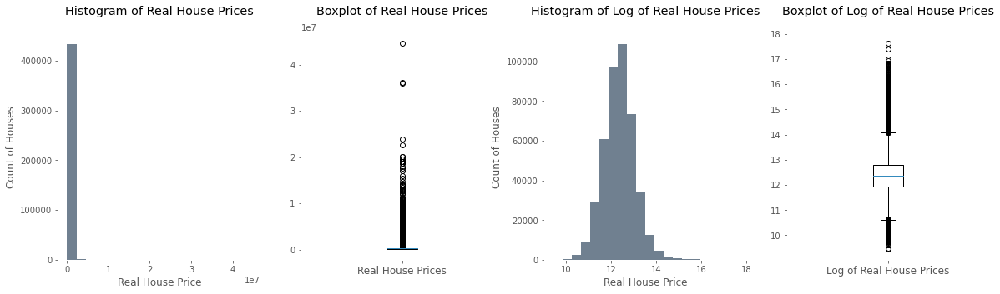

In [96]:
fig, ax = plt.subplots(1, 4, figsize=(20,5))

ax[0].hist(just_twenty.real_price, bins =20, color = 'slategrey')
ax[1].boxplot(just_twenty['real_price'].values)
ax[2].hist(just_twenty.log_real_price, bins =20, color = 'slategrey')
ax[3].boxplot(just_twenty['log_real_price'].values)

ax[0].set_xlabel('Real House Price')
ax[0].set_ylabel('Count of Houses')
ax[0].set_title('Histogram of Real House Prices\n')
ax[1].set_xticklabels(["Real House Prices"], fontsize = (12))
ax[1].set_ylabel('')
ax[1].set_title('Boxplot of Real House Prices\n')
ax[2].set_xlabel('Real House Price')
ax[2].set_ylabel('Count of Houses')
ax[2].set_title('Histogram of Log of Real House Prices\n')
ax[3].set_xticklabels(["Log of Real House Prices"], fontsize = (12))
ax[3].set_ylabel('')
ax[3].set_title('Boxplot of Log of Real House Prices\n')

plt.show()

# Importing Covid Cases Data:

In [104]:
covid_cases = pd.read_csv('Data/covid_cases.csv', parse_dates=True, dayfirst=True, infer_datetime_format=True)

In [105]:
covid_cases.shape

(52352, 3)

In [106]:
covid_cases = covid_cases.loc[(covid_cases != 0).all(axis=1), :]

In [107]:
covid_cases.rename(columns={'areaName': 'county'}, inplace=True)
covid_cases.rename(columns={'newCasesBySpecimenDate': 'new_cases'}, inplace=True)

In [108]:
covid_cases['county'] = covid_cases['county'].str.title()

In [109]:
covid_cases['date'] = pd.to_datetime(covid_cases['date'], format='%d/%m/%Y')
covid_cases['yr_month'] = covid_cases['date'].dt.strftime('%Y-%m')
covid_cases['year'] = pd.DatetimeIndex(covid_cases['date']).year
covid_cases['month'] = pd.DatetimeIndex(covid_cases['date']).month

In [110]:
covid_cases.head()

,date,county,new_cases,yr_month,year,month
0,2020-01-11,Derry City And Strabane,1,2020-01,2020,1
20,2020-01-30,York,1,2020-01,2020,1
35,2020-02-05,Brighton And Hove,1,2020-02,2020,2
57,2020-02-08,Oxfordshire,1,2020-02,2020,2
58,2020-02-08,Brighton And Hove,3,2020-02,2020,2


In [111]:
covid_cases[covid_cases['month']==1]

,date,county,new_cases,yr_month,year,month
0,2020-01-11,Derry City And Strabane,1,2020-01,2020,1
20,2020-01-30,York,1,2020-01,2020,1


## Importing Population Data:

In [112]:
county_pop = pd.read_csv('Data/county_all_pop.csv')
county_pop = county_pop.groupby('county')["population"].sum().reset_index(name = 'population')
county_pop.head(3)

,county,population
0,Aberdeen City,228670
1,Aberdeenshire,261210
2,Adur,64301


In [113]:
county_pop['county'] = county_pop['county'].str.title()

## Joining Covid Cases with County Data:

In [114]:
covid_cases.loc[(covid_cases.county.isin(gl_list)), 'county'] = 'Greater London'
covid_cases.loc[(covid_cases.county.isin(gm_list)), 'county'] = 'Greater Manchester'
covid_cases.loc[(covid_cases.county.isin(wy_list)), 'county'] = 'West Yorkshire'
covid_cases.loc[(covid_cases.county.isin(mer_list)), 'county'] = 'Merseyside'
covid_cases.loc[(covid_cases.county.isin(sy_list)), 'county'] = 'South Yorkshire'
covid_cases.loc[(covid_cases.county.isin(tnw_list)), 'county'] = 'Tyne And Wear'
covid_cases.loc[(covid_cases.county.isin(wm_list)), 'county'] = 'West Midlands'

In [115]:
grouped_covid = covid_cases.groupby(['county', 'yr_month', 'year', 'month'])["new_cases"].sum().reset_index(name = 'monthly_cases')

In [116]:
grouped_covid.head()

,county,yr_month,year,month,monthly_cases
0,Aberdeen City,2020-03,2020,3,62
1,Aberdeen City,2020-04,2020,4,464
2,Aberdeen City,2020-05,2020,5,294
3,Aberdeen City,2020-06,2020,6,20
4,Aberdeen City,2020-07,2020,7,22


In [117]:
grouped_covid['county'] = grouped_covid['county'].str.replace(', City Of', '')
grouped_covid['county'] = grouped_covid['county'].str.replace(', County Of', '')
grouped_covid['county'] = grouped_covid['county'].str.replace('Telford And Wrekin', 'Wrekin')
grouped_covid['county'] = grouped_covid['county'].str.replace('Vale Of Glamorgan', 'The Vale Of Glamorgan')
grouped_covid['county'] = grouped_covid['county'].str.replace('Rhondda Cynon Taf', 'Rhondda Cynon Taff')
grouped_covid['county'] = grouped_covid['county'].str.replace('Cornwall And Isles Of Scilly', 'Cornwall')

In [118]:
county_groups_ts['county'] = county_groups_ts['county'].str.replace('City Of ', '')

C:\Users\rozhouse\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [119]:
county_w_covid = pd.merge(county_groups_ts, grouped_covid, how = 'left', on = ['county', 'year', 'month'])

In [120]:
county_w_covid

,county,yr_month_x,real_price,ann_price_change,year,month,yr_month_y,monthly_cases
0,Bath And North East Somerset,2020-01-01,408087.080371,0.061941,2020,1,NaN,NaN
1,Bath And North East Somerset,2020-02-01,368081.624487,-0.135711,2020,2,NaN,NaN
2,Bath And North East Somerset,2020-03-01,392199.964022,-0.070570,2020,3,2020-03,53.0
3,Bath And North East Somerset,2020-04-01,469495.468044,0.122327,2020,4,2020-04,201.0
4,Bath And North East Somerset,2020-05-01,373742.045354,-0.046602,2020,5,2020-05,77.0
...,...,...,...,...,...,...,...,...
1101,York,2020-06-01,280690.989656,-0.002669,2020,6,2020-06,55.0
1102,York,2020-07-01,285342.464849,0.018142,2020,7,2020-07,26.0
1103,York,2020-08-01,299494.780457,0.077080,2020,8,2020-08,51.0
1104,York,2020-09-01,309388.176471,0.056718,2020,9,2020-09,447.0


In [121]:
county_w_covid = county_w_covid[county_w_covid['county']!= 'Isles Of Scilly']

In [122]:
is_null_df = county_w_covid[county_w_covid['monthly_cases'].isnull()]

In [123]:
is_null_df[(is_null_df['month']!=1) & (is_null_df['month']!=2)]

,county,yr_month_x,real_price,ann_price_change,year,month,yr_month_y,monthly_cases


In [124]:
county_w_covid['monthly_cases'] = county_w_covid['monthly_cases'].fillna(0)

C:\Users\rozhouse\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [125]:
county_w_covid.head()

,county,yr_month_x,real_price,ann_price_change,year,month,yr_month_y,monthly_cases
0,Bath And North East Somerset,2020-01-01,408087.080371,0.061941,2020,1,NaN,0.0
1,Bath And North East Somerset,2020-02-01,368081.624487,-0.135711,2020,2,NaN,0.0
2,Bath And North East Somerset,2020-03-01,392199.964022,-0.070570,2020,3,2020-03,53.0
3,Bath And North East Somerset,2020-04-01,469495.468044,0.122327,2020,4,2020-04,201.0
4,Bath And North East Somerset,2020-05-01,373742.045354,-0.046602,2020,5,2020-05,77.0


In [126]:
county_w_covid[county_w_covid['county']=='Greater Manchester']

,county,yr_month_x,real_price,ann_price_change,year,month,yr_month_y,monthly_cases
390,Greater Manchester,2020-01-01,197647.527696,-0.028356,2020,1,NaN,0.0
391,Greater Manchester,2020-02-01,200787.336621,0.065518,2020,2,2020-02,2.0
392,Greater Manchester,2020-03-01,202172.281023,0.045161,2020,3,2020-03,1442.0
393,Greater Manchester,2020-04-01,184672.802530,-0.066344,2020,4,2020-04,7906.0
394,Greater Manchester,2020-05-01,187338.113695,-0.042185,2020,5,2020-05,5187.0
395,Greater Manchester,2020-06-01,195015.373858,-0.024829,2020,6,2020-06,2467.0
396,Greater Manchester,2020-07-01,199650.713879,0.005976,2020,7,2020-07,2332.0
397,Greater Manchester,2020-08-01,213377.506837,0.061059,2020,8,2020-08,4314.0
398,Greater Manchester,2020-09-01,208775.908680,0.029728,2020,9,2020-09,20435.0
399,Greater Manchester,2020-10-01,198699.520856,-0.021186,2020,10,2020-10,59046.0


## Joining Population Data:

In [127]:
county_pop.head(3)

,county,population
0,Aberdeen City,228670
1,Aberdeenshire,261210
2,Adur,64301


In [128]:
county_pop[county_pop['county']=='Manchester']

,county,population
214,Manchester,552858


In [129]:
county_pop.loc[(county_pop.county.isin(gl_list)), 'county'] = 'Greater London'
county_pop.loc[(county_pop.county.isin(gm_list)), 'county'] = 'Greater Manchester'
county_pop.loc[(county_pop.county.isin(wy_list)), 'county'] = 'West Yorkshire'
county_pop.loc[(county_pop.county.isin(mer_list)), 'county'] = 'Merseyside'
county_pop.loc[(county_pop.county.isin(sy_list)), 'county'] = 'South Yorkshire'
county_pop.loc[(county_pop.county.isin(tnw_list)), 'county'] = 'Tyne And Wear'
county_pop.loc[(county_pop.county.isin(wm_list)), 'county'] = 'West Midlands'

In [130]:
grouped_pop = county_pop.groupby('county')["population"].sum().reset_index(name = 'population')

In [131]:
grouped_pop.head(3)

,county,population
0,Aberdeen City,228670
1,Aberdeenshire,261210
2,Adur,64301


In [132]:
grouped_pop[grouped_pop['county']=='Manchester']

,county,population


In [133]:
grouped_pop[grouped_pop['county']=='Cambridgeshire']

,county,population
43,Cambridgeshire,653537


In [134]:
grouped_pop['county'] = grouped_pop['county'].str.replace(', City Of', '')
grouped_pop['county'] = grouped_pop['county'].str.replace(', County Of', '')
grouped_pop['county'] = grouped_pop['county'].str.replace('Telford And Wrekin', 'Wrekin')
grouped_pop['county'] = grouped_pop['county'].str.replace('Vale Of Glamorgan', 'The Vale Of Glamorgan')
grouped_pop['county'] = grouped_pop['county'].str.replace('Rhondda Cynon Taf', 'Rhondda Cynon Taff')
grouped_pop['county'] = grouped_pop['county'].str.replace('Cornwall And Isles Of Scilly', 'Cornwall')

In [135]:
covid_pop_county = pd.merge(county_w_covid, grouped_pop, how = 'left', on = 'county')

In [136]:
covid_pop_county[covid_pop_county['population'].isnull()]

,county,yr_month_x,real_price,ann_price_change,year,month,yr_month_y,monthly_cases,population


## Calculating Rates per 100,000:

In [137]:
covid_pop_county.head(3)

,county,yr_month_x,real_price,ann_price_change,year,month,yr_month_y,monthly_cases,population
0,Bath And North East Somerset,2020-01-01,408087.080371,0.061941,2020,1,NaN,0.0,193282
1,Bath And North East Somerset,2020-02-01,368081.624487,-0.135711,2020,2,NaN,0.0,193282
2,Bath And North East Somerset,2020-03-01,392199.964022,-0.070570,2020,3,2020-03,53.0,193282


In [138]:
covid_pop_county.tail(3)

,county,yr_month_x,real_price,ann_price_change,year,month,yr_month_y,monthly_cases,population
1097,York,2020-08-01,299494.780457,0.077080,2020,8,2020-08,51.0,210618
1098,York,2020-09-01,309388.176471,0.056718,2020,9,2020-09,447.0,210618
1099,York,2020-10-01,260786.862745,-0.090295,2020,10,2020-10,3030.0,210618


In [139]:
covid_pop_county['cases_per_100k'] = covid_pop_county.monthly_cases/(covid_pop_county.population/100000)

## County Shape File:

In [140]:
uk_shape.head()

,objectid,ctyua19cd,county,ctyua19nmw,bng_e,bng_n,long,lat,st_areasha,st_lengths,geometry
0,1,E06000001,Hartlepool,None,447160,531474,-1.27018,54.676140,9.834667e+07,66121.472650,"POLYGON ((447213.900 537036.104, 447228.798 53..."
1,2,E06000002,Middlesbrough,None,451141,516887,-1.21099,54.544670,5.455359e+07,41055.809886,"POLYGON ((448489.897 522071.798, 448592.597 52..."
2,3,E06000003,Redcar And Cleveland,None,464361,519597,-1.00608,54.567520,2.537854e+08,105292.138896,"POLYGON ((455525.931 528406.654, 455724.632 52..."
3,4,E06000004,Stockton-On-Tees,None,444940,518183,-1.30664,54.556911,2.097308e+08,108085.255484,"POLYGON ((444157.002 527956.304, 444165.898 52..."
4,5,E06000005,Darlington,None,428029,515648,-1.56835,54.535339,1.974757e+08,107206.401677,"POLYGON ((423496.602 524724.299, 423497.204 52..."


In [141]:
shp_covid = pd.merge(covid_pop_county, uk_shape,  how='left', on=['county'])

In [142]:
covid_county_cases_mar = shp_covid[shp_covid['month']==3]
covid_county_cases_apr = shp_covid[shp_covid['month']==4]
covid_county_cases_may = shp_covid[shp_covid['month']==5]
covid_county_cases_jun = shp_covid[shp_covid['month']==6]
covid_county_cases_jul = shp_covid[shp_covid['month']==7]
covid_county_cases_aug = shp_covid[shp_covid['month']==8]
covid_county_cases_sept = shp_covid[shp_covid['month']==9]
covid_county_cases_oct = shp_covid[shp_covid['month']==10]

In [143]:
geo_mar_covid = GeoDataFrame(covid_county_cases_mar)
geo_apr_covid = GeoDataFrame(covid_county_cases_apr)
geo_may_covid = GeoDataFrame(covid_county_cases_may)
geo_jun_covid = GeoDataFrame(covid_county_cases_jun)
geo_jul_covid = GeoDataFrame(covid_county_cases_jul)
geo_aug_covid = GeoDataFrame(covid_county_cases_aug)
geo_sept_covid = GeoDataFrame(covid_county_cases_sept)
geo_oct_covid = GeoDataFrame(covid_county_cases_oct)

In [187]:
def plot_map(df, col, colmap, month, i, title):
    
    df.plot(column=col, cmap=colmap, linewidth=0.8, edgecolor='0.8', ax=axes[i], legend = False,
                      vmin = shp_covid[col].quantile(0.2), 
                         vmax = shp_covid[col].quantile(0.8))

    axes[i].set_title('%s\n %s 2020' % (title, month))
    axes[i].grid('off')
    axes[i].axis('off')

    return

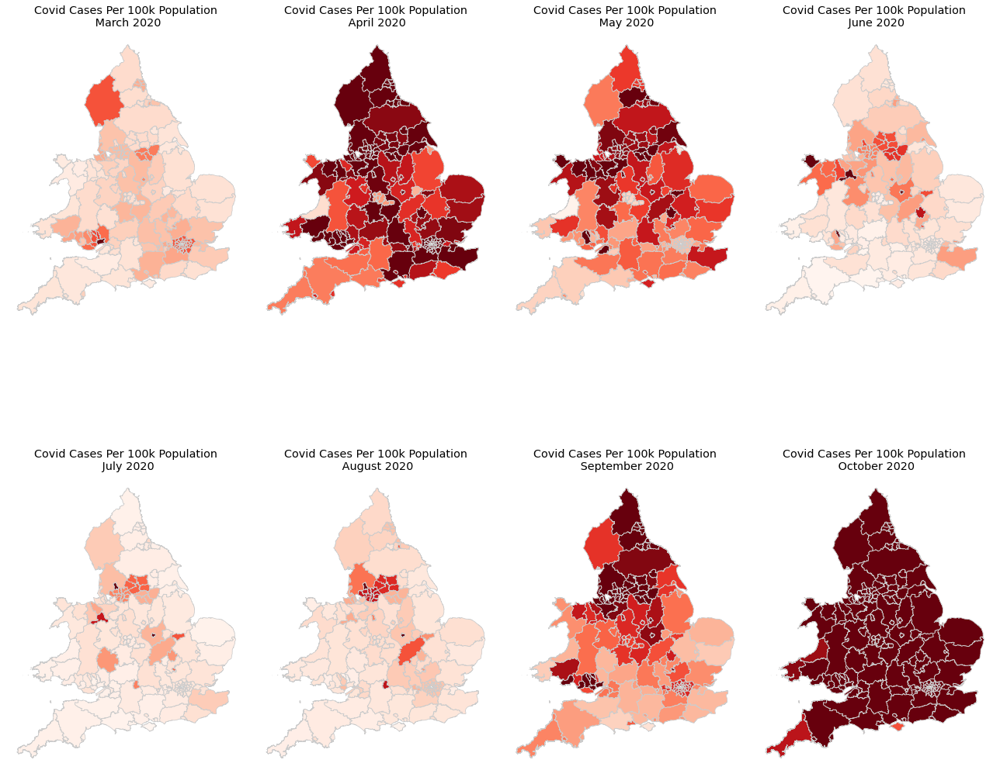

In [493]:
fig, axes = plt.subplots(2, 4, figsize=(18,18))
axes = axes.flatten()

plot_map(geo_mar_covid, 'cases_per_100k', 'Reds', 'March', 0, 'Covid Cases Per 100k Population')
plot_map(geo_apr_covid, 'cases_per_100k', 'Reds', 'April', 1, 'Covid Cases Per 100k Population')
plot_map(geo_may_covid, 'cases_per_100k', 'Reds', 'May', 2, 'Covid Cases Per 100k Population')
plot_map(geo_jun_covid, 'cases_per_100k', 'Reds', 'June', 3, 'Covid Cases Per 100k Population')
plot_map(geo_jul_covid, 'cases_per_100k', 'Reds', 'July', 4, 'Covid Cases Per 100k Population')
plot_map(geo_aug_covid, 'cases_per_100k', 'Reds', 'August', 5, 'Covid Cases Per 100k Population')
plot_map(geo_sept_covid, 'cases_per_100k', 'Reds', 'September', 6, 'Covid Cases Per 100k Population')
plot_map(geo_oct_covid, 'cases_per_100k', 'Reds', 'October', 7, 'Covid Cases Per 100k Population')


plt.tight_layout()
plt.show()

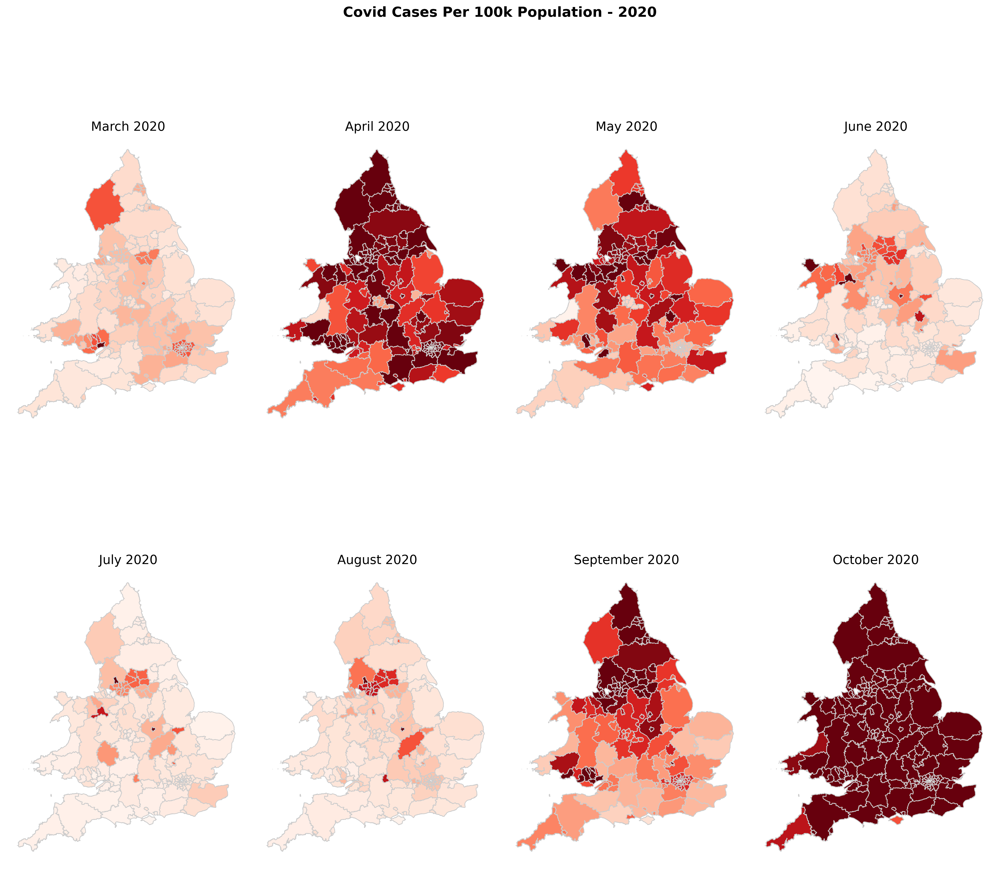

In [188]:
fig, axes = plt.subplots(2, 4, figsize=(16,16), dpi=300)
axes = axes.flatten()

plot_map(geo_mar_covid, 'cases_per_100k', 'Reds', 'March', 0, '')
plot_map(geo_apr_covid, 'cases_per_100k', 'Reds', 'April', 1, '')
plot_map(geo_may_covid, 'cases_per_100k', 'Reds', 'May', 2, '')
plot_map(geo_jun_covid, 'cases_per_100k', 'Reds', 'June', 3, '')
plot_map(geo_jul_covid, 'cases_per_100k', 'Reds', 'July', 4, '')
plot_map(geo_aug_covid, 'cases_per_100k', 'Reds', 'August', 5, '')
plot_map(geo_sept_covid, 'cases_per_100k', 'Reds', 'September', 6, '')
plot_map(geo_oct_covid, 'cases_per_100k', 'Reds', 'October', 7, '')

plt.suptitle('Covid Cases Per 100k Population - 2020', fontsize=(16), fontweight='bold')

plt.tight_layout()
plt.savefig('covid_cases_ts.png', bbox_inches='tight')
plt.show()

In [192]:
def plot_chg_map(df, col, colmap, month, i, title):

    df.plot(column=col, cmap=colmap, linewidth=0.8, edgecolor='0.8', ax=axes[i], legend = False,
                  vmin = -0.15, 
                     vmax = 0.25)

    axes[i].set_title('%s\n %s 2020' % (title, month))
    axes[i].grid('off')
    axes[i].axis('off')

    return

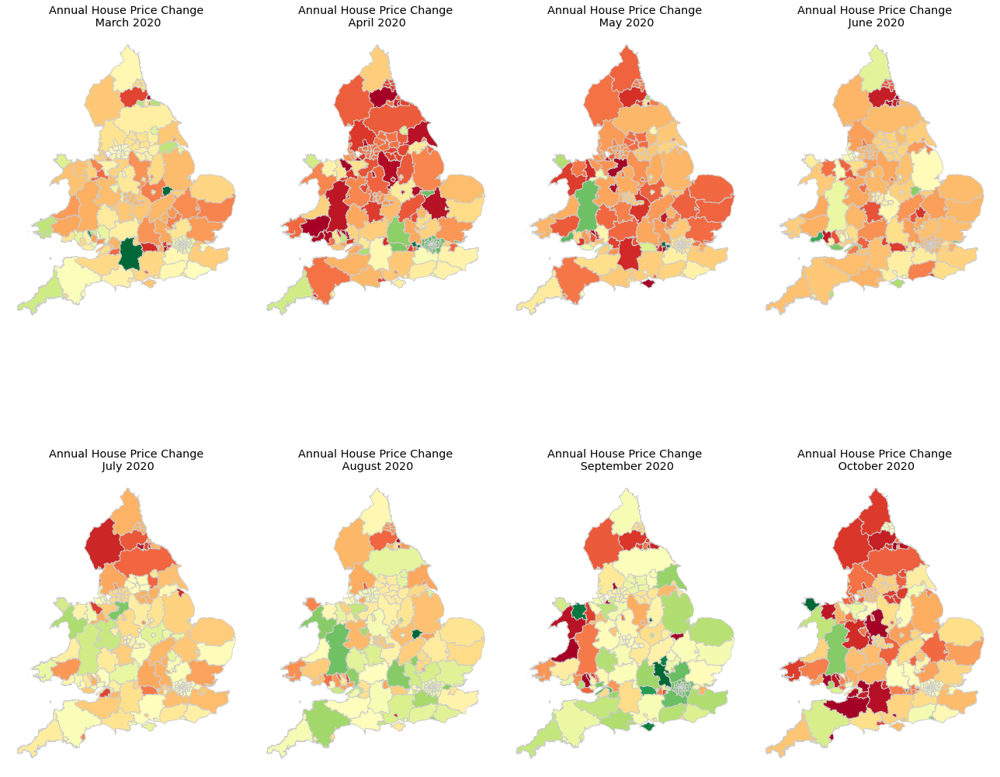

In [454]:
fig, axes = plt.subplots(2, 4, figsize=(18,18))
axes = axes.flatten()

plot_chg_map(geo_mar_covid, 'ann_price_change', 'RdYlGn', 'March', 0, 'Annual House Price Change')
plot_chg_map(geo_apr_covid, 'ann_price_change', 'RdYlGn', 'April', 1, 'Annual House Price Change')
plot_chg_map(geo_may_covid, 'ann_price_change', 'RdYlGn', 'May', 2, 'Annual House Price Change')
plot_chg_map(geo_jun_covid, 'ann_price_change', 'RdYlGn', 'June', 3, 'Annual House Price Change')
plot_chg_map(geo_jul_covid, 'ann_price_change', 'RdYlGn', 'July', 4, 'Annual House Price Change')
plot_chg_map(geo_aug_covid, 'ann_price_change', 'RdYlGn', 'August', 5, 'Annual House Price Change')
plot_chg_map(geo_sept_covid, 'ann_price_change', 'RdYlGn', 'September', 6, 'Annual House Price Change')
plot_chg_map(geo_oct_covid, 'ann_price_change', 'RdYlGn', 'October', 7, 'Annual House Price Change')


plt.tight_layout()
plt.show()

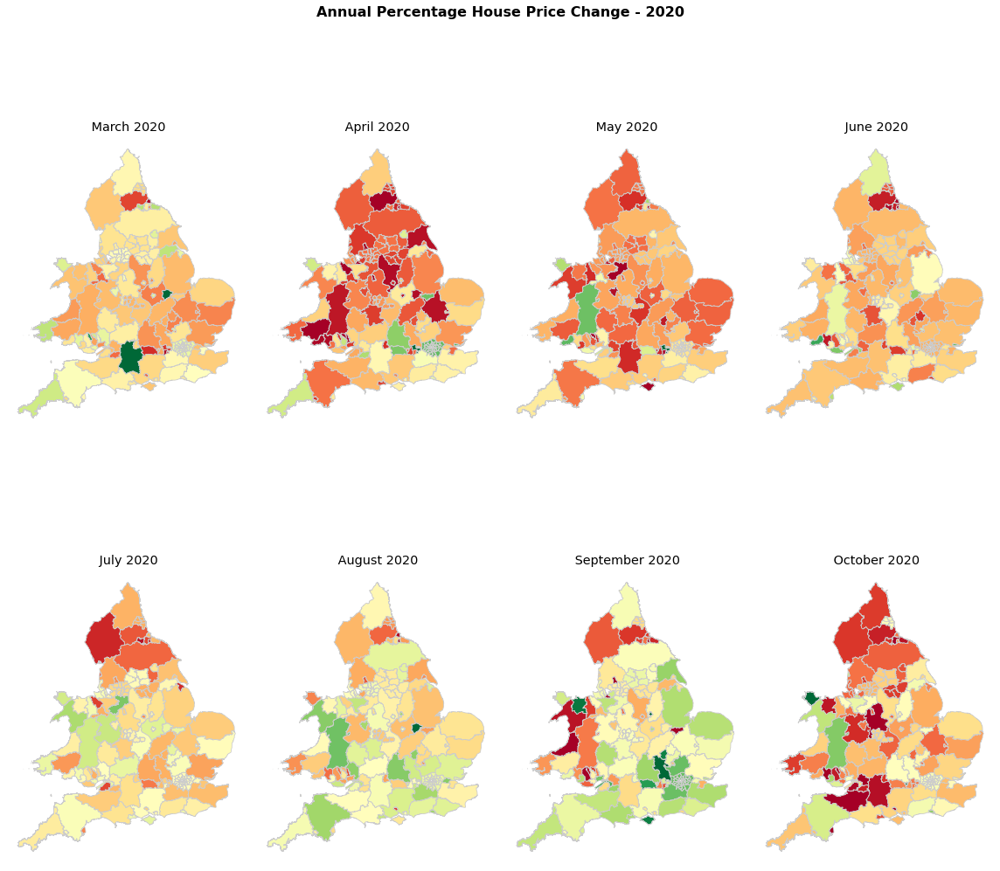

In [1455]:
fig, axes = plt.subplots(2, 4, figsize=(16,16))
axes = axes.flatten()

plot_chg_map(geo_mar_covid, 'ann_price_change', 'RdYlGn', 'March', 0, '')
plot_chg_map(geo_apr_covid, 'ann_price_change', 'RdYlGn', 'April', 1, '')
plot_chg_map(geo_may_covid, 'ann_price_change', 'RdYlGn', 'May', 2, '')
plot_chg_map(geo_jun_covid, 'ann_price_change', 'RdYlGn', 'June', 3, '')
plot_chg_map(geo_jul_covid, 'ann_price_change', 'RdYlGn', 'July', 4, '')
plot_chg_map(geo_aug_covid, 'ann_price_change', 'RdYlGn', 'August', 5, '')
plot_chg_map(geo_sept_covid, 'ann_price_change', 'RdYlGn', 'September', 6, '')
plot_chg_map(geo_oct_covid, 'ann_price_change', 'RdYlGn', 'October', 7, '')

plt.suptitle('Annual Percentage House Price Change - 2020', fontsize=(16), fontweight='bold')
plt.tight_layout()
plt.show()

# Looking at Price Paid Distributions Compared to Prior Years:

## Last 3 years dataframe:

In [146]:
last_3_yrs = hp_with_real_prices[(hp_with_real_prices['year']==2017) | (hp_with_real_prices['year']==2018)| (hp_with_real_prices['year']==2019)]

In [147]:
last_3_yrs.head(3)

,Unnamed: 0,transaction_id,price,date,postcode,property_type,new_build,lease_duration,house_name_num,secondary_name,...,town_city,district,county,price_paid_category,record_status,yr_month,year,month,oct_20_rebase,real_price
21982527,21982527,{50F18103-65BE-9FD5-E050-A8C063054923},125000,2017-04-06,BD23 2BE,Flat,Existing Build,Leasehold,BURNSIDE HOUSE,APARTMENT 22,...,SKIPTON,CRAVEN,NORTH YORKSHIRE,A,A,2017-04,2017,4,1.087583,135947.893625
21982528,21982528,{50F18103-65BF-9FD5-E050-A8C063054923},195000,2017-04-11,YO8 9GN,Semi-Detached,Existing Build,Freehold,5,NaN,...,SELBY,SELBY,NORTH YORKSHIRE,A,A,2017-04,2017,4,1.087583,212078.714055
21982529,21982529,{50F18103-65C0-9FD5-E050-A8C063054923},275000,2017-05-05,DL8 4BD,Detached,Existing Build,Freehold,LYNDHURST,NaN,...,LEYBURN,RICHMONDSHIRE,NORTH YORKSHIRE,A,A,2017-05,2017,5,1.083180,297874.493950


In [148]:
just_nineteen = hp_with_real_prices[(hp_with_real_prices['year']==2019)]

In [149]:
just_twenty.head()

,Unnamed: 0,transaction_id,price,date,postcode,property_type,new_build,lease_duration,house_name_num,secondary_name,...,district,county,price_paid_category,record_status,yr_month,year,month,oct_20_rebase,real_price,log_real_price
24872216,24872216,{9DBAD221-7C16-6EB3-E053-6B04A8C0F257},200000,2020-01-03,LL32 8BS,Terraced,Existing Build,Freehold,14,NaN,...,CONWY,CONWY,A,A,2020-01,2020,1,1.012732,202546.45560,12.218725
24872217,24872217,{9DBAD221-7C19-6EB3-E053-6B04A8C0F257},160000,2020-01-24,LL53 6HW,Terraced,Existing Build,Freehold,NEWBOROUGH HOUSE,NaN,...,GWYNEDD,GWYNEDD,A,A,2020-01,2020,1,1.012732,162037.16448,11.995581
24872218,24872218,{9DBAD221-7C1D-6EB3-E053-6B04A8C0F257},85000,2020-01-17,SA44 4BD,Terraced,Existing Build,Freehold,2,NaN,...,CEREDIGION,CEREDIGION,A,A,2020-01,2020,1,1.012732,86082.24363,11.363058
24872219,24872219,{9DBAD221-7C24-6EB3-E053-6B04A8C0F257},250000,2020-01-07,LL11 2PU,Semi-Detached,Existing Build,Freehold,64,NaN,...,WREXHAM,WREXHAM,A,A,2020-01,2020,1,1.012732,253183.06950,12.441868
24872220,24872220,{9DBAD221-7C28-6EB3-E053-6B04A8C0F257},305000,2020-01-16,CH8 7SY,Detached,Existing Build,Freehold,1,NaN,...,FLINTSHIRE,FLINTSHIRE,A,A,2020-01,2020,1,1.012732,308883.34479,12.640719


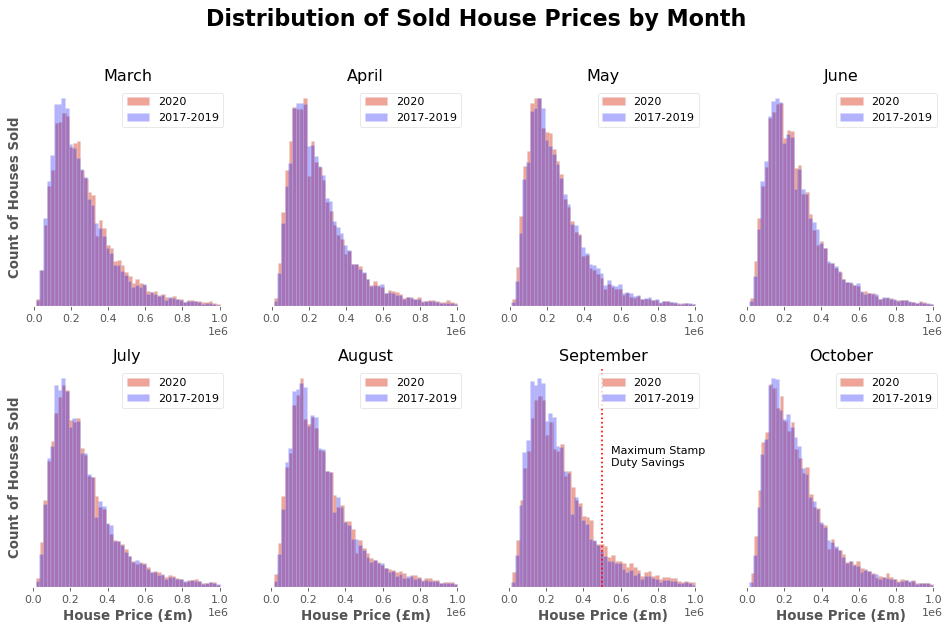

In [1405]:
fig, axes = plt.subplots(2, 4, figsize=(12,8), dpi=80)
axes = axes.flatten()
months = ['March', 'April', 'May', 'June', 'July', 'August', 'September', 'October']

#fig.patch.set_facecolor('slateblue')

for i in range(8):
    x = just_twenty[(just_twenty['price']>10000) & (just_twenty['price']<1000000) & (just_twenty['month']==i+3)].price

    x2 = last_3_yrs[(last_3_yrs['price']>10000) & (last_3_yrs['price']<1000000) & (last_3_yrs['month']==i+3)].price
    
    axes[i].hist(x, density=True, bins = 50, label = '2020', edgecolor='lightgrey', alpha = 0.5)
    axes[i].hist(x2, density=True, bins = 50, label = '2017-2019', edgecolor='lightgrey', alpha = 0.3, color='blue')
    
    axes[i].set_title('%s' % months[i])
    
    axes[i].legend()
    
    axes[i].set_facecolor("white")
    
    if i > 3:
        axes[i].set_xlabel('House Price (£m)', fontweight = 'bold')
        
    if (i == 0) | (i == 4):
        axes[i].set_ylabel('Count of Houses Sold', fontweight = 'bold')
    
    if (i != 0) | (i != 4):
        axes[i].set_yticks([])
        
    if i==6:
        axes[i].axvline(500000, linestyle="dotted", color = 'red')
        axes[i].text(550000, 0.000002, "Maximum Stamp\nDuty Savings")

plt.suptitle('Distribution of Sold House Prices by Month\n', fontsize = 20, fontweight = 'bold')
plt.tight_layout()

plt.show()

## Looking at September 2020 Only:

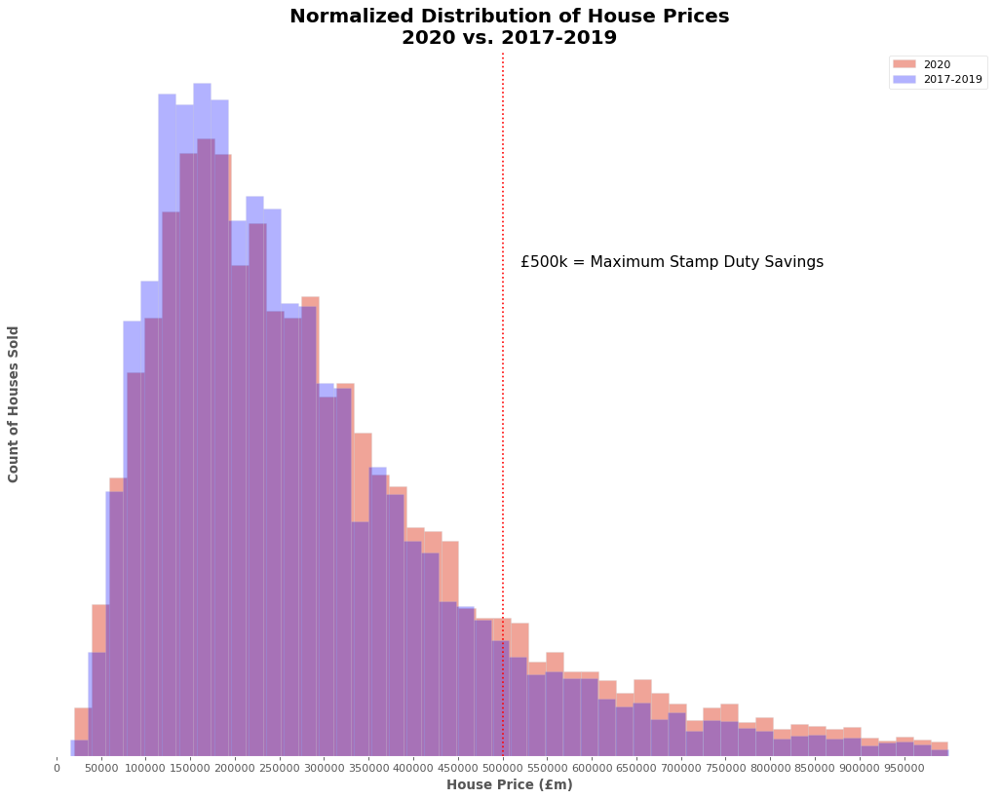

In [1407]:
fig, axes = plt.subplots(figsize=(16,12), dpi=80)
plt.rcParams['axes.facecolor'] = 'white'

x = just_twenty[(just_twenty['price']>10000) & (just_twenty['price']<1000000) & (just_twenty['month']==9)].price

x2 = last_3_yrs[(last_3_yrs['price']>10000) & (last_3_yrs['price']<1000000) & (last_3_yrs['month']==9)].price
    
axes.hist(x, density=True, bins = 50, label = '2020', edgecolor='lightgrey', alpha = 0.5)
axes.hist(x2, density=True, bins = 50, label = '2017-2019', edgecolor='lightgrey', alpha = 0.3, color='blue')

axes.axvline(500000, linestyle="dotted", color = 'red')
axes.text(520000, 0.0000025, "£500k = Maximum Stamp Duty Savings", fontsize = 14)

plt.xlabel('House Price (£m)', fontweight = 'bold')
plt.ylabel('Count of Houses Sold', fontweight = 'bold')
plt.xticks(np.arange(0, 1000000, step=50000))
plt.yticks([])
plt.title("Normalized Distribution of House Prices\n2020 vs. 2017-2019", fontsize = 18, fontweight = 'bold')
plt.legend()
plt.show()

# Creating Dataframe to Use for Regression:

In [150]:
covid_pop_county.head()

,county,yr_month_x,real_price,ann_price_change,year,month,yr_month_y,monthly_cases,population,cases_per_100k
0,Bath And North East Somerset,2020-01-01,408087.080371,0.061941,2020,1,NaN,0.0,193282,0.000000
1,Bath And North East Somerset,2020-02-01,368081.624487,-0.135711,2020,2,NaN,0.0,193282,0.000000
2,Bath And North East Somerset,2020-03-01,392199.964022,-0.070570,2020,3,2020-03,53.0,193282,27.421074
3,Bath And North East Somerset,2020-04-01,469495.468044,0.122327,2020,4,2020-04,201.0,193282,103.993129
4,Bath And North East Somerset,2020-05-01,373742.045354,-0.046602,2020,5,2020-05,77.0,193282,39.838164


- I will use the following features in my regression:

        - Lat/lon co-ords in the GWR.
        - Cases per 100k
        - % of flats sold in county - average over last 3yrs.
        - Lockdown or not (binary, dependent on location/month).
        - Stamp Duty Holiday - binary
        - Outdoor space per county
        - Average price paid - last 3 years
        - Population
        
- The target will be:
        
        - Annual Price Change

# Calculating Flat Proportion & Av. Price Paid - Last 3 Years:

In [151]:
one_c_prop_type = pd.get_dummies(last_3_yrs['property_type'])
one_c_prop_type.head(3)

,Detached,Flat,Semi-Detached,Terraced
21982527,0,1,0,0
21982528,0,0,1,0
21982529,1,0,0,0


In [152]:
last_3_yrs = last_3_yrs.join(one_c_prop_type.Flat)

In [153]:
last_3_yrs.head(3)

,Unnamed: 0,transaction_id,price,date,postcode,property_type,new_build,lease_duration,house_name_num,secondary_name,...,district,county,price_paid_category,record_status,yr_month,year,month,oct_20_rebase,real_price,Flat
21982527,21982527,{50F18103-65BE-9FD5-E050-A8C063054923},125000,2017-04-06,BD23 2BE,Flat,Existing Build,Leasehold,BURNSIDE HOUSE,APARTMENT 22,...,CRAVEN,NORTH YORKSHIRE,A,A,2017-04,2017,4,1.087583,135947.893625,1
21982528,21982528,{50F18103-65BF-9FD5-E050-A8C063054923},195000,2017-04-11,YO8 9GN,Semi-Detached,Existing Build,Freehold,5,NaN,...,SELBY,NORTH YORKSHIRE,A,A,2017-04,2017,4,1.087583,212078.714055,0
21982529,21982529,{50F18103-65C0-9FD5-E050-A8C063054923},275000,2017-05-05,DL8 4BD,Detached,Existing Build,Freehold,LYNDHURST,NaN,...,RICHMONDSHIRE,NORTH YORKSHIRE,A,A,2017-05,2017,5,1.083180,297874.493950,0


In [154]:
last_3_yrs['county'] = last_3_yrs['county'].str.title()

In [155]:
last_3_yrs['county'] = last_3_yrs['county'].str.replace('City Of ', '')

In [156]:
def convert_county_col(df):
    df['county'] = df['county'].str.title()
    df.loc[(df.county.isin(gl_list)), 'county'] = 'Greater London'
    df.loc[(df.county.isin(gm_list)), 'county'] = 'Greater Manchester'
    df.loc[(df.county.isin(wy_list)), 'county'] = 'West Yorkshire'
    df.loc[(df.county.isin(mer_list)), 'county'] = 'Merseyside'
    df.loc[(df.county.isin(sy_list)), 'county'] = 'South Yorkshire'
    df.loc[(df.county.isin(tnw_list)), 'county'] = 'Tyne And Wear'
    df.loc[(df.county.isin(wm_list)), 'county'] = 'West Midlands'
    df['county'] = df['county'].str.replace(', City Of', '')
    df['county'] = df['county'].str.replace(', County Of', '')
    df['county'] = df['county'].str.replace('Telford And Wrekin', 'Wrekin')
    df['county'] = df['county'].str.replace('Vale Of Glamorgan', 'The Vale Of Glamorgan')
    df['county'] = df['county'].str.replace('Rhondda Cynon Taf', 'Rhondda Cynon Taff')
    df['county'] = df['county'].str.replace('Cornwall And Isles Of Scilly', 'Cornwall')

In [157]:
price_flat_df = last_3_yrs.groupby('county')['real_price', 'Flat'].mean().reset_index()
price_flat_df.rename(columns={'real_price': '3yr_av_price', 'Flat': 'av_prop_flats'}, inplace=True)
price_flat_df.head(3)

C:\Users\rozhouse\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


,county,3yr_av_price,av_prop_flats
0,Bath And North East Somerset,419871.188521,0.224206
1,Bedford,313635.954039,0.162585
2,Blackburn With Darwen,143647.761532,0.037748


## Merging with Covid DF:

In [160]:
covid_price_flats = pd.merge(covid_pop_county, price_flat_df, how = 'left', on = 'county')

In [161]:
covid_price_flats.head()

,county,yr_month_x,real_price,ann_price_change,year,month,yr_month_y,monthly_cases,population,cases_per_100k,3yr_av_price,av_prop_flats
0,Bath And North East Somerset,2020-01-01,408087.080371,0.061941,2020,1,NaN,0.0,193282,0.000000,419871.188521,0.224206
1,Bath And North East Somerset,2020-02-01,368081.624487,-0.135711,2020,2,NaN,0.0,193282,0.000000,419871.188521,0.224206
2,Bath And North East Somerset,2020-03-01,392199.964022,-0.070570,2020,3,2020-03,53.0,193282,27.421074,419871.188521,0.224206
3,Bath And North East Somerset,2020-04-01,469495.468044,0.122327,2020,4,2020-04,201.0,193282,103.993129,419871.188521,0.224206
4,Bath And North East Somerset,2020-05-01,373742.045354,-0.046602,2020,5,2020-05,77.0,193282,39.838164,419871.188521,0.224206


In [162]:
covid_price_flats[covid_price_flats['3yr_av_price'].isnull()].county.value_counts()

Series([], Name: county, dtype: int64)

# Adding Binary - Lockdown/ Stamp Duty Columns:

In [170]:
wales_counties = ['Merthyr Tydfil', 'Caerphilly', 'Blaenau Gwent', 'Torfaen', 'Monmouthshire', 'Newport',
                 'Cardiff', 'The Vale of Glamorgan', 'Bridgend', 'Rhondda Cynon Taff', 'Neath Port Talbot',
                  'Swansea', 'Carmarthenshire', 'Ceredigion', 'Powys', 'Wrexham', 'Flintshire', 'Denbighshire',
                  'Conwy', 'Gwynedd', 'Pembrokeshire']

In [171]:
july_local_lock = ['Leicester']
aug_local_lock = ['Leicester', 'Blackburn With Darwen', 'Luton', 'Greater Manchester', 'West Yorkshire', 
                  'Lancashire', 'West Midlands']
sept_local_lock = ['Leicester', 'Blackburn With Darwen', 'Luton', 'Greater Manchester', 'West Yorkshire', 
                  'Lancashire', 'West Midlands', 'Tyne And Wear', 'County Durham', 'Northumberland', 'Merseyside',
                  'Warrington', 'Halton', 'Leicestershire']

## Lockdown and Local Lockdowns:
    - England: 23 March - 4th July
    - Local lockdowns by month specified manually
    
    - Wales: 23 March - 4th July
    - Local lockdowns covering most of country in Sept/Oct

In [172]:
covid_price_flats['lockdown'] = np.where((covid_price_flats.month.isin([4, 5, 6])) | 
                  (covid_price_flats.county.isin(wales_counties) & (covid_price_flats.month.isin([9,10])))|
                 (covid_price_flats.county.isin(july_local_lock) & (covid_price_flats.month.isin([7]))) |
                 (covid_price_flats.county.isin(aug_local_lock) & (covid_price_flats.month.isin([8]))) |
                 (covid_price_flats.county.isin(sept_local_lock) & (covid_price_flats.month.isin([9]))), 1, 0)

In [173]:
covid_price_flats.tail()

,county,yr_month_x,real_price,ann_price_change,year,month,yr_month_y,monthly_cases,population,cases_per_100k,3yr_av_price,av_prop_flats,lockdown
1095,York,2020-06-01,280690.989656,-0.002669,2020,6,2020-06,55.0,210618,26.113628,282027.500616,0.211393,1
1096,York,2020-07-01,285342.464849,0.018142,2020,7,2020-07,26.0,210618,12.344624,282027.500616,0.211393,0
1097,York,2020-08-01,299494.780457,0.077080,2020,8,2020-08,51.0,210618,24.214455,282027.500616,0.211393,0
1098,York,2020-09-01,309388.176471,0.056718,2020,9,2020-09,447.0,210618,212.232573,282027.500616,0.211393,0
1099,York,2020-10-01,260786.862745,-0.090295,2020,10,2020-10,3030.0,210618,1438.623479,282027.500616,0.211393,0


## Stamp Duty:

        - 8th July to 31 March 2021. No Stamp Duty payable on houses under £500k.

In [174]:
covid_price_flats['stamp_duty'] = np.where((covid_price_flats.month.isin([7, 8, 9, 10])), 1, 0)

# Merging With Outside Space Data:

In [175]:
merged_all_data = pd.merge(covid_price_flats, county_priv_os_grouped,  how='left', on=['county'])

In [176]:
merged_all_data.columns.to_list()

['county',
 'yr_month_x',
 'real_price',
 'ann_price_change',
 'year',
 'month',
 'yr_month_y',
 'monthly_cases',
 'population',
 'cases_per_100k',
 '3yr_av_price',
 'av_prop_flats',
 'lockdown',
 'stamp_duty',
 'priv_os_av_size']

In [178]:
merged_all_data.drop(['yr_month_y', 'monthly_cases'], axis=1, inplace=True)

In [179]:
merged_all_data.head(3)

,county,yr_month_x,real_price,ann_price_change,year,month,population,cases_per_100k,3yr_av_price,av_prop_flats,lockdown,stamp_duty,priv_os_av_size
0,Bath And North East Somerset,2020-01-01,408087.080371,0.061941,2020,1,193282,0.000000,419871.188521,0.224206,0,0,389.8
1,Bath And North East Somerset,2020-02-01,368081.624487,-0.135711,2020,2,193282,0.000000,419871.188521,0.224206,0,0,389.8
2,Bath And North East Somerset,2020-03-01,392199.964022,-0.070570,2020,3,193282,27.421074,419871.188521,0.224206,0,0,389.8


In [180]:
merged_all_data.shape

(1100, 13)

In [181]:
df1 = merged_all_data.pop('ann_price_change')
merged_all_data['ann_price_change']=df1

In [182]:
num_cols = ['month', 'population', 'cases_per_100k', '3yr_av_price', 'av_prop_flats', 'lockdown',
 'stamp_duty', 'priv_os_av_size', 'ann_price_change']

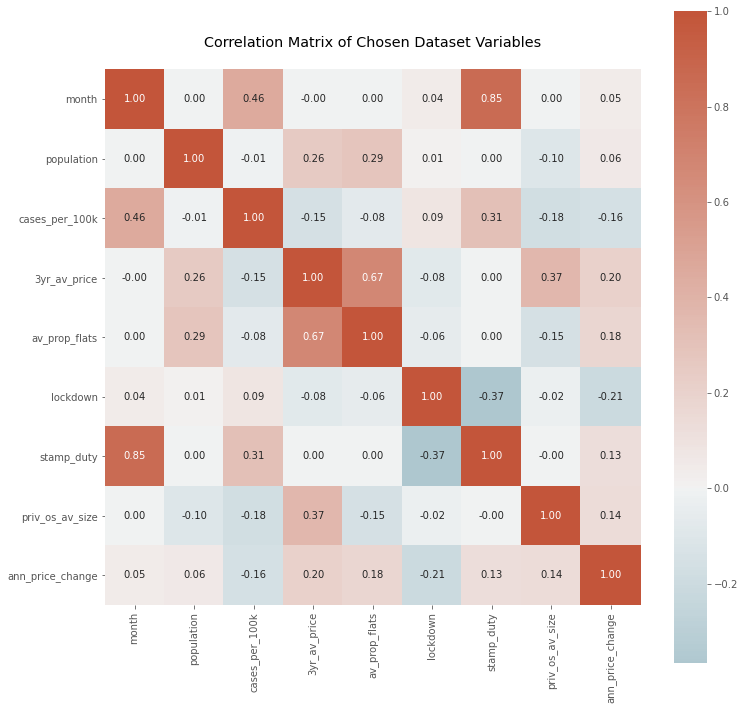

In [1429]:
plt.figure(figsize=(12,12))
corr = merged_all_data[num_cols].corr()
ax = sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, 
            annot=True, cmap=sns.diverging_palette(220, 20, as_cmap=True), center = 0, square = True, fmt=".2f")

plt.title('Correlation Matrix of Chosen Dataset Variables\n ')
plt.show()

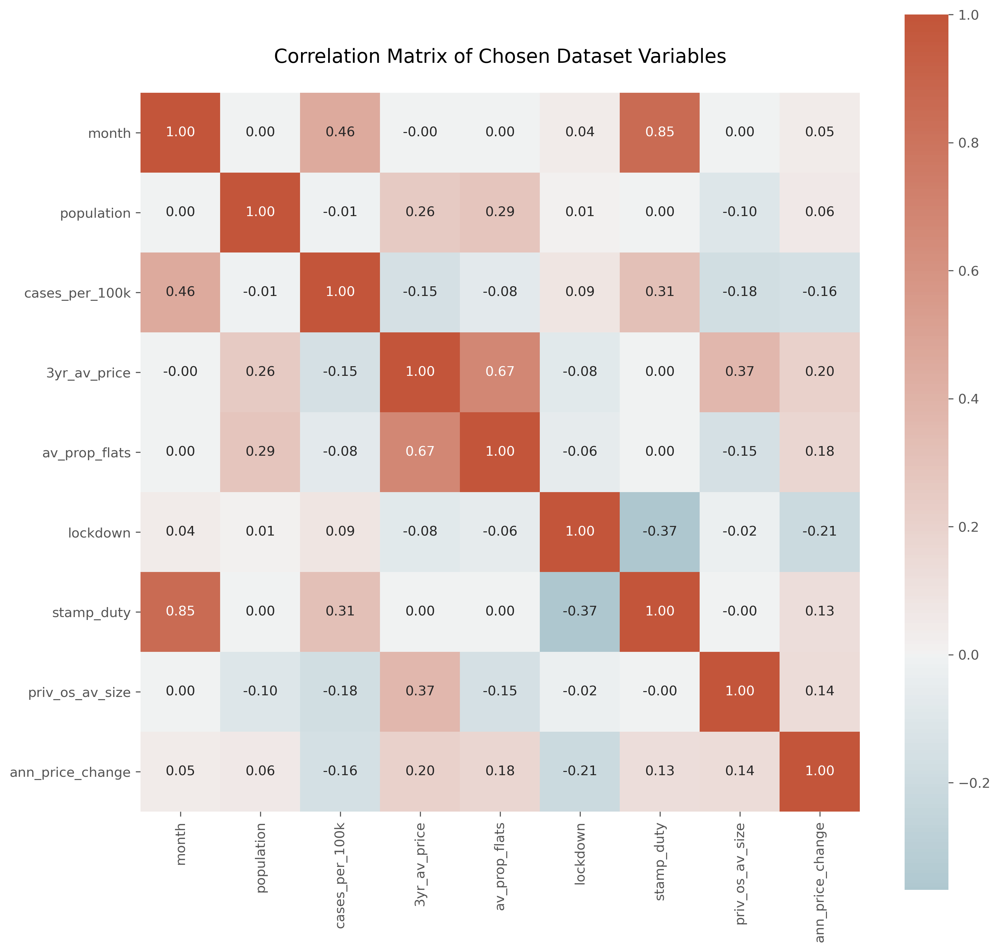

In [183]:
plt.figure(figsize=(12,12), dpi=300)
corr = merged_all_data[num_cols].corr()
ax = sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, 
            annot=True, cmap=sns.diverging_palette(220, 20, as_cmap=True), center = 0, square = True, fmt=".2f")

plt.title('Correlation Matrix of Chosen Dataset Variables\n ')
plt.savefig('corr_mat.png', bbox_inches='tight')
plt.show()

# Getting Co-Ord Data from Shapefile:

In [193]:
uk_shape.head()

,objectid,ctyua19cd,county,ctyua19nmw,bng_e,bng_n,long,lat,st_areasha,st_lengths,geometry
0,1,E06000001,Hartlepool,None,447160,531474,-1.27018,54.676140,9.834667e+07,66121.472650,"POLYGON ((447213.900 537036.104, 447228.798 53..."
1,2,E06000002,Middlesbrough,None,451141,516887,-1.21099,54.544670,5.455359e+07,41055.809886,"POLYGON ((448489.897 522071.798, 448592.597 52..."
2,3,E06000003,Redcar And Cleveland,None,464361,519597,-1.00608,54.567520,2.537854e+08,105292.138896,"POLYGON ((455525.931 528406.654, 455724.632 52..."
3,4,E06000004,Stockton-On-Tees,None,444940,518183,-1.30664,54.556911,2.097308e+08,108085.255484,"POLYGON ((444157.002 527956.304, 444165.898 52..."
4,5,E06000005,Darlington,None,428029,515648,-1.56835,54.535339,1.974757e+08,107206.401677,"POLYGON ((423496.602 524724.299, 423497.204 52..."


In [194]:
geog_cols = ['county', 'long', 'lat']

In [195]:
shape_lon_lat = uk_shape[geog_cols]

In [196]:
shape_lon_lat.head()

,county,long,lat
0,Hartlepool,-1.27018,54.676140
1,Middlesbrough,-1.21099,54.544670
2,Redcar And Cleveland,-1.00608,54.567520
3,Stockton-On-Tees,-1.30664,54.556911
4,Darlington,-1.56835,54.535339


In [197]:
shape_lon_lat_grouped = shape_lon_lat.groupby('county')[['long', 'lat']].mean().reset_index()

In [198]:
merged_all_data = pd.merge(merged_all_data, shape_lon_lat_grouped,  how='left', on=['county'])

In [199]:
merged_all_data.shape

(1100, 15)

# Saving Dataframe:

In [945]:
merged_all_data.to_csv('Data/data_for_gwr.csv', index=False)

In [200]:
feature_cols = ['population', 'population','cases_per_100k', 'cases_per_100k','3yr_av_price', '3yr_av_price',
                'av_prop_flats', 'av_prop_flats', 'lockdown', 'lockdown', 'stamp_duty', 'stamp_duty',
                'priv_os_av_size', 'priv_os_av_size', 'ann_price_change', 'ann_price_change']

In [201]:
col_names = ['Population', 'Population','Cases per 100k', 'Cases per 100k','3yr Av House Price', '3yr Av House Price',
                '% Flats', '% Flats', 'Lockdown', 'Lockdown', 'Stamp_duty', 'Stamp_duty',
                'Outdoor Space Size', 'Outdoor Space Size', 'Annual Price Chg', 'Annual Price Chg']

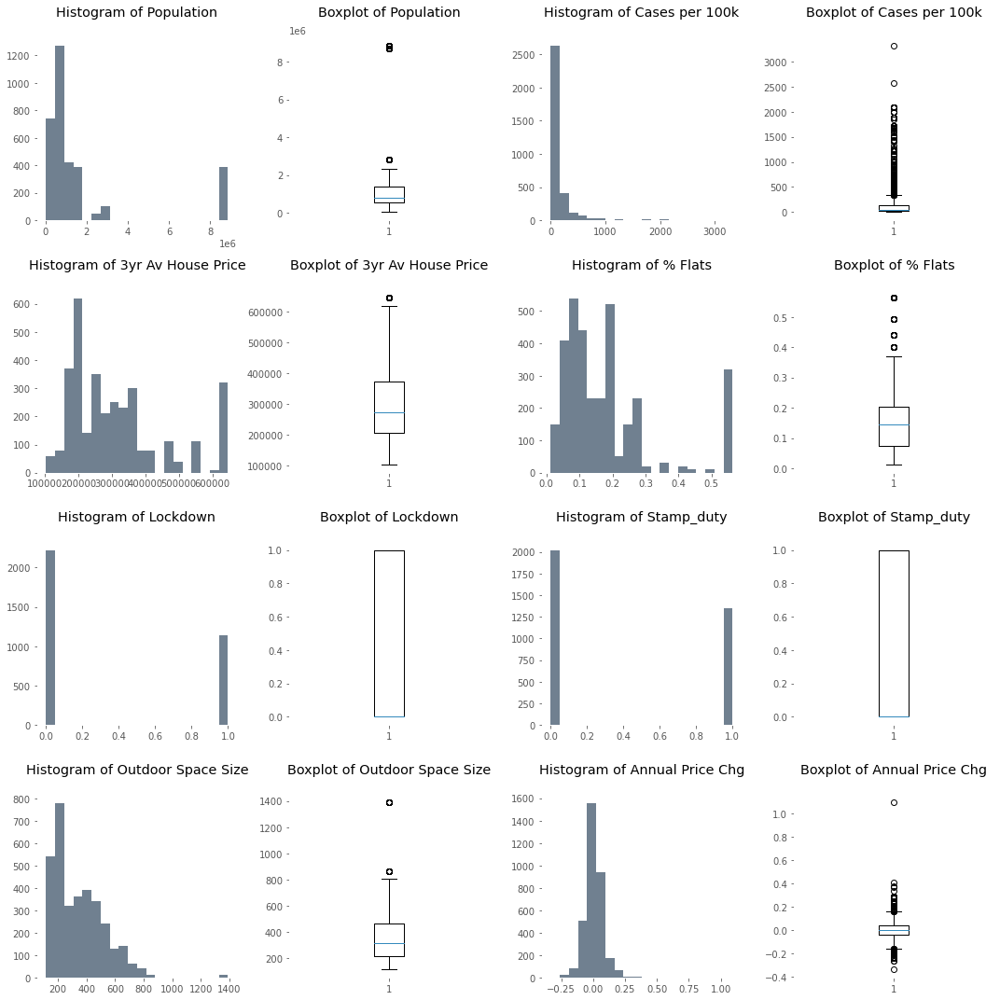

In [895]:
fig, ax = plt.subplots(4, 4, figsize=(15,15))
ax = ax.flatten()

for i in range(16):
    if i%2 == 0:
        ax[i].hist(merged_all_data[feature_cols[i]], bins =20, color = 'slategrey')
        ax[i].set_title('Histogram of %s\n' % col_names[i])
    else:
        ax[i].boxplot(merged_all_data[feature_cols[i]].values)
        ax[i].set_title('Boxplot of %s\n' % col_names[i])

plt.tight_layout()
plt.show()

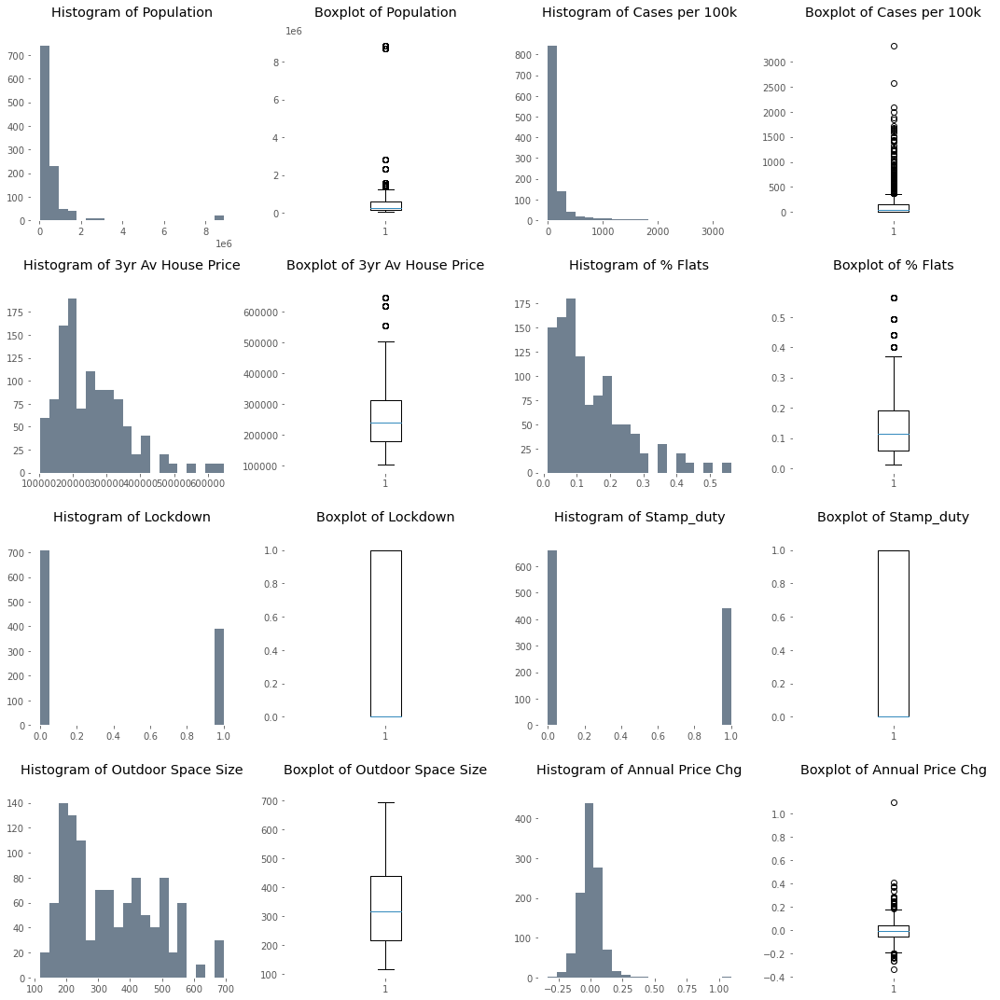

In [1402]:
fig, ax = plt.subplots(4, 4, figsize=(15,15))
ax = ax.flatten()

for i in range(16):
    if i%2 == 0:
        ax[i].hist(merged_all_data[feature_cols[i]], bins =20, color = 'slategrey')
        ax[i].set_title('Histogram of %s\n' % col_names[i])
    else:
        ax[i].boxplot(merged_all_data[feature_cols[i]].values)
        ax[i].set_title('Boxplot of %s\n' % col_names[i])

plt.tight_layout()
plt.show()

In [896]:
merged_all_data.sort_values(by='ann_price_change')

,county,yr_month_x,year,month,population,cases_per_100k,3yr_av_price,av_prop_flats,lockdown,stamp_duty,priv_os_av_size,long,lat,ann_price_change
1989,Merthyr Tydfil,2020-10-01,2020,10,60326,1848.290952,123214.198173,0.013226,1,1,183.6,-3.36425,51.748581,-0.331485
2599,Southampton,2020-10-01,2020,10,252520,471.249802,237608.988789,0.399966,0,1,199.1,-1.39952,50.921200,-0.259967
64,Bracknell Forest,2020-05-01,2020,5,122549,78.336013,400558.460773,0.257074,1,0,309.8,-0.73363,51.411301,-0.258241
2683,Staffordshire,2020-10-01,2020,10,879560,917.958979,225902.305649,0.074600,0,1,349.0,-2.02756,52.909302,-0.233513
2684,Staffordshire,2020-10-01,2020,10,879560,917.958979,225902.305649,0.074600,0,1,398.8,-2.02756,52.909302,-0.233513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2472,Rutland,2020-03-01,2020,3,39927,15.027425,332070.911831,0.096205,0,0,552.5,-0.62630,52.667648,0.335707
2477,Rutland,2020-08-01,2020,8,39927,40.073133,332070.911831,0.096205,0,1,552.5,-0.62630,52.667648,0.365968
1519,Isle Of Anglesey,2020-10-01,2020,10,70043,395.471353,202560.255082,0.057676,0,1,554.5,-4.32306,53.279419,0.377217
3254,Windsor And Maidenhead,2020-05-01,2020,5,151422,54.813699,619042.999205,0.293842,1,0,510.2,-0.67541,51.480339,0.409408


# Plotting Local r2 Data:

In [16]:
local_r2 = pd.read_csv('Data/localr2_data.csv')

In [17]:
local_r2.head()

,county,r2
0,Bath And North East Somerset,0.681310
1,Bedford,0.751026
2,Blackburn With Darwen,0.696377
3,Blackpool,0.694420
4,Blaenau Gwent,0.689430


In [18]:
len(local_r2)

110

In [19]:
local_r2_shp = pd.merge(local_r2, uk_shape,  how='left', on=['county'])

In [20]:
local_r2_shp.head()

,county,r2,objectid,ctyua19cd,ctyua19nmw,bng_e,bng_n,long,lat,st_areasha,st_lengths,geometry
0,Bath And North East Somerset,0.681310,22,E06000022,None,366217,161999,-2.48654,51.356041,3.511232e+08,141684.814206,"POLYGON ((376262.799 171210.701, 376272.998 17..."
1,Bedford,0.751026,52,E06000055,None,505721,256463,-0.45463,52.196281,4.764083e+08,131721.268581,"POLYGON ((505548.597 270000.003, 505658.100 26..."
2,Blackburn With Darwen,0.696377,8,E06000008,None,369490,422806,-2.46360,53.700802,1.370221e+08,65284.970983,"POLYGON ((369226.299 431801.198, 369234.000 43..."
3,Blackpool,0.694420,9,E06000009,None,332819,436635,-3.02199,53.821640,4.315077e+07,36304.964024,"POLYGON ((332978.998 440832.003, 332985.900 44..."
4,Blaenau Gwent,0.689430,211,W06000019,Blaenau Gwent,318236,206771,-3.18592,51.753639,1.087281e+08,65601.771071,"POLYGON ((314548.401 213433.705, 314698.404 21..."


In [21]:
len(local_r2_shp)

170

In [22]:
geo_local_r2 = GeoDataFrame(local_r2_shp)

In [23]:
geo_local_r2.head()

,county,r2,objectid,ctyua19cd,ctyua19nmw,bng_e,bng_n,long,lat,st_areasha,st_lengths,geometry
0,Bath And North East Somerset,0.681310,22,E06000022,None,366217,161999,-2.48654,51.356041,3.511232e+08,141684.814206,"POLYGON ((376262.799 171210.701, 376272.998 17..."
1,Bedford,0.751026,52,E06000055,None,505721,256463,-0.45463,52.196281,4.764083e+08,131721.268581,"POLYGON ((505548.597 270000.003, 505658.100 26..."
2,Blackburn With Darwen,0.696377,8,E06000008,None,369490,422806,-2.46360,53.700802,1.370221e+08,65284.970983,"POLYGON ((369226.299 431801.198, 369234.000 43..."
3,Blackpool,0.694420,9,E06000009,None,332819,436635,-3.02199,53.821640,4.315077e+07,36304.964024,"POLYGON ((332978.998 440832.003, 332985.900 44..."
4,Blaenau Gwent,0.689430,211,W06000019,Blaenau Gwent,318236,206771,-3.18592,51.753639,1.087281e+08,65601.771071,"POLYGON ((314548.401 213433.705, 314698.404 21..."


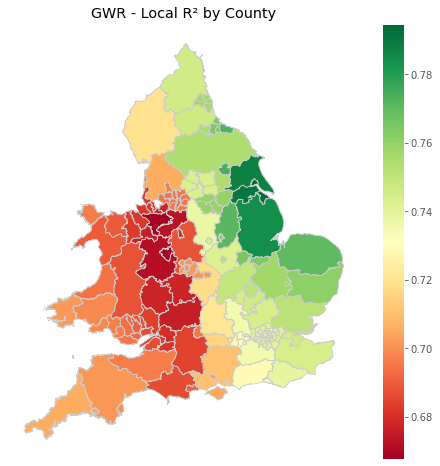

In [24]:
fig, ax = plt.subplots(figsize=(8,8))


geo_local_r2.plot(column='r2', cmap='RdYlGn', linewidth=0.8, edgecolor='0.8', ax=ax, legend = True)


plt.title('GWR - Local R² by County')
plt.grid('off')
plt.axis('off')

plt.show()

# Plotting Local Corr-Coefs:

In [25]:
corr_coeffs = pd.read_csv('Data/county_corr_coeffs.csv')

In [26]:
corr_coeffs.head()

,county,month_ann_price_change,log_pop_ann_price_change,log_cases_ann_price_change,log_price_ann_price_change,av_prop_flats_ann_price_change,lockdown_ann_price_change,stamp_duty_ann_price_change,priv_os_av_size_ann_price_change,last_mo_price_ann_price_change,log_real_price_ann_price_change
0,Bath And North East Somerset,0.039735,0.083537,-0.197735,0.138623,0.095604,-0.218714,0.142179,0.112781,0.153332,0.297800
1,Bedford,0.183146,0.028410,-0.018167,0.159197,0.161144,-0.200212,0.255907,0.069272,0.206773,0.309359
2,Blackburn With Darwen,0.079405,0.084888,-0.185891,0.241694,0.250134,-0.275266,0.198132,0.182333,0.264052,0.439302
3,Blackpool,0.076679,0.016624,-0.186312,0.216052,0.187722,-0.271903,0.185574,0.205024,0.238648,0.430261
4,Blaenau Gwent,0.001750,0.070505,-0.243281,0.156170,0.119032,-0.268080,0.111705,0.111988,0.157715,0.328760


In [27]:
local_metrics_shp = pd.merge(corr_coeffs, uk_shape,  how='left', on=['county'])

In [28]:
geo_metrics = GeoDataFrame(local_metrics_shp)

In [29]:
geo_metrics.head()

,county,month_ann_price_change,log_pop_ann_price_change,log_cases_ann_price_change,log_price_ann_price_change,av_prop_flats_ann_price_change,lockdown_ann_price_change,stamp_duty_ann_price_change,priv_os_av_size_ann_price_change,last_mo_price_ann_price_change,...,objectid,ctyua19cd,ctyua19nmw,bng_e,bng_n,long,lat,st_areasha,st_lengths,geometry
0,Bath And North East Somerset,0.039735,0.083537,-0.197735,0.138623,0.095604,-0.218714,0.142179,0.112781,0.153332,...,22,E06000022,None,366217,161999,-2.48654,51.356041,3.511232e+08,141684.814206,"POLYGON ((376262.799 171210.701, 376272.998 17..."
1,Bedford,0.183146,0.028410,-0.018167,0.159197,0.161144,-0.200212,0.255907,0.069272,0.206773,...,52,E06000055,None,505721,256463,-0.45463,52.196281,4.764083e+08,131721.268581,"POLYGON ((505548.597 270000.003, 505658.100 26..."
2,Blackburn With Darwen,0.079405,0.084888,-0.185891,0.241694,0.250134,-0.275266,0.198132,0.182333,0.264052,...,8,E06000008,None,369490,422806,-2.46360,53.700802,1.370221e+08,65284.970983,"POLYGON ((369226.299 431801.198, 369234.000 43..."
3,Blackpool,0.076679,0.016624,-0.186312,0.216052,0.187722,-0.271903,0.185574,0.205024,0.238648,...,9,E06000009,None,332819,436635,-3.02199,53.821640,4.315077e+07,36304.964024,"POLYGON ((332978.998 440832.003, 332985.900 44..."
4,Blaenau Gwent,0.001750,0.070505,-0.243281,0.156170,0.119032,-0.268080,0.111705,0.111988,0.157715,...,211,W06000019,Blaenau Gwent,318236,206771,-3.18592,51.753639,1.087281e+08,65601.771071,"POLYGON ((314548.401 213433.705, 314698.404 21..."


In [48]:
geo_metrics.columns.to_list()

['county',
 'month_ann_price_change',
 'log_pop_ann_price_change',
 'log_cases_ann_price_change',
 'log_price_ann_price_change',
 'av_prop_flats_ann_price_change',
 'lockdown_ann_price_change',
 'stamp_duty_ann_price_change',
 'priv_os_av_size_ann_price_change',
 'last_mo_price_ann_price_change',
 'log_real_price_ann_price_change',
 'objectid',
 'ctyua19cd',
 'ctyua19nmw',
 'bng_e',
 'bng_n',
 'long',
 'lat',
 'st_areasha',
 'st_lengths',
 'geometry']

In [63]:
def plot_corr_map(df, col, i, title):
    
    df.plot(column=col, cmap=sns.diverging_palette(220, 20, as_cmap=True), 
            linewidth=0.8, edgecolor='0.8', ax=axes[i], legend = True,
                      vmin = -0.25, 
                         vmax = 0.25)

    axes[i].set_title('%s' % (title))
    axes[i].grid('off')
    axes[i].axis('off')

    return

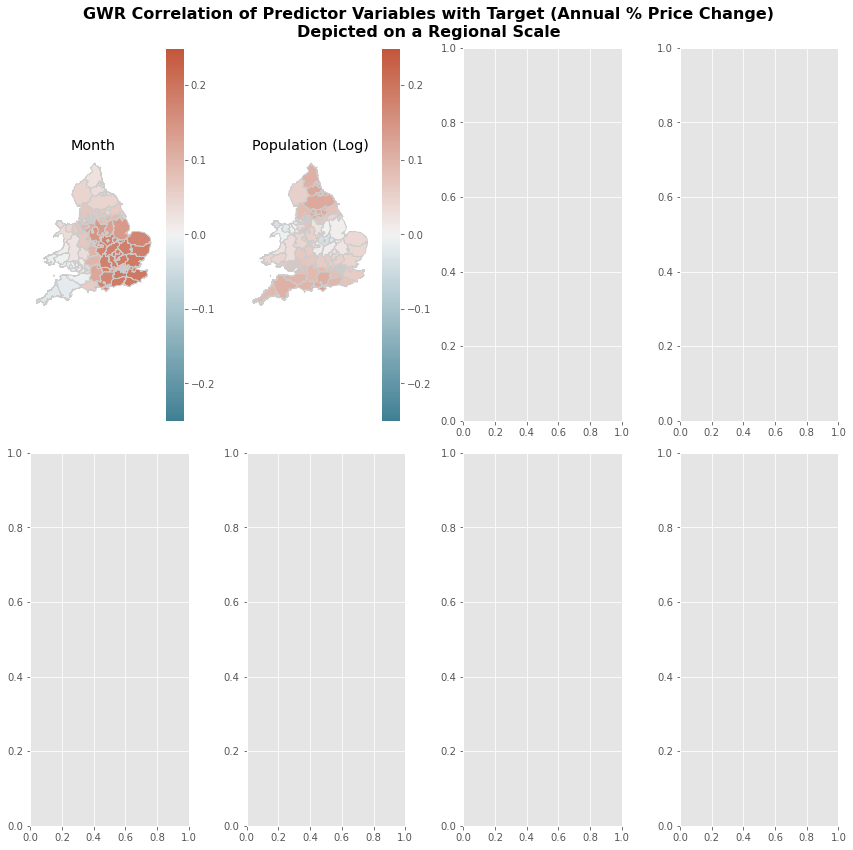

In [68]:
fig, axes = plt.subplots(2, 4, figsize=(12,12))
axes = axes.flatten()

plot_corr_map(geo_metrics, 'month_ann_price_change',  0, 'Month')
plot_corr_map(geo_metrics, 'log_pop_ann_price_change',  1, 'Population (Log)')


plt.suptitle('GWR Correlation of Predictor Variables with Target (Annual % Price Change)\nDepicted on a Regional Scale', fontsize = (16), fontweight = 'bold')

plt.tight_layout()
plt.savefig('Figures/overall_ts.png', bbox_inches='tight')
plt.show()

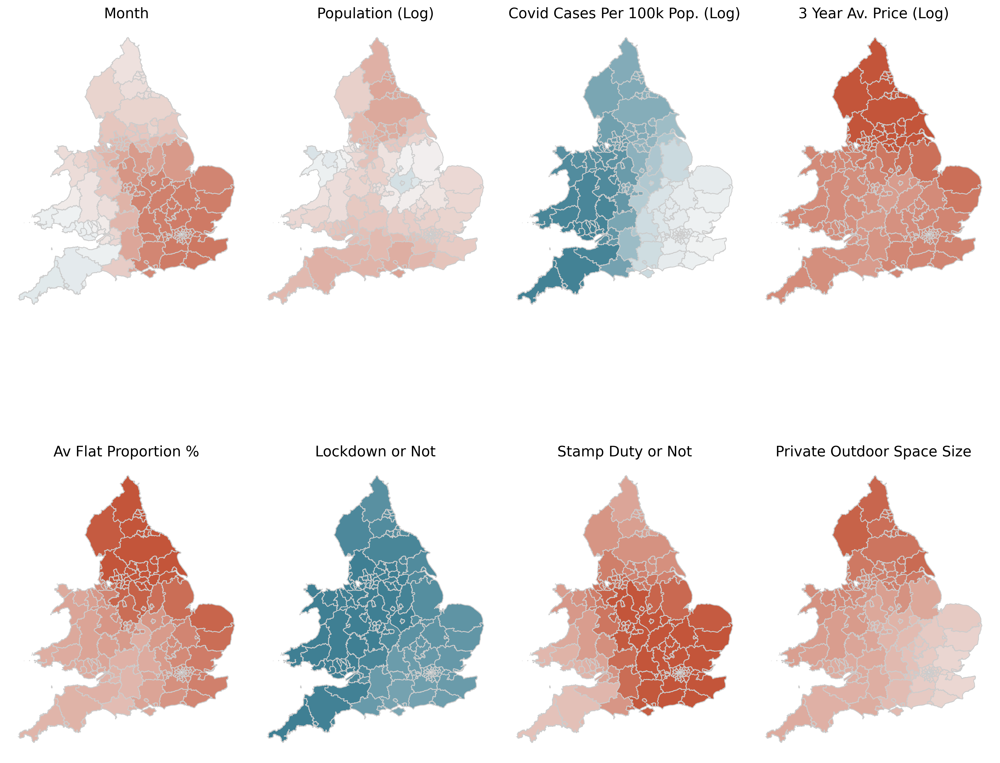

In [62]:
fig, axes = plt.subplots(2, 4, figsize=(14,14), dpi=300)
axes = axes.flatten()

plot_corr_map(geo_metrics, 'month_ann_price_change',  0, 'Month')
plot_corr_map(geo_metrics, 'log_pop_ann_price_change',  1, 'Population (Log)')
plot_corr_map(geo_metrics, 'log_cases_ann_price_change',  2, 'Covid Cases Per 100k Pop. (Log)')
plot_corr_map(geo_metrics, 'log_price_ann_price_change', 3, '3 Year Av. Price (Log)')
plot_corr_map(geo_metrics, 'av_prop_flats_ann_price_change',  4, 'Av Flat Proportion %')
plot_corr_map(geo_metrics, 'lockdown_ann_price_change',  5, 'Lockdown or Not')
plot_corr_map(geo_metrics, 'stamp_duty_ann_price_change',  6, 'Stamp Duty or Not')
plot_corr_map(geo_metrics, 'priv_os_av_size_ann_price_change', 7, 'Private Outdoor Space Size')


#plt.savefig('Figures/GWR_corr.png', bbox_inches='tight')
plt.tight_layout()
plt.show()

# Clustering Counties:

In [202]:
to_cluster = ['3yr_av_price', 'population', 'cases_per_100k', 'av_prop_flats', 'priv_os_av_size']

In [203]:
merged_all_data.head(3)

,county,yr_month_x,real_price,year,month,population,cases_per_100k,3yr_av_price,av_prop_flats,lockdown,stamp_duty,priv_os_av_size,ann_price_change,long,lat
0,Bath And North East Somerset,2020-01-01,408087.080371,2020,1,193282,0.000000,419871.188521,0.224206,0,0,389.8,0.061941,-2.48654,51.356041
1,Bath And North East Somerset,2020-02-01,368081.624487,2020,2,193282,0.000000,419871.188521,0.224206,0,0,389.8,-0.135711,-2.48654,51.356041
2,Bath And North East Somerset,2020-03-01,392199.964022,2020,3,193282,27.421074,419871.188521,0.224206,0,0,389.8,-0.070570,-2.48654,51.356041


In [204]:
merged_data_grouped = merged_all_data.groupby('county')[to_cluster].mean().reset_index()

In [205]:
merged_data_grouped.head()

,county,3yr_av_price,population,cases_per_100k,av_prop_flats,priv_os_av_size
0,Bath And North East Somerset,419871.188521,193282,114.599394,0.224206,389.8
1,Bedford,313635.954039,173292,136.186321,0.162585,344.0
2,Blackburn With Darwen,143647.761532,149696,451.181060,0.037748,172.6
3,Blackpool,125052.680305,139446,273.439181,0.094187,150.0
4,Blaenau Gwent,103723.028047,69862,240.474077,0.022327,179.6


In [206]:
merged_data_grouped['log_price'] = np.log(merged_data_grouped['3yr_av_price'])
merged_data_grouped['log_pop'] = np.log(merged_data_grouped['population'])
merged_data_grouped['log_cases'] = np.log1p(merged_data_grouped['cases_per_100k'])
merged_data_grouped['log_av_size'] = np.log(merged_data_grouped['priv_os_av_size'])

In [207]:
cluster_inc_logs = ['av_prop_flats', 'log_price', 'log_pop', 'log_cases', 'log_av_size']

## Scaling Features:

In [208]:
scaler = StandardScaler()

In [209]:
scaled_features = scaler.fit_transform(merged_data_grouped[cluster_inc_logs])

In [210]:
scaled_features[0]

array([ 0.75051204,  1.48353145, -0.49297163, -0.18767382,  0.54951322])

## PCA:

In [211]:
# Here I am setting the PCA to choose n_components so that 90% of the original variance explained:
pca_model = PCA(n_components=0.9)

In [212]:
pca_features = pca_model.fit_transform(scaled_features)

In [213]:
print('Explained variation: {}'.format(pca_model.explained_variance_ratio_))

Explained variation: [0.48075639 0.27472696 0.16808729]


## Elbow Locator Method:

In [977]:
kmeans_kwargs = {
   'init' : "random",
   'n_init' : 10,
   'max_iter': 300,
   'random_state': 42}

In [997]:
sse = []
for k in range(1, 16):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pca_features)
    sse.append(kmeans.inertia_)

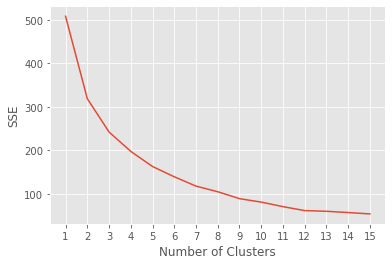

In [998]:
plt.style.use("ggplot")
plt.plot(range(1, 16), sse)
plt.xticks(range(1, 16))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [999]:
# Using knee locator to find the optimal number of clusters, i.e. at the elbow:
kl = KneeLocator(range(1, 16), sse, curve="convex", direction="decreasing")
kl.elbow

5

## Silhouette Scores:

For n_clusters = 3 The average silhouette_score is : 0.32875007769254533
For n_clusters = 4 The average silhouette_score is : 0.30296801937244255
For n_clusters = 5 The average silhouette_score is : 0.329596967489848


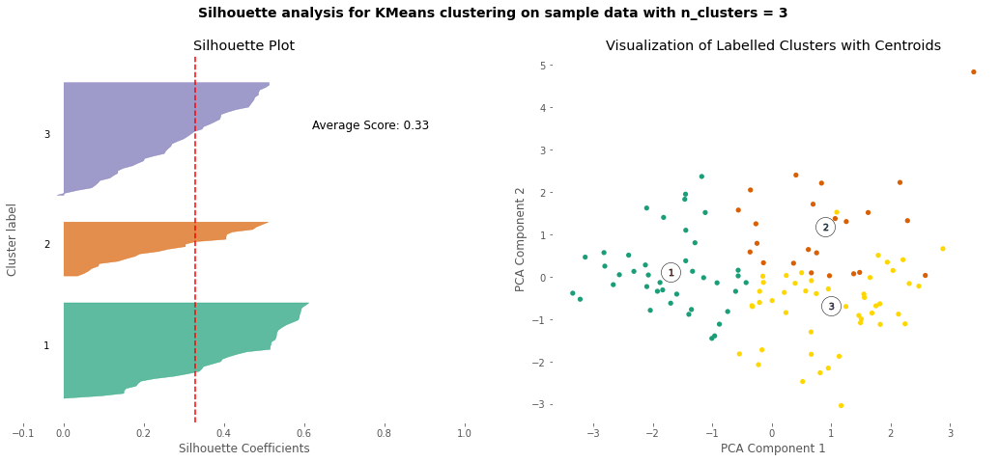

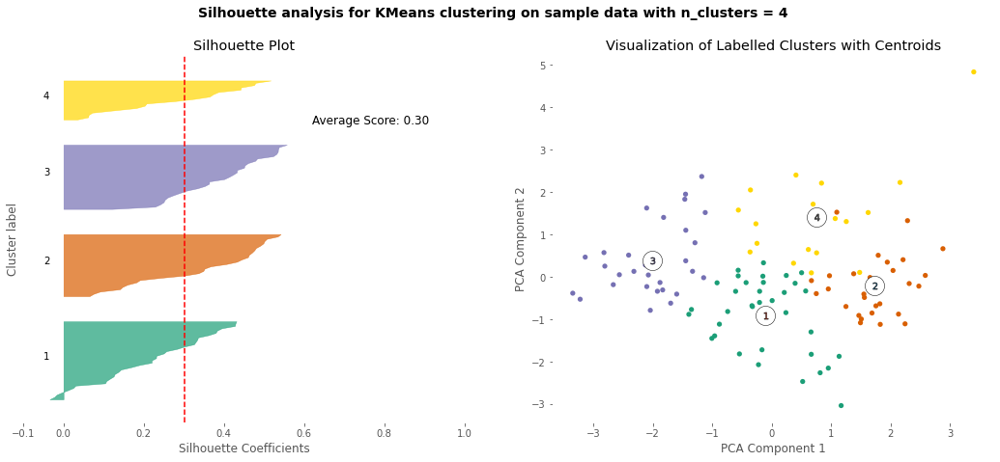

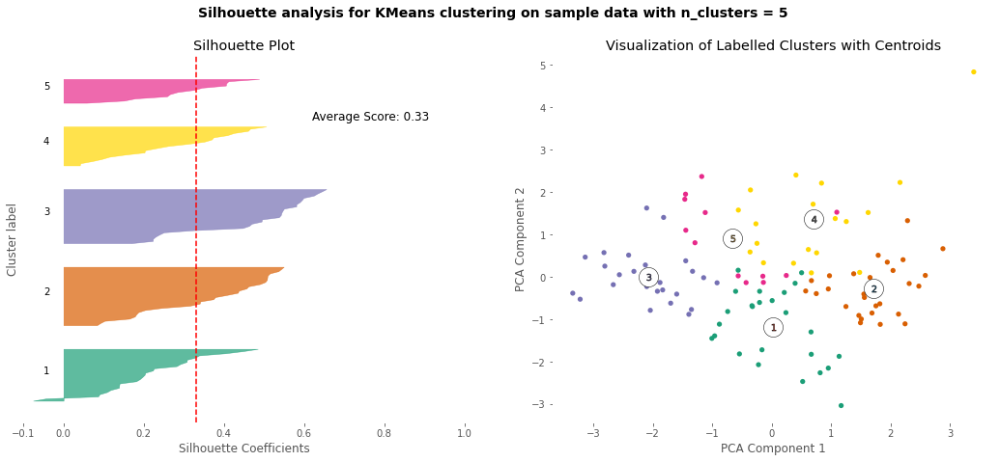

In [1448]:
# source code: https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html
range_n_clusters = [3, 4, 5]


for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(pca_features) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = clusterer.fit_predict(pca_features)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(pca_features, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(pca_features, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
        sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cols_5[i]
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i+1))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples
    
    ax1.text(0.62, y_upper - 20, "Average Score: ""{:.2f}".format(silhouette_avg), fontsize=(12))
    ax1.set_title("Silhouette Plot")
    ax1.set_xlabel("Silhouette Coefficients")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm_5_cols(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(pca_features[:, 0], pca_features[:, 1], marker='.', s=110, lw=0, alpha=1,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=400, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % (i+1), alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("Visualization of Labelled Clusters with Centroids")
    ax2.set_xlabel("PCA Component 1")
    ax2.set_ylabel("PCA Component 2")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

# Trialling Different Ones:

In [214]:
def kmeans_trial(k, data):
    kmeans_model = KMeans(
       n_clusters=k,
       n_init=10,
       max_iter=300,
       random_state=42)
    kmeans_model.fit(data)
    labels = kmeans_model.labels_
    return  labels

In [215]:
labels_3k = kmeans_trial(3, pca_features)
labels_4k = kmeans_trial(4, pca_features)
labels_5k = kmeans_trial(5, pca_features)

In [216]:
merged_data_grouped['labels_3k'] = labels_3k
merged_data_grouped['labels_4k'] = labels_4k
merged_data_grouped['labels_5k'] = labels_5k

In [217]:
cluster_shp = pd.merge(merged_data_grouped, uk_shape,  how='left', on=['county'])

In [218]:
geo_cluster = GeoDataFrame(cluster_shp)
geo_cluster.head(3)

,county,3yr_av_price,population,cases_per_100k,av_prop_flats,priv_os_av_size,log_price,log_pop,log_cases,log_av_size,...,objectid,ctyua19cd,ctyua19nmw,bng_e,bng_n,long,lat,st_areasha,st_lengths,geometry
0,Bath And North East Somerset,419871.188521,193282,114.599394,0.224206,389.8,12.947703,12.171906,4.750131,5.965634,...,22,E06000022,None,366217,161999,-2.48654,51.356041,3.511232e+08,141684.814206,"POLYGON ((376262.799 171210.701, 376272.998 17..."
1,Bedford,313635.954039,173292,136.186321,0.162585,344.0,12.655988,12.062733,4.921340,5.840642,...,52,E06000055,None,505721,256463,-0.45463,52.196281,4.764083e+08,131721.268581,"POLYGON ((505548.597 270000.003, 505658.100 26..."
2,Blackburn With Darwen,143647.761532,149696,451.181060,0.037748,172.6,11.875119,11.916362,6.114083,5.150977,...,8,E06000008,None,369490,422806,-2.46360,53.700802,1.370221e+08,65284.970983,"POLYGON ((369226.299 431801.198, 369234.000 43..."


In [219]:
custom_lines = [Line2D([0], [0], color=cm_3_cols(0.), lw=2),
                Line2D([0], [0], color=cm_3_cols(.5), lw=2),
                Line2D([0], [0], color=cm_3_cols(1.), lw=2)]

custom_lines2 = [Line2D([0], [0], color=cm_3_cols(0.), lw=2),
                Line2D([0], [0], color=cm_4_cols(.25), lw=2),
                Line2D([0], [0], color=cm_4_cols(.5), lw=2),
                Line2D([0], [0], color=cm_4_cols(1.), lw=2)]

custom_lines3 = [Line2D([0], [0], color=cm_3_cols(0.), lw=2),
                Line2D([0], [0], color=cm_5_cols(.2), lw=2),
                Line2D([0], [0], color=cm_5_cols(.4), lw=2),
                Line2D([0], [0], color=cm_5_cols(.6), lw=2),
                Line2D([0], [0], color=cm_5_cols(1.), lw=2)]

NameError: name 'Line2D' is not defined

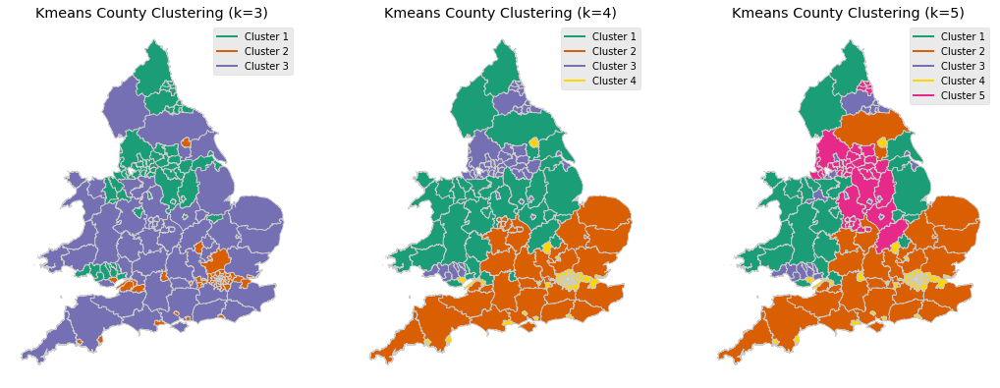

In [1134]:
import matplotlib.colors as colors
from matplotlib.lines import Line2D

fig, axes = plt.subplots(1, 3, figsize=(18,8))
axes = axes.flatten()

# # create the colorbar
#norm = colors.Normalize(vmin=geo_cluster.labels_3k.min(), vmax=geo_cluster.labels_3k.max())
#cbar = plt.cm.ScalarMappable( cmap=cm_3_cols)

geo_cluster.plot(column='labels_3k', cmap=cm_3_cols, linewidth=0.8, edgecolor='0.8', ax=axes[0], legend=False)
geo_cluster.plot(column='labels_4k', cmap=cm_4_cols, linewidth=0.8, edgecolor='0.8', ax=axes[1], legend=False)
geo_cluster.plot(column='labels_5k', cmap=cm_5_cols, linewidth=0.8, edgecolor='0.8', ax=axes[2], legend=False)

#ax_cbar = fig.colorbar(cbar, ax=axes[0])
axes[0].set_title('Kmeans County Clustering (k=3)')
axes[0].grid('off')
axes[0].axis('off')
axes[1].set_title('Kmeans County Clustering (k=4)')
axes[1].grid('off')
axes[1].axis('off')
axes[2].set_title('Kmeans County Clustering (k=5)')
axes[2].grid('off')
axes[2].axis('off')


axes[0].legend(custom_lines, ['Cluster 1', 'Cluster 2', 'Cluster 3'])
axes[1].legend(custom_lines2, ['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4'])
axes[2].legend(custom_lines3, ['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4', 'Cluster 5'])


plt.show()

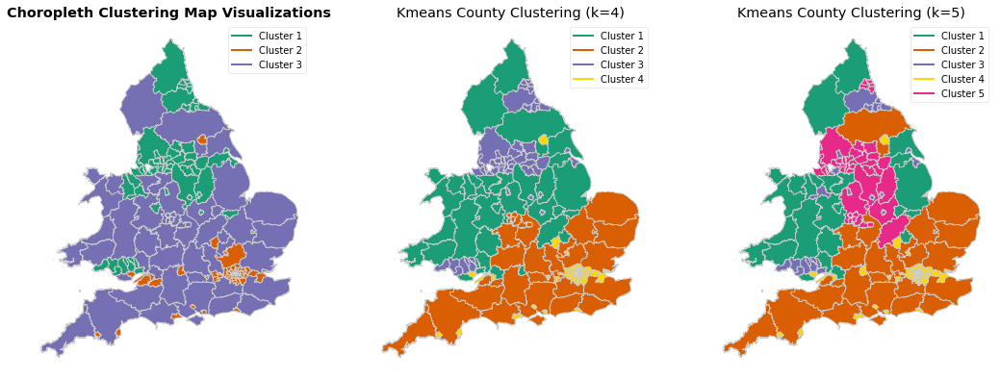

In [1432]:
import matplotlib.colors as colors
from matplotlib.lines import Line2D

fig, axes = plt.subplots(1, 3, figsize=(18,8))
axes = axes.flatten()

# # create the colorbar
#norm = colors.Normalize(vmin=geo_cluster.labels_3k.min(), vmax=geo_cluster.labels_3k.max())
#cbar = plt.cm.ScalarMappable( cmap=cm_3_cols)

geo_cluster.plot(column='labels_3k', cmap=cm_3_cols, linewidth=0.8, edgecolor='0.8', ax=axes[0], legend=False)
geo_cluster.plot(column='labels_4k', cmap=cm_4_cols, linewidth=0.8, edgecolor='0.8', ax=axes[1], legend=False)
geo_cluster.plot(column='labels_5k', cmap=cm_5_cols, linewidth=0.8, edgecolor='0.8', ax=axes[2], legend=False)

#ax_cbar = fig.colorbar(cbar, ax=axes[0])
axes[0].set_title('Kmeans County Clustering (k=3)')
axes[0].grid('off')
axes[0].axis('off')
axes[1].set_title('Kmeans County Clustering (k=4)')
axes[1].grid('off')
axes[1].axis('off')
axes[2].set_title('Kmeans County Clustering (k=5)')
axes[2].grid('off')
axes[2].axis('off')


axes[0].legend(custom_lines, ['Cluster 1', 'Cluster 2', 'Cluster 3'])
axes[1].legend(custom_lines2, ['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4'])
axes[2].legend(custom_lines3, ['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4', 'Cluster 5'])

axes[0].set_title("Choropleth Clustering Map Visualizations", fontweight = 'bold')
plt.show()

In [220]:
from matplotlib.colors import LinearSegmentedColormap
colors = ['#1b9e77', '#d95f02', '#7570b3']
cols_4 = ['#1b9e77', '#d95f02', '#7570b3', 'gold']
cols_5 = ['#1b9e77', '#d95f02', '#7570b3', 'gold', '#e7298a']

cm_3_cols = LinearSegmentedColormap.from_list('cols_3', colors, N=3)
cm_4_cols = LinearSegmentedColormap.from_list('cols_4', cols_4, N=4)
cm_5_cols = LinearSegmentedColormap.from_list('cols_5', cols_5, N=5)

# Inspecting Cluster Averages:

In [221]:
# Source: https://pandas.pydata.org/pandas-docs/stable/user_guide/style.html
def highlight_max(s):
    is_max = s == s.max()
    return ['background-color: yellow' if v else '' for v in is_max]

In [222]:
k_four_summary_df = merged_data_grouped.groupby('labels_4k')[to_cluster].mean().reset_index().T
k_four_summary_df = k_four_summary_df.rename(columns=k_four_summary_df.iloc[0]).drop(k_four_summary_df.index[0])
k_four_summary_df = k_four_summary_df.round(2)

In [223]:
k_four_summary_df.round(2).style.apply(highlight_max,subset=pd.IndexSlice[to_cluster, : ], axis=1)

,0.0,1.0,2.0,3.0
3yr_av_price,225522.430000,360743.940000,157091.420000,317602.870000
population,306484.860000,950871.750000,508013.720000,713665.220000
cases_per_100k,125.150000,77.520000,260.150000,118.250000
av_prop_flats,0.080000,0.180000,0.080000,0.320000
priv_os_av_size,413.650000,453.680000,205.370000,221.380000


In [224]:
k_five_summary_df = merged_data_grouped.groupby('labels_5k')[to_cluster].mean().reset_index().T
k_five_summary_df = k_five_summary_df.rename(columns=k_five_summary_df.iloc[0]).drop(k_five_summary_df.index[0])
k_five_summary_df = k_five_summary_df.round(2)

In [225]:
k_five_summary_df.round(2).style.apply(highlight_max,subset=pd.IndexSlice[to_cluster, : ], axis=1)

,0.0,1.0,2.0,3.0,4.0
3yr_av_price,226821.430000,362693.830000,154774.480000,314167.540000,203944.620000
population,221288.720000,656422.640000,189585.540000,687798.260000,1918359.000000
cases_per_100k,116.050000,79.790000,236.660000,117.680000,224.930000
av_prop_flats,0.080000,0.170000,0.060000,0.310000,0.110000
priv_os_av_size,452.500000,461.100000,210.030000,221.120000,269.650000


In [226]:
k_three_summary_df = merged_data_grouped.groupby('labels_3k')[to_cluster].mean().reset_index().T
k_three_summary_df = k_three_summary_df.rename(columns=k_three_summary_df.iloc[0]).drop(k_three_summary_df.index[0])
k_three_summary_df = k_three_summary_df.round(2)

In [227]:
k_three_summary_df.round(2).style.apply(highlight_max,subset=pd.IndexSlice[to_cluster, : ], axis=1)

,0.0,1.0,2.0
3yr_av_price,166196.060000,338672.080000,294240.800000
population,446913.620000,644236.610000,685867.320000
cases_per_100k,230.360000,114.740000,92.980000
av_prop_flats,0.070000,0.300000,0.120000
priv_os_av_size,237.690000,252.020000,464.200000


# Applying Clusters to See Price Change Differences:

In [228]:
merged_data_grouped[merged_data_grouped['county']=='Greater London']

,county,3yr_av_price,population,cases_per_100k,av_prop_flats,priv_os_av_size,log_price,log_pop,log_cases,log_av_size,labels_3k,labels_4k,labels_5k
34,Greater London,646426.253157,8700672,108.642183,0.56361,177.49375,13.379214,15.978911,4.697222,5.178935,1,3,3


In [229]:
county_clust = merged_data_grouped[['county', 'labels_3k', 'labels_4k', 'labels_5k']]

In [230]:
county_clust.head()

,county,labels_3k,labels_4k,labels_5k
0,Bath And North East Somerset,1,1,1
1,Bedford,2,0,0
2,Blackburn With Darwen,0,2,2
3,Blackpool,0,2,2
4,Blaenau Gwent,0,2,2


In [231]:
all_data_w_clust = pd.merge(merged_all_data, county_clust, how = 'left', on='county')

In [232]:
all_data_w_clust.head()

,county,yr_month_x,real_price,year,month,population,cases_per_100k,3yr_av_price,av_prop_flats,lockdown,stamp_duty,priv_os_av_size,ann_price_change,long,lat,labels_3k,labels_4k,labels_5k
0,Bath And North East Somerset,2020-01-01,408087.080371,2020,1,193282,0.000000,419871.188521,0.224206,0,0,389.8,0.061941,-2.48654,51.356041,1,1,1
1,Bath And North East Somerset,2020-02-01,368081.624487,2020,2,193282,0.000000,419871.188521,0.224206,0,0,389.8,-0.135711,-2.48654,51.356041,1,1,1
2,Bath And North East Somerset,2020-03-01,392199.964022,2020,3,193282,27.421074,419871.188521,0.224206,0,0,389.8,-0.070570,-2.48654,51.356041,1,1,1
3,Bath And North East Somerset,2020-04-01,469495.468044,2020,4,193282,103.993129,419871.188521,0.224206,1,0,389.8,0.122327,-2.48654,51.356041,1,1,1
4,Bath And North East Somerset,2020-05-01,373742.045354,2020,5,193282,39.838164,419871.188521,0.224206,1,0,389.8,-0.046602,-2.48654,51.356041,1,1,1


In [233]:
k3_cluster_0 = all_data_w_clust[(all_data_w_clust['labels_3k']==0) & ((all_data_w_clust['month']==4) 
                                                       |(all_data_w_clust['month']==5))]['ann_price_change'].mean()
k3_cluster_1 = all_data_w_clust[(all_data_w_clust['labels_3k']==1) & ((all_data_w_clust['month']==4) 
                                                       |(all_data_w_clust['month']==5))]['ann_price_change'].mean()
k3_cluster_2 = all_data_w_clust[(all_data_w_clust['labels_3k']==2) & ((all_data_w_clust['month']==4) 
                                                       |(all_data_w_clust['month']==5))]['ann_price_change'].mean()
print("Cluster 0:", k3_cluster_0)
print("Cluster 1:", k3_cluster_1)
print("Cluster 2:", k3_cluster_2)

Cluster 0: -0.06450463013174876
Cluster 1: -0.0005498747342033898
Cluster 2: -0.028430593890013633


In [234]:
k3_cluster_0_sept = all_data_w_clust[(all_data_w_clust['labels_3k']==0) & 
                                (all_data_w_clust['month']==9)]['ann_price_change'].mean()
k3_cluster_1_sept = all_data_w_clust[(all_data_w_clust['labels_3k']==1) & 
                                (all_data_w_clust['month']==9)]['ann_price_change'].mean()
k3_cluster_2_sept = all_data_w_clust[(all_data_w_clust['labels_3k']==2) & 
                                (all_data_w_clust['month']==9)]['ann_price_change'].mean()
print("Cluster 0:", k3_cluster_0_sept)
print("Cluster 1:", k3_cluster_1_sept)
print("Cluster 2:", k3_cluster_2_sept)

Cluster 0: -0.017321172722490046
Cluster 1: 0.06642703369567753
Cluster 2: 0.061671889005958554


In [235]:
k4_cluster_0 = all_data_w_clust[(all_data_w_clust['labels_4k']==0) & ((all_data_w_clust['month']==4) 
                                                       |(all_data_w_clust['month']==5))]['ann_price_change'].mean()
k4_cluster_1 = all_data_w_clust[(all_data_w_clust['labels_4k']==1) & ((all_data_w_clust['month']==4) 
                                                       |(all_data_w_clust['month']==5))]['ann_price_change'].mean()
k4_cluster_2 = all_data_w_clust[(all_data_w_clust['labels_4k']==2) & ((all_data_w_clust['month']==4) 
                                                       |(all_data_w_clust['month']==5))]['ann_price_change'].mean()
k4_cluster_3 = all_data_w_clust[(all_data_w_clust['labels_4k']==3) & ((all_data_w_clust['month']==4) 
                                                       |(all_data_w_clust['month']==5))]['ann_price_change'].mean()
print("Cluster 1: %.2f" % (k4_cluster_0*100))
print("Cluster 2: %.2f" % (k4_cluster_1*100))
print("Cluster 3: %.2f" % (k4_cluster_2*100))
print("Cluster 4: %.2f" % (k4_cluster_3*100))

Cluster 1: -4.47
Cluster 2: -0.48
Cluster 3: -6.79
Cluster 4: -1.44


In [236]:
k4_cluster_0_sept = all_data_w_clust[(all_data_w_clust['labels_4k']==0) & 
                                (all_data_w_clust['month']==9)]['ann_price_change'].mean()
k4_cluster_1_sept = all_data_w_clust[(all_data_w_clust['labels_4k']==1) & 
                                (all_data_w_clust['month']==9)]['ann_price_change'].mean()
k4_cluster_2_sept = all_data_w_clust[(all_data_w_clust['labels_4k']==2) & 
                                (all_data_w_clust['month']==9)]['ann_price_change'].mean()
k4_cluster_3_sept = all_data_w_clust[(all_data_w_clust['labels_4k']==3) & 
                                (all_data_w_clust['month']==9)]['ann_price_change'].mean()
print("Cluster 1: %.2f" % (k4_cluster_0_sept*100))
print("Cluster 2: %.2f" % (k4_cluster_1_sept*100))
print("Cluster 3: %.2f" % (k4_cluster_2_sept*100))
print("Cluster 4: %.2f" % (k4_cluster_3_sept*100))

Cluster 1: 1.52
Cluster 2: 9.65
Cluster 3: -1.97
Cluster 4: 5.96


In [237]:
k5_cluster_0 = all_data_w_clust[(all_data_w_clust['labels_5k']==0) & ((all_data_w_clust['month']==4) 
                                                       |(all_data_w_clust['month']==5))]['ann_price_change'].mean()
k5_cluster_1 = all_data_w_clust[(all_data_w_clust['labels_5k']==1) & ((all_data_w_clust['month']==4) 
                                                       |(all_data_w_clust['month']==5))]['ann_price_change'].mean()
k5_cluster_2 = all_data_w_clust[(all_data_w_clust['labels_5k']==2) & ((all_data_w_clust['month']==4) 
                                                       |(all_data_w_clust['month']==5))]['ann_price_change'].mean()
k5_cluster_3 = all_data_w_clust[(all_data_w_clust['labels_5k']==3) & ((all_data_w_clust['month']==4) 
                                                       |(all_data_w_clust['month']==5))]['ann_price_change'].mean()
k5_cluster_4 = all_data_w_clust[(all_data_w_clust['labels_5k']==4) & ((all_data_w_clust['month']==4) 
                                                       |(all_data_w_clust['month']==5))]['ann_price_change'].mean()
print("Cluster 1: %.2f" % (k5_cluster_0*100))
print("Cluster 2: %.2f" % (k5_cluster_1*100))
print("Cluster 3: %.2f" % (k5_cluster_2*100))
print("Cluster 4: %.2f" % (k5_cluster_3*100))
print("Cluster 5: %.2f" % (k5_cluster_4*100))

Cluster 1: -3.54
Cluster 2: -0.57
Cluster 3: -7.06
Cluster 4: -1.88
Cluster 5: -5.75


In [238]:
k5_cluster_0_sept = all_data_w_clust[(all_data_w_clust['labels_5k']==0) & 
                                (all_data_w_clust['month']==9)]['ann_price_change'].mean()
k5_cluster_1_sept = all_data_w_clust[(all_data_w_clust['labels_5k']==1) & 
                                (all_data_w_clust['month']==9)]['ann_price_change'].mean()
k5_cluster_2_sept = all_data_w_clust[(all_data_w_clust['labels_5k']==2) & 
                                (all_data_w_clust['month']==9)]['ann_price_change'].mean()
k5_cluster_3_sept = all_data_w_clust[(all_data_w_clust['labels_5k']==3) & 
                                (all_data_w_clust['month']==9)]['ann_price_change'].mean()
k5_cluster_4_sept = all_data_w_clust[(all_data_w_clust['labels_5k']==4) & 
                                (all_data_w_clust['month']==9)]['ann_price_change'].mean()
print("Cluster 1: %.2f" % (k5_cluster_0_sept*100))
print("Cluster 2: %.2f" % (k5_cluster_1_sept*100))
print("Cluster 3: %.2f" % (k5_cluster_2_sept*100))
print("Cluster 4: %.2f" % (k5_cluster_3_sept*100))
print("Cluster 5: %.2f" % (k5_cluster_4_sept*100))

Cluster 1: 1.00
Cluster 2: 9.65
Cluster 3: -2.69
Cluster 4: 5.97
Cluster 5: 2.89


# Plotting Clusters in Time Periods:

In [239]:
clustered_df = all_data_w_clust.groupby(['labels_4k', 'yr_month_x'])['ann_price_change'].mean().reset_index()

In [240]:
clustered_df.dtypes

labels_4k                    int64
yr_month_x          datetime64[ns]
ann_price_change           float64
dtype: object

In [241]:
clustered_df['labels_4k'] = clustered_df['labels_4k']+1
clustered_df['ann_price_change'] = round(clustered_df['ann_price_change']*100, 2)

In [242]:
clustered_df.head()

,labels_4k,yr_month_x,ann_price_change
0,1,2020-01-01,0.16
1,1,2020-02-01,1.09
2,1,2020-03-01,1.34
3,1,2020-04-01,-5.42
4,1,2020-05-01,-3.53


In [243]:
table = pd.pivot_table(clustered_df, values='ann_price_change', index=['yr_month_x'],
                    columns=['labels_4k'])

In [244]:
table = table.reset_index()

In [245]:
table.head()

labels_4k,yr_month_x,1,2,3,4
0,2020-01-01,0.16,-0.82,-0.32,1.53
1,2020-02-01,1.09,-0.33,-0.80,-1.16
2,2020-03-01,1.34,2.91,2.19,0.93
3,2020-04-01,-5.42,1.25,-9.51,0.09
4,2020-05-01,-3.53,-2.22,-4.06,-2.98


In [246]:
table.rename(columns={1.0: 'cluster_1', 2.0: 'cluster_2', 3.0: 'cluster_3', 4.0: 'cluster_4'}, inplace=True)

# Generating 2019 Comparison:

In [247]:
nineteen_df = hp_with_real_prices[(hp_with_real_prices['year']==2018) | (hp_with_real_prices['year']==2019)]
nineteen_df = nineteen_df.groupby(['county', 'yr_month']).real_price.mean().reset_index()
nineteen_df['ann_price_change'] = nineteen_df.real_price.pct_change(periods=12)
nineteen_df['yr_month'] = pd.to_datetime(nineteen_df['yr_month'])
nineteen_df['year'] = pd.DatetimeIndex(nineteen_df['yr_month']).year
nineteen_df = nineteen_df[nineteen_df['year']!= 2018]
nineteen_df['county'] = nineteen_df['county'].str.title()

In [248]:
nineteen_df.head()

,county,yr_month,real_price,ann_price_change,year
12,Bath And North East Somerset,2019-01-01,384284.091898,-0.100678,2019
13,Bath And North East Somerset,2019-02-01,425877.725326,0.111809,2019
14,Bath And North East Somerset,2019-03-01,421978.797440,0.027595,2019
15,Bath And North East Somerset,2019-04-01,418323.210378,0.028972,2019
16,Bath And North East Somerset,2019-05-01,392010.381332,-0.022586,2019


In [249]:
just4k_labels = county_clust[['county', 'labels_4k']]
just4k_labels.head()

,county,labels_4k
0,Bath And North East Somerset,1
1,Bedford,0
2,Blackburn With Darwen,2
3,Blackpool,2
4,Blaenau Gwent,2


In [250]:
ninteen_clusters = pd.merge(nineteen_df, just4k_labels, how='left', on='county').reset_index()
ninteen_clusters.head(3)

,index,county,yr_month,real_price,ann_price_change,year,labels_4k
0,0,Bath And North East Somerset,2019-01-01,384284.091898,-0.100678,2019,1.0
1,1,Bath And North East Somerset,2019-02-01,425877.725326,0.111809,2019,1.0
2,2,Bath And North East Somerset,2019-03-01,421978.797440,0.027595,2019,1.0


In [251]:
ninteen_clusters = ninteen_clusters.groupby(['labels_4k', 'yr_month'])['ann_price_change'].mean().reset_index()

In [252]:
ninteen_clusters.dtypes

labels_4k                  float64
yr_month            datetime64[ns]
ann_price_change           float64
dtype: object

In [253]:
ninteen_clusters['labels_4k'] = ninteen_clusters['labels_4k']+1
ninteen_clusters['ann_price_change'] = round(ninteen_clusters['ann_price_change']*100, 2)

In [254]:
table_19 = pd.pivot_table(ninteen_clusters, values='ann_price_change', index=['yr_month'],
                    columns=['labels_4k']).reset_index()

In [255]:
table_19.rename(columns={1.0: 'cluster_1', 2.0: 'cluster_2', 3.0: 'cluster_3', 4.0: 'cluster_4'}, inplace=True)

In [256]:
table_19.head()

labels_4k,yr_month,cluster_1,cluster_2,cluster_3,cluster_4
0,2019-01-01,-0.32,-2.04,-2.97,-1.69
1,2019-02-01,-1.22,-1.60,1.66,2.81
2,2019-03-01,-1.45,-2.59,-0.91,-4.32
3,2019-04-01,1.94,-2.44,0.18,-1.12
4,2019-05-01,0.00,-2.64,-0.47,8.73


In [257]:
import matplotlib.dates as md
import datetime

## 2019 vs 2020 Cluster Time Series Plot:

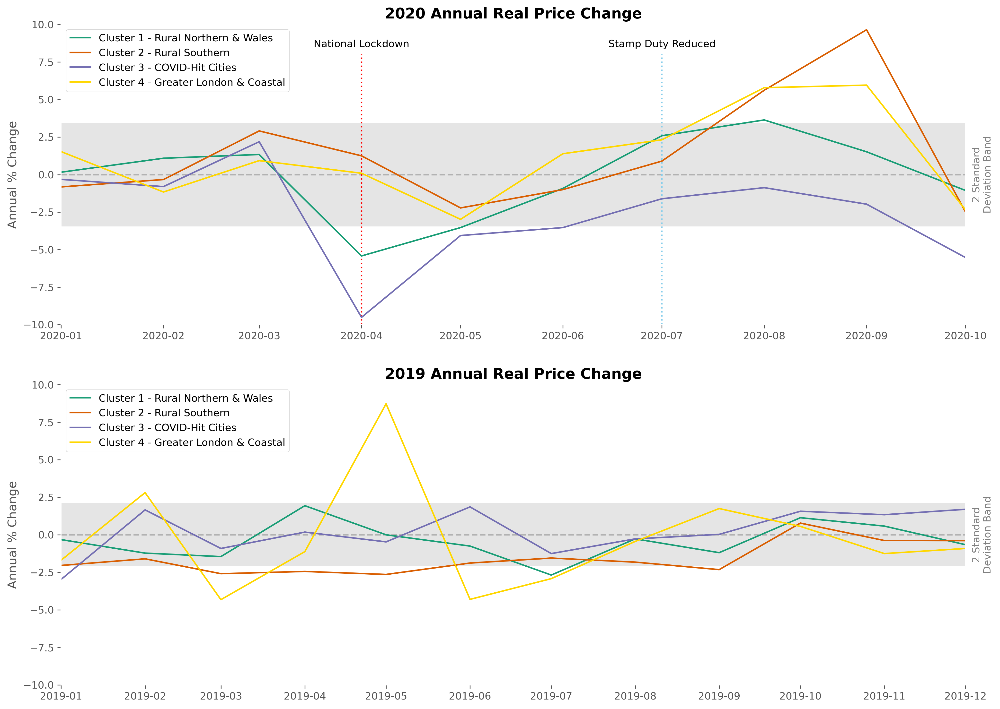

In [260]:
plt.rcParams['axes.facecolor'] = 'white'
fig, axs = plt.subplots(2, 1, figsize=(16, 12), dpi=300)
dat_20 = table.yr_month_x
dat_19 = table_19.yr_month
std_20 = std(clustered_df.ann_price_change)
std_19 = std(ninteen_clusters.ann_price_change)
mean_20 = mean(clustered_df.ann_price_change)

sns.lineplot(data=table, x="yr_month_x", y='cluster_1', color= cols_4[0], ax=axs[0], label= 'Cluster 1 - Rural Northern & Wales')
sns.lineplot(data=table, x="yr_month_x", y="cluster_2", color= cols_4[1], ax=axs[0], label= 'Cluster 2 - Rural Southern')
sns.lineplot(data=table, x="yr_month_x", y='cluster_3', color= cols_4[2], ax=axs[0], label= 'Cluster 3 - COVID-Hit Cities')
sns.lineplot(data=table, x="yr_month_x", y="cluster_4", color= cols_4[3], ax=axs[0], label= 'Cluster 4 - Greater London & Coastal')

sns.lineplot(data=table_19, x="yr_month", y='cluster_1', color= cols_4[0], label= 'Cluster 1 - Rural Northern & Wales', ax=axs[1])
sns.lineplot(data=table_19, x="yr_month", y="cluster_2", color= cols_4[1], label= 'Cluster 2 - Rural Southern', ax=axs[1])
sns.lineplot(data=table_19, x="yr_month", y='cluster_3', color= cols_4[2], label= 'Cluster 3 - COVID-Hit Cities', ax=axs[1])
sns.lineplot(data=table_19, x="yr_month", y="cluster_4", color= cols_4[3], label= 'Cluster 4 - Greater London & Coastal', ax=axs[1])

axs[0].axhspan(-std_20, std_20, color='grey', alpha=0.2, lw=0)
axs[0].hlines(0, min(dat_20), max(dat_20), linestyle="dashed", color = 'grey', alpha =0.5)
axs[1].axhspan(-std_19, std_19, color='grey', alpha=0.2, lw=0)
axs[1].hlines(0, min(dat_19), max(dat_19), linestyle="dashed", color = 'grey', alpha =0.5)

axs[0].vlines(table.yr_month_x[3:4], -10, 8, linestyle="dotted", color = 'red')
axs[0].text(table.yr_month_x[3:4], 8.5, "National Lockdown", horizontalalignment='center')
axs[0].vlines(table.yr_month_x[6:7], -10, 8, linestyle="dotted", color = 'skyblue')
axs[0].text(table.yr_month_x[6:7], 8.5, "Stamp Duty Reduced", horizontalalignment='center')

axs[0].set_ylim(-10, 10)
axs[1].set_ylim(-10, 10)

axs[0].set_xlim(min(dat_20), max(dat_20))
axs[1].set_xlim(min(dat_19), max(dat_19))

axs[0].text(table.yr_month_x[9:10], 0, "\n\n\n2 Standard\nDeviation Band", horizontalalignment='center', color='grey',
           rotation = 90, verticalalignment='center')
axs[1].text(table_19.yr_month[11:12], 0, "\n\n\n2 Standard\nDeviation Band", horizontalalignment='center', color='grey',
           rotation = 90, verticalalignment='center')

axs[0].set_xlabel("")
axs[1].set_xlabel("")
axs[0].set_ylabel("Annual % Change")
axs[1].set_ylabel("Annual % Change")

axs[0].set_title("2020 Annual Real Price Change", fontweight = 'bold')
axs[1].set_title("2019 Annual Real Price Change", fontweight = 'bold')

axs[0].legend(loc = 'upper left')
axs[1].legend(loc = 'upper left')

plt.savefig('cluster_time_series.png', bbox_inches='tight')
plt.show()

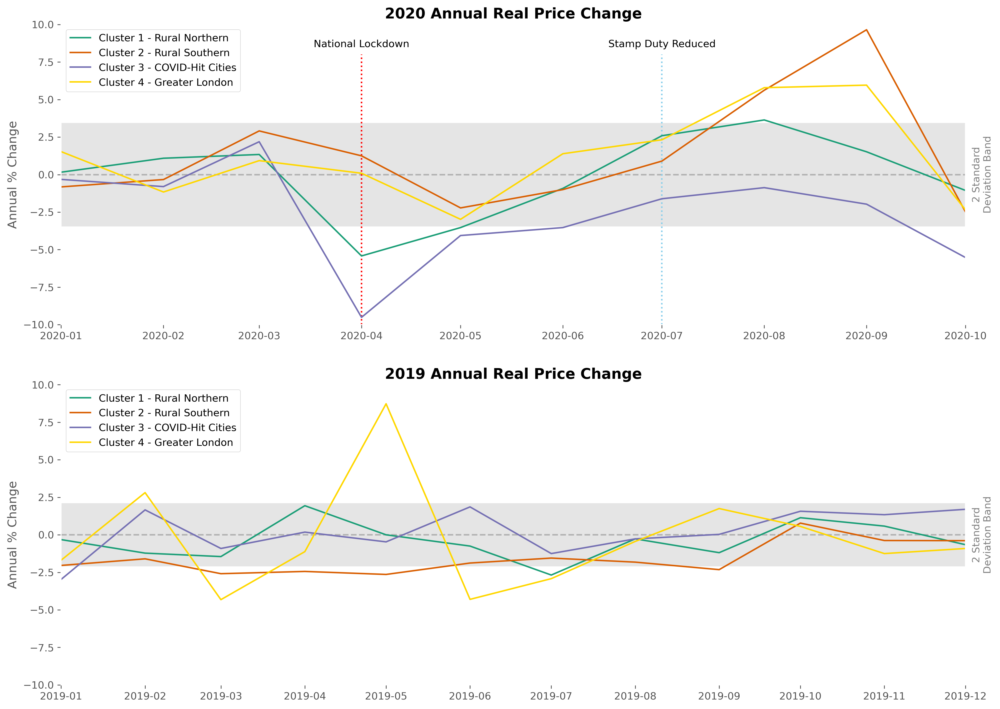

In [1461]:
plt.rcParams['axes.facecolor'] = 'white'
fig, axs = plt.subplots(2, 1, figsize=(16, 12), dpi=300)
dat_20 = table.yr_month_x
dat_19 = table_19.yr_month
std_20 = std(clustered_df.ann_price_change)
std_19 = std(ninteen_clusters.ann_price_change)
mean_20 = mean(clustered_df.ann_price_change)

sns.lineplot(data=table, x="yr_month_x", y='cluster_1', color= cols_4[0], ax=axs[0], label= 'Cluster 1 - Rural Northern')
sns.lineplot(data=table, x="yr_month_x", y="cluster_2", color= cols_4[1], ax=axs[0], label= 'Cluster 2 - Rural Southern')
sns.lineplot(data=table, x="yr_month_x", y='cluster_3', color= cols_4[2], ax=axs[0], label= 'Cluster 3 - COVID-Hit Cities')
sns.lineplot(data=table, x="yr_month_x", y="cluster_4", color= cols_4[3], ax=axs[0], label= 'Cluster 4 - Greater London')

sns.lineplot(data=table_19, x="yr_month", y='cluster_1', color= cols_4[0], label= 'Cluster 1 - Rural Northern', ax=axs[1])
sns.lineplot(data=table_19, x="yr_month", y="cluster_2", color= cols_4[1], label= 'Cluster 2 - Rural Southern', ax=axs[1])
sns.lineplot(data=table_19, x="yr_month", y='cluster_3', color= cols_4[2], label= 'Cluster 3 - COVID-Hit Cities', ax=axs[1])
sns.lineplot(data=table_19, x="yr_month", y="cluster_4", color= cols_4[3], label= 'Cluster 4 - Greater London', ax=axs[1])

axs[0].axhspan(-std_20, std_20, color='grey', alpha=0.2, lw=0)
axs[0].hlines(0, min(dat_20), max(dat_20), linestyle="dashed", color = 'grey', alpha =0.5)
axs[1].axhspan(-std_19, std_19, color='grey', alpha=0.2, lw=0)
axs[1].hlines(0, min(dat_19), max(dat_19), linestyle="dashed", color = 'grey', alpha =0.5)

axs[0].vlines(table.yr_month_x[3:4], -10, 8, linestyle="dotted", color = 'red')
axs[0].text(table.yr_month_x[3:4], 8.5, "National Lockdown", horizontalalignment='center')
axs[0].vlines(table.yr_month_x[6:7], -10, 8, linestyle="dotted", color = 'skyblue')
axs[0].text(table.yr_month_x[6:7], 8.5, "Stamp Duty Reduced", horizontalalignment='center')

axs[0].set_ylim(-10, 10)
axs[1].set_ylim(-10, 10)

axs[0].set_xlim(min(dat_20), max(dat_20))
axs[1].set_xlim(min(dat_19), max(dat_19))

axs[0].text(table.yr_month_x[9:10], 0, "\n\n\n2 Standard\nDeviation Band", horizontalalignment='center', color='grey',
           rotation = 90, verticalalignment='center')
axs[1].text(table_19.yr_month[11:12], 0, "\n\n\n2 Standard\nDeviation Band", horizontalalignment='center', color='grey',
           rotation = 90, verticalalignment='center')

axs[0].set_xlabel("")
axs[1].set_xlabel("")
axs[0].set_ylabel("Annual % Change")
axs[1].set_ylabel("Annual % Change")

axs[0].set_title("2020 Annual Real Price Change", fontweight = 'bold')
axs[1].set_title("2019 Annual Real Price Change", fontweight = 'bold')

axs[0].legend(loc = 'upper left')
axs[1].legend(loc = 'upper left')

plt.savefig('cluster_time_series.png', bbox_inches='tight')
plt.show()

In [1304]:
all_data_w_clust[all_data_w_clust['labels_4k']==3].county.value_counts()

Cardiff                                10
Bristol                                10
Portsmouth                             10
Luton                                  10
Milton Keynes                          10
Southend-On-Sea                        10
Slough                                 10
Medway                                 10
York                                   10
Greater London                         10
Thurrock                               10
Bournemouth, Christchurch And Poole    10
Reading                                10
Southampton                            10
Plymouth                               10
Brighton And Hove                      10
Bracknell Forest                       10
Torbay                                 10
Name: county, dtype: int64

In [1305]:
all_data_w_clust[all_data_w_clust['labels_4k']==2].county.value_counts()

Merthyr Tydfil             10
South Yorkshire            10
Lancashire                 10
Greater Manchester         10
Bridgend                   10
Middlesbrough              10
Warrington                 10
Caerphilly                 10
Merseyside                 10
Blackburn With Darwen      10
Halton                     10
Blaenau Gwent              10
Tyne And Wear              10
Leicester                  10
Nottingham                 10
Redcar And Cleveland       10
Swansea                    10
West Yorkshire             10
Hartlepool                 10
Darlington                 10
Kingston Upon Hull         10
Rhondda Cynon Taff         10
Blackpool                  10
Stockton-On-Tees           10
Stoke-On-Trent             10
County Durham              10
Derby                      10
Neath Port Talbot          10
North East Lincolnshire    10
Name: county, dtype: int64

In [1306]:
all_data_w_clust[all_data_w_clust['labels_4k']==1].county.value_counts()

North Somerset                  10
Wiltshire                       10
Isle Of Wight                   10
Buckinghamshire                 10
West Sussex                     10
Norfolk                         10
Warwickshire                    10
Surrey                          10
West Berkshire                  10
Cornwall                        10
Hertfordshire                   10
Oxfordshire                     10
East Sussex                     10
Gloucestershire                 10
Cambridgeshire                  10
Worcestershire                  10
Wokingham                       10
Devon                           10
Kent                            10
Suffolk                         10
Bath And North East Somerset    10
Central Bedfordshire            10
Dorset                          10
Hampshire                       10
West Midlands                   10
Windsor And Maidenhead          10
Somerset                        10
Essex                           10
Name: county, dtype:

In [1307]:
all_data_w_clust[all_data_w_clust['labels_4k']==0].county.value_counts()

East Riding Of Yorkshire     10
Gwynedd                      10
Staffordshire                10
South Gloucestershire        10
Cumbria                      10
Northumberland               10
Denbighshire                 10
Cheshire West And Chester    10
Ceredigion                   10
Pembrokeshire                10
Flintshire                   10
Newport                      10
North Lincolnshire           10
Isle Of Anglesey             10
Swindon                      10
Northamptonshire             10
Wrekin                       10
Bedford                      10
Shropshire                   10
Conwy                        10
Lincolnshire                 10
Powys                        10
Herefordshire                10
Derbyshire                   10
Monmouthshire                10
The Vale Of Glamorgan        10
North Yorkshire              10
Nottinghamshire              10
Leicestershire               10
Rutland                      10
Carmarthenshire              10
Peterbor

# Grid Plots - Number of Houses Sold:

In [1309]:
just_twenty['n_sold'] = 1

C:\Users\rozhouse\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [1363]:
just_nineteen['n_sold'] = 1

C:\Users\rozhouse\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [1365]:
n_sold_20_df = just_twenty.groupby('date').n_sold.sum().reset_index()

In [1364]:
n_sold_19_df = just_nineteen.groupby('date').n_sold.sum().reset_index()

In [1366]:
n_sold_20_df.head()

,date,n_sold
0,2020-01-01,23
1,2020-01-02,389
2,2020-01-03,3214
3,2020-01-04,10
4,2020-01-05,4


In [1367]:
n_sold_19_df.head()

,date,n_sold
0,2019-01-01,23
1,2019-01-02,420
2,2019-01-03,1648
3,2019-01-04,4957
4,2019-01-05,8


In [1377]:
n_sold_df = n_sold_20_df.append(n_sold_19_df)

In [1382]:
n_sold_df

,date,n_sold,month,day,year,log_n_sold
0,2020-01-01,23,1,1,2020,3.135494
1,2020-01-02,389,1,2,2020,5.963579
2,2020-01-03,3214,1,3,2020,8.075272
3,2020-01-04,10,1,4,2020,2.302585
4,2020-01-05,4,1,5,2020,1.386294
...,...,...,...,...,...,...
360,2019-12-27,15,12,27,2019,2.708050
361,2019-12-28,7,12,28,2019,1.945910
362,2019-12-29,16,12,29,2019,2.772589
363,2019-12-30,121,12,30,2019,4.795791


In [1379]:
n_sold_df['date'] = pd.to_datetime(n_sold_df['date'])
n_sold_df['month'] = pd.DatetimeIndex(n_sold_df['date']).month
n_sold_df['day'] = pd.DatetimeIndex(n_sold_df['date']).day
n_sold_df['year'] = pd.DatetimeIndex(n_sold_df['date']).year

In [1396]:
n_sold_df = n_sold_df.loc[~((n_sold_df['year']==2020) & (n_sold_df['month']==10))]

In [1380]:
n_sold_df['log_n_sold'] = np.log(n_sold_df['n_sold'])

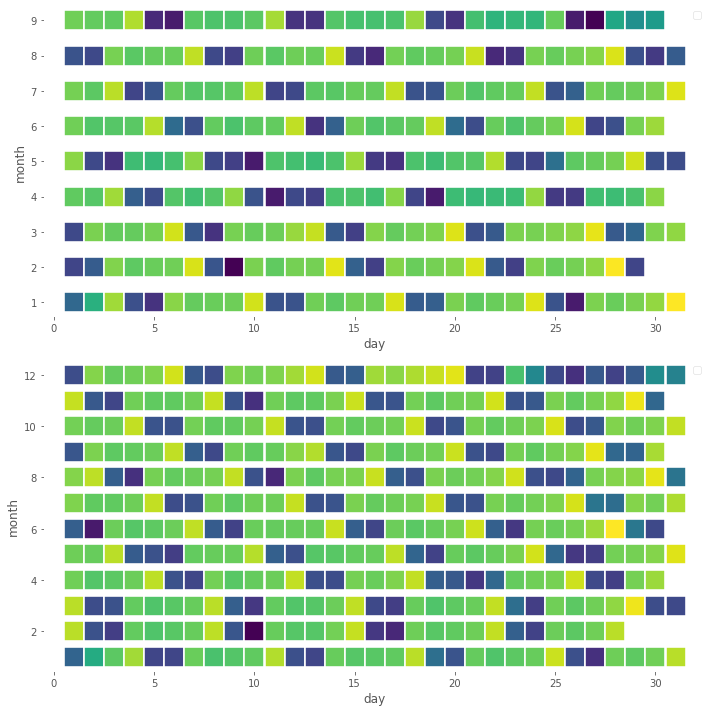

In [1397]:
fig, axs = plt.subplots(2, 1, figsize=(10, 10))

plt.grid()

sns.scatterplot(data = n_sold_df, x=n_sold_df[n_sold_df['year']==2020]['day'], 
                y=n_sold_df[n_sold_df['year']==2020]['month'], s=400, marker='s', 
                hue=n_sold_df[n_sold_df['year']==2020]['log_n_sold'], palette='viridis', ax=axs[0])

sns.scatterplot(data = n_sold_df, x=n_sold_df[n_sold_df['year']==2019]['day'], 
                y=n_sold_df[n_sold_df['year']==2019]['month'], s=400, marker='s', 
                hue=n_sold_df[n_sold_df['year']==2019]['log_n_sold'], palette='viridis', ax=axs[1])

axs[0].legend("")
axs[1].legend("")
plt.tight_layout()
plt.show()